In [8]:
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import os
import shutil
import cython
from ripser import ripser, plot_dgms
from scipy.fftpack import fft,ifft
import wfdb
from scipy import signal
from gwpy.spectrogram import Spectrogram

In [9]:

def theStart(aString):
    print(aString)
    theSamp = wfdb.rdsamp('/home/dr-dunstan/Downloads/training2017/' + aString)
    #fields = wfdb.rdrecord('/home/dr-dunstan/Downloads/training2017/A00061')
    #wfdb.plot_wfdb(record=fields, title='Record A00061 from Physionet Challenge 2017')

    theX = []
    for i in range(0,len(theSamp[0])):
    #print(theSamp[0][i][0])
        theX.append(theSamp[0][i][0])


#print(theX)
    values, ybins, xbins, im = plt.specgram(theX,Fs=300)
    print(xbins)
    #plt.xlabel('Time')

    #plt.ylabel('Frequency')

 

    plt.show()
    theGoodList = stepTwo(values,ybins,xbins,im)
    print("good List")
    print(theGoodList)
    longSegment = getLongestSegment(theGoodList)
    print("longest")
    print(longSegment)
    signalVals = getSignalVals(longSegment,theX,xbins)
    #print("Samp")
    #print(signalVals)
    plotSave(signalVals,aString)
    

In [10]:
def stepTwo(values,ybins,xbins,im):
    #print(theVal)
    theVal = values.transpose() 
    minFreq = 0
    maxFreq = 50
    minFreqIndex = ""
    maxFreqIndex = ""
    theThreshold = .0000001

    countMode = 0

    if (minFreq == 0):
        minFreqIndex = 0
        countMode = 1

    for i in range(len(ybins)-1):
        if(ybins[i] < minFreq and ybins[i+1] > minFreq):
            minFreqIndex = i+1
        if(ybins[i] < maxFreq and ybins[i+1] > maxFreq):
            maxFreqIndex = i

#print(minFreqIndex)
#print(maxFreqIndex)

    theList = []
    theList2 = []
    theGoodList = []
    countMode = 0
    badMode = 0

    for i in range(len(theVal)):
        for j in range(len(theVal[i])):
        #if freq is too low 
            if(j < minFreqIndex):
                if(theVal[i][j] > theThreshold):
                #print("Bad freq exsists (Low) at " + str(i))
                    if(countMode == 0):
                        theList.append(i)
                        countMode += 1
            elif(j > maxFreqIndex):
                if(theVal[i][j] > theThreshold):
                #print("Bad freq exsists (High) at " + str(i)
                    badMode += 1
                    if(countMode == 1):
                        theList2.append(i)
                        countMode += 1
                    
        if(badMode == 0):
            theGoodList.append(i)
        else:
            badMode = 0
    
        countMode = 0
        if(minFreq == 0):
            countMode = 1
    #print(len(theList))
    #print(len(theList2))
    return (theGoodList)

In [11]:
maxLen = 0
first = 0 
last = 0
temp = 0

def getLongestSegment(aList):
    maxLen = 0
    first = 0
    if(len(aList) != 0):
        last = aList[0]
        first = aList[0]
    aTemp = []
    aTemp2 = []
    aTemp3 = []
    maxList = []
    finalList = []
    maxIndex = 0
    for i in range(0,len(aList) -1):
        aTemp.append(aList[i+1] - aList[i])
    
    print(aTemp)
    
    for i in range(len(aTemp)):
        if(aTemp[i] != 1):
            aTemp[i] = "NO"
            
            
    
    for i in range(len(aTemp)):
        if(aTemp[i] != 1):
            aTemp3.append(aTemp2)
            aTemp2 = []
        else:
            aTemp2.append(i+1)
            #finTemp.append
    
    print("the temp 3")
    print(aTemp3)
    
    for element in aTemp3:
        if(maxIndex < len(element)):
            maxList = element
            maxIndex = len(element)
    
    for element in maxList:
        finalList.append(aList[element])
    
    #print(maxList)
    if(len(maxList) != 0):
        finalList.insert(0, aList[maxList[0]] - 1)
        
    
    print(finalList)    
    return(finalList)


def getSignalVals(aList,theSamp,timeList):
    theMin = 0
    theMax = 0
    print("indexList")
    print(aList)
    if(len(aList) != 0):
        theMin = int(timeList[aList[0]]) * 300
        theMax = int(timeList[aList[len(aList)-1]]) *300
        if(theMin == theMax):
            theMax = 300 + theMax
    print("theMin")
    print(theMin)
    print("theMax")
    print(theMax)
    #print(theSamp[theMin:theMax+1])
    return(theSamp[theMin:theMax+1])

#theFinal = getLongestSegment(theGoodList)
#theCleaned = getSignalVals(theFinal)
#print(theCleaned)



In [12]:
#nm#wfdb.wrsamp("A00061_clean",fs=300,sig_name=["ECG"],p_signal=theCleaned,units=["mV"],fmt=['16', '16'])

In [13]:
def plotSave(aList,aString):
    #print(aList)
    x = np.arange(len(aList))
    theCleanedFin = []
    for i in range(0,len(aList)):
        if(len(aList) > 1):
            theCleanedFin.append(aList[i])
        else:
            theCleanedFin.append(aList[i])
        
    y = theCleanedFin

    plt.plot(x,y)
    plt.show()
    z = open(aString +".txt","w")
    for i in range(len(aList)):
        z.write(str(aList[i])+"\n")
    z.close()

A00001
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


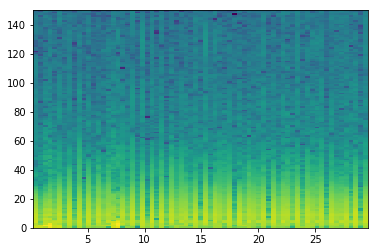

good List
[0, 1, 6, 8, 10, 12, 21, 23, 25, 27, 33, 36, 41, 45, 46, 55, 60, 62, 67]
[1, 5, 2, 2, 2, 9, 2, 2, 2, 6, 3, 5, 4, 1, 9, 5, 2, 5]
the temp 3
[[1], [], [], [], [], [], [], [], [], [], [], [], [14], [], [], []]
[0, 1]
longest
[0, 1]
indexList
[0, 1]
theMin
0
theMax
300


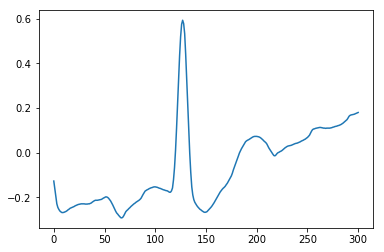

A00002
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


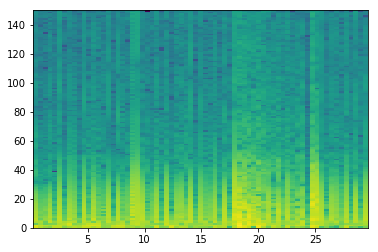

good List
[1, 2, 3, 4, 6, 9, 10, 11, 13, 14, 15, 16, 18, 19, 23, 24, 26, 28, 33, 36, 38, 56, 59, 60, 62, 63, 65, 67]
[1, 1, 1, 2, 3, 1, 1, 2, 1, 1, 1, 2, 1, 4, 1, 2, 2, 5, 3, 2, 18, 3, 1, 2, 1, 2, 2]
the temp 3
[[1, 2, 3], [], [6, 7], [9, 10, 11], [13], [15], [], [], [], [], [], [], [23], [25], []]
[1, 2, 3, 4]
longest
[1, 2, 3, 4]
indexList
[1, 2, 3, 4]
theMin
0
theMax
600


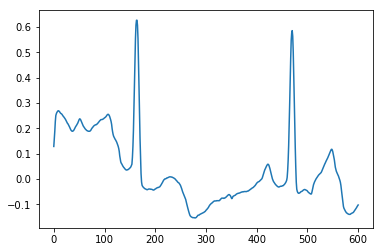

A00003
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

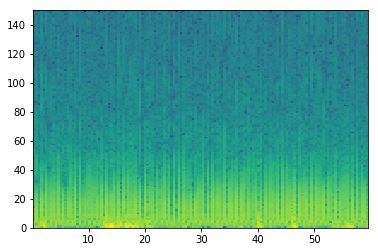

good List
[2, 20, 27, 34, 45, 50, 51, 57, 61, 73, 75, 86, 95, 97, 123, 131, 133]
[18, 7, 7, 11, 5, 1, 6, 4, 12, 2, 11, 9, 2, 26, 8, 2]
the temp 3
[[], [], [], [], [], [6], [], [], [], [], [], [], [], [], []]
[50, 51]
longest
[50, 51]
indexList
[50, 51]
theMin
6300
theMax
6600


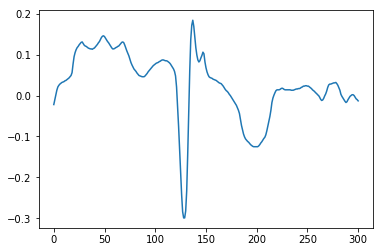

A00006
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


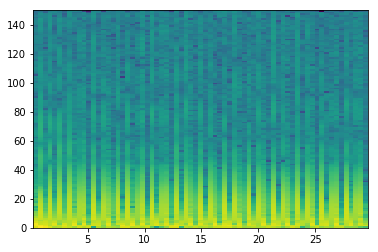

good List
[0, 2, 4, 6, 8, 9, 10, 11, 13, 14, 15, 16, 18, 20, 21, 23, 25, 26, 27, 28, 30, 31, 32, 33, 35, 36, 37, 38, 40, 42, 43, 45, 46, 47, 48, 50, 51, 52, 53, 55, 56, 57, 58, 60, 61, 62, 63, 65, 66, 67, 68]
[2, 2, 2, 2, 1, 1, 1, 2, 1, 1, 1, 2, 2, 1, 2, 2, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 2, 2, 1, 2, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1]
the temp 3
[[], [], [], [], [5, 6, 7], [9, 10, 11], [], [14], [], [17, 18, 19], [21, 22, 23], [25, 26, 27], [], [30], [32, 33, 34], [36, 37, 38], [40, 41, 42], [44, 45, 46]]
[8, 9, 10, 11]
longest
[8, 9, 10, 11]
indexList
[8, 9, 10, 11]
theMin
900
theMax
1500


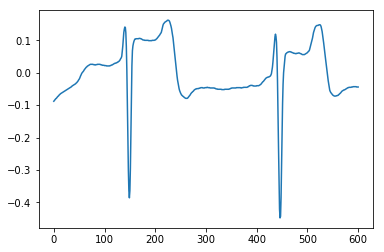

A00007
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


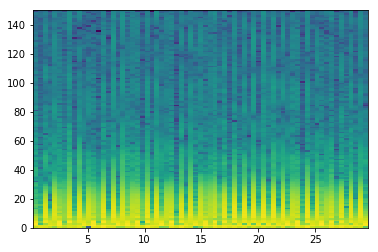

good List
[1, 6, 8, 10, 13, 15, 17, 22, 24, 29, 31, 35, 36, 38, 40, 42, 44, 46, 48, 55, 62, 64, 66]
[5, 2, 2, 3, 2, 2, 5, 2, 5, 2, 4, 1, 2, 2, 2, 2, 2, 2, 7, 7, 2, 2]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [12], [], [], [], [], [], [], [], [], []]
[35, 36]
longest
[35, 36]
indexList
[35, 36]
theMin
4500
theMax
4800


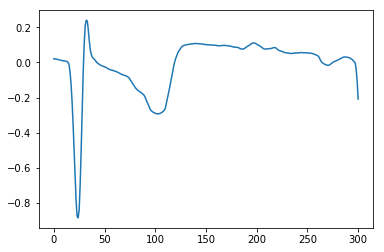

A00010
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

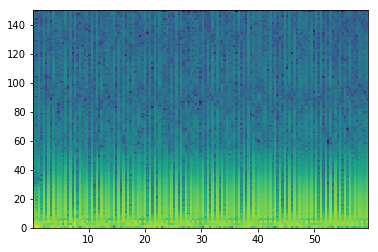

good List
[1, 2, 3, 5, 7, 9, 12, 14, 16, 18, 20, 21, 23, 25, 27, 29, 32, 34, 36, 38, 40, 42, 45, 47, 49, 51, 53, 56, 57, 58, 60, 62, 63, 64, 65, 66, 69, 71, 73, 75, 77, 79, 82, 84, 86, 88, 90, 92, 95, 97, 99, 101, 103, 105, 107, 109, 110, 111, 112, 113, 114, 116, 118, 120, 122, 124, 126, 128, 130, 133, 134]
[1, 1, 2, 2, 2, 3, 2, 2, 2, 2, 1, 2, 2, 2, 2, 3, 2, 2, 2, 2, 2, 3, 2, 2, 2, 2, 3, 1, 1, 2, 2, 1, 1, 1, 1, 3, 2, 2, 2, 2, 2, 3, 2, 2, 2, 2, 2, 3, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 3, 1]
the temp 3
[[1, 2], [], [], [], [], [], [], [], [11], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [28, 29], [], [32, 33, 34, 35], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [56, 57, 58, 59, 60], [], [], [], [], [], [], [], []]
[109, 110, 111, 112, 113, 114]
longest
[109, 110, 111, 112, 113, 114]
indexList
[109, 110, 111, 112, 113, 114]
theMin
13800
theMax
14700


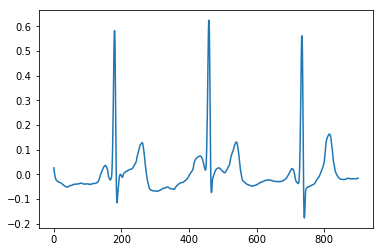

A00011
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


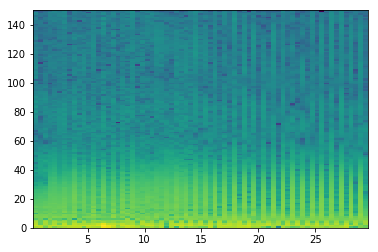

good List
[0, 1, 2, 5, 7, 9, 10, 11, 13, 15, 21, 23, 24, 37, 38, 40, 42, 44, 46, 48, 50, 52, 54, 58, 60, 62, 64, 66, 68]
[1, 1, 3, 2, 2, 1, 1, 2, 2, 6, 2, 1, 13, 1, 2, 2, 2, 2, 2, 2, 2, 2, 4, 2, 2, 2, 2, 2]
the temp 3
[[1, 2], [], [], [6, 7], [], [], [], [12], [14], [], [], [], [], [], [], [], [], [], [], [], [], []]
[0, 1, 2]
longest
[0, 1, 2]
indexList
[0, 1, 2]
theMin
0
theMax
300


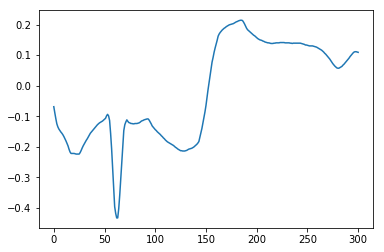

A00012
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


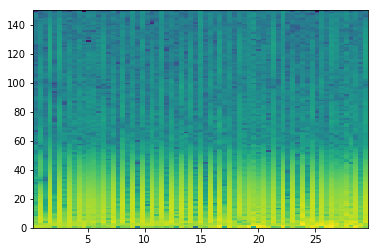

good List
[0, 2, 4, 6, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33, 35, 37, 39, 41, 48, 50, 52, 54, 56, 58, 60, 63, 67]
[2, 2, 2, 9, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 7, 2, 2, 2, 2, 2, 2, 3, 4]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


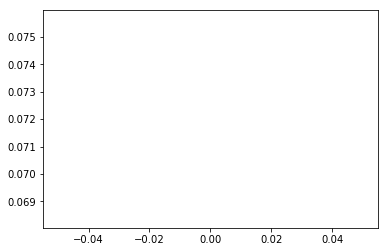

A00014
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92      ]


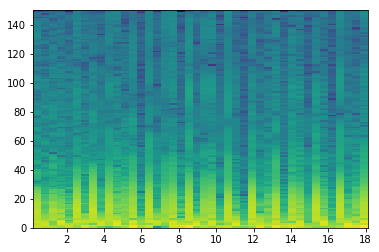

good List
[13, 18, 25, 26, 31]
[5, 7, 1, 5]
the temp 3
[[], [], [3]]
[25, 26]
longest
[25, 26]
indexList
[25, 26]
theMin
3300
theMax
3600


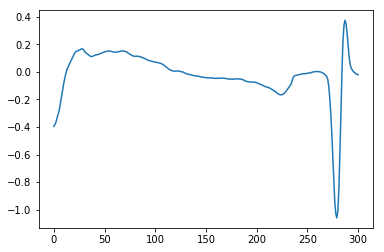

A00016
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


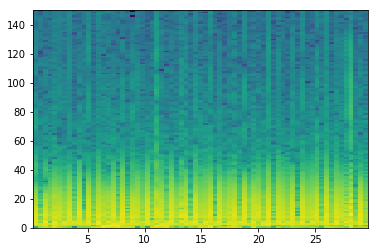

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


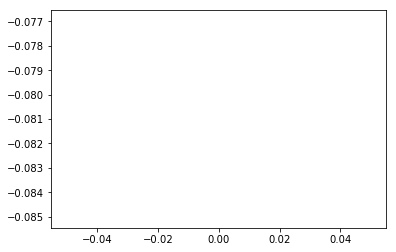

A00018
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


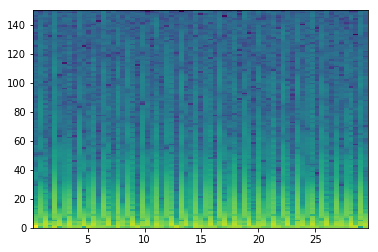

good List
[0, 1, 2, 3, 6, 8, 10, 11, 12, 13, 15, 16, 18, 21, 23, 24, 26, 28, 29, 31, 32, 34, 35, 37, 40, 42, 44, 45, 47, 48, 50, 52, 53, 55, 56, 58, 60, 61, 63, 64, 66, 68]
[1, 1, 1, 3, 2, 2, 1, 1, 1, 2, 1, 2, 3, 2, 1, 2, 2, 1, 2, 1, 2, 1, 2, 3, 2, 2, 1, 2, 1, 2, 2, 1, 2, 1, 2, 2, 1, 2, 1, 2, 2]
the temp 3
[[1, 2, 3], [], [], [7, 8, 9], [11], [], [], [15], [], [18], [20], [22], [], [], [], [27], [29], [], [32], [34], [], [37], [39], []]
[0, 1, 2, 3]
longest
[0, 1, 2, 3]
indexList
[0, 1, 2, 3]
theMin
0
theMax
300


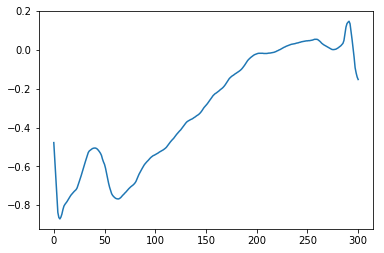

A00019
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

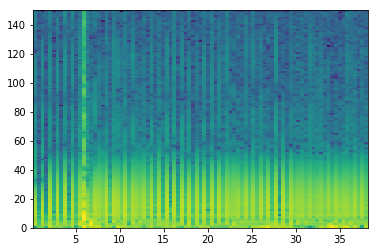

good List
[1, 3, 4, 5, 7, 9, 11, 15, 20, 22, 23, 25, 32, 34, 36, 38, 40, 42, 44, 46, 48, 50, 52, 53, 55, 57, 59, 62, 63, 65, 67, 69, 70, 74, 75, 76, 77, 79, 81, 84, 86, 88]
[2, 1, 1, 2, 2, 2, 4, 5, 2, 1, 2, 7, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 3, 1, 2, 2, 2, 1, 4, 1, 1, 1, 2, 2, 3, 2, 2]
the temp 3
[[], [2, 3], [], [], [], [], [], [10], [], [], [], [], [], [], [], [], [], [], [], [23], [], [], [], [28], [], [], [32], [34, 35, 36], [], [], [], []]
[74, 75, 76, 77]
longest
[74, 75, 76, 77]
indexList
[74, 75, 76, 77]
theMin
9600
theMax
9900


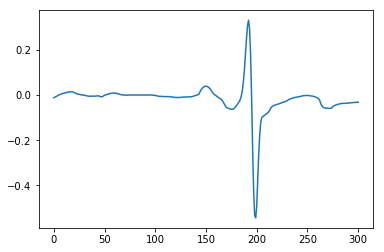

A00021
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


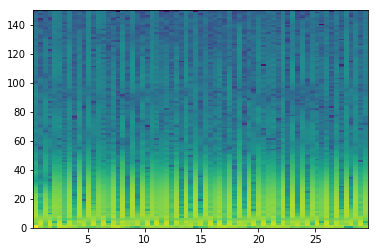

good List
[1, 6, 8, 10, 12, 17, 19, 21, 23, 30, 34, 36, 37, 39, 41, 43, 45, 48, 50, 52, 54, 56, 59, 61, 63, 67]
[5, 2, 2, 2, 5, 2, 2, 2, 7, 4, 2, 1, 2, 2, 2, 2, 3, 2, 2, 2, 2, 3, 2, 2, 4]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [12], [], [], [], [], [], [], [], [], [], [], [], []]
[36, 37]
longest
[36, 37]
indexList
[36, 37]
theMin
4500
theMax
4800


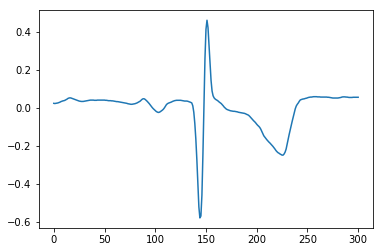

A00025
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


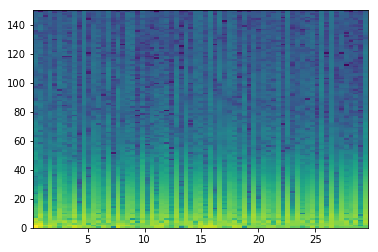

good List
[2, 7, 9, 11, 14, 16, 21, 28, 30, 32, 35, 37, 42, 44, 46, 51, 53, 58, 60, 62, 67]
[5, 2, 2, 3, 2, 5, 7, 2, 2, 3, 2, 5, 2, 2, 5, 2, 5, 2, 2, 5]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


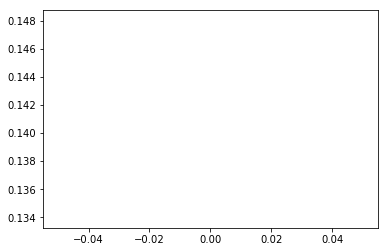

A00026
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


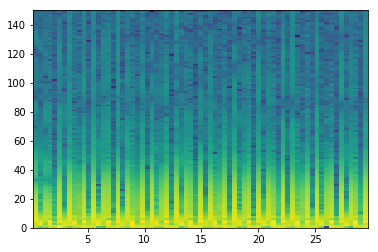

good List
[2, 4, 6, 8, 9, 11, 13, 16, 18, 20, 21, 23, 26, 28, 33, 35, 38, 40, 42, 45, 47, 50, 52, 54, 55, 57, 59, 60, 62, 67]
[2, 2, 2, 1, 2, 2, 3, 2, 2, 1, 2, 3, 2, 5, 2, 3, 2, 2, 3, 2, 3, 2, 2, 1, 2, 2, 1, 2, 5]
the temp 3
[[], [], [], [4], [], [], [], [], [10], [], [], [], [], [], [], [], [], [], [], [], [], [24], [], [27], []]
[8, 9]
longest
[8, 9]
indexList
[8, 9]
theMin
900
theMax
1200


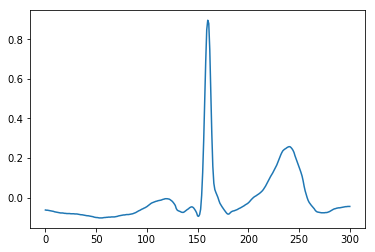

A00028
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

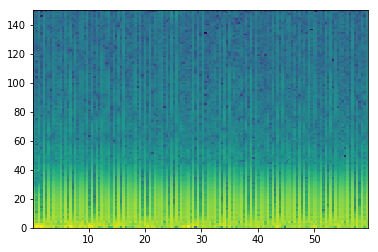

good List
[1, 3, 5, 7, 8, 12, 16, 18, 21, 23, 25, 27, 32, 34, 36, 38, 39, 43, 45, 47, 49, 51, 54, 56, 58, 60, 63, 65, 67, 69, 71, 74, 76, 78, 80, 87, 89, 91, 94, 95, 96, 98, 100, 102, 104, 107, 109, 111, 113, 115, 118, 119, 120, 122, 124, 127, 128, 129, 131, 133, 135]
[2, 2, 2, 1, 4, 4, 2, 3, 2, 2, 2, 5, 2, 2, 2, 1, 4, 2, 2, 2, 2, 3, 2, 2, 2, 3, 2, 2, 2, 2, 3, 2, 2, 2, 7, 2, 2, 3, 1, 1, 2, 2, 2, 2, 3, 2, 2, 2, 2, 3, 1, 1, 2, 2, 3, 1, 1, 2, 2, 2]
the temp 3
[[], [], [], [4], [], [], [], [], [], [], [], [], [], [], [16], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [39, 40], [], [], [], [], [], [], [], [], [], [51, 52], [], [], [56, 57], [], []]
[94, 95, 96]
longest
[94, 95, 96]
indexList
[94, 95, 96]
theMin
12000
theMax
12300


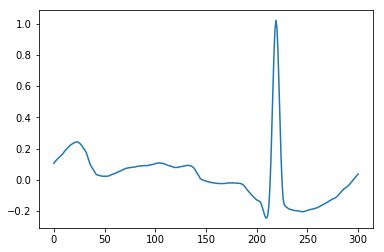

A00031
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


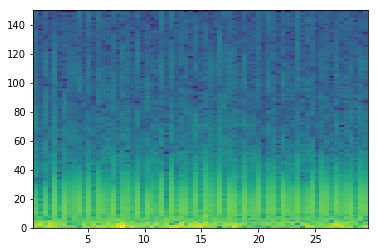

good List
[1, 3, 5, 7, 8, 9, 10, 12, 13, 20, 22, 27, 37, 42, 47, 50, 53, 58, 60, 61, 63]
[2, 2, 2, 1, 1, 1, 2, 1, 7, 2, 5, 10, 5, 5, 3, 3, 5, 2, 1, 2]
the temp 3
[[], [], [], [4, 5, 6], [8], [], [], [], [], [], [], [], [], [], [19]]
[7, 8, 9, 10]
longest
[7, 8, 9, 10]
indexList
[7, 8, 9, 10]
theMin
900
theMax
1200


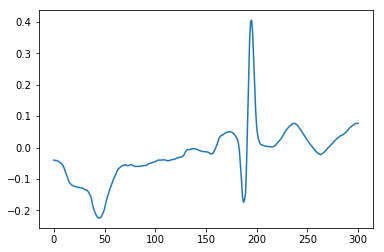

A00032
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16      ]


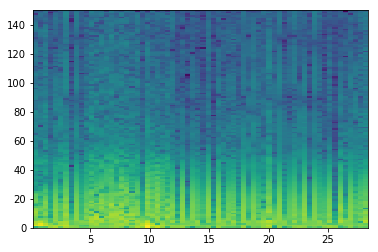

good List
[3, 7, 9, 21, 30, 33, 35, 47, 49, 50, 54, 56, 57, 59]
[4, 2, 12, 9, 3, 2, 12, 2, 1, 4, 2, 1, 2]
the temp 3
[[], [], [], [], [], [], [], [], [9], [], [12]]
[49, 50]
longest
[49, 50]
indexList
[49, 50]
theMin
6300
theMax
6600


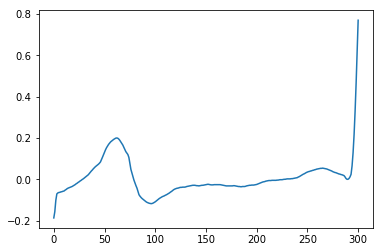

A00033
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


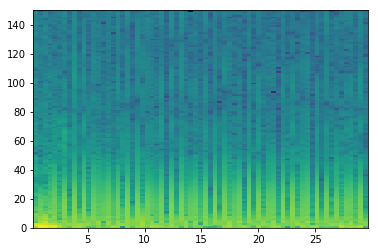

good List
[9, 14, 16, 20, 25, 27, 29, 31, 32, 33, 34, 36, 38, 41, 42, 43, 45, 47, 50, 52, 57, 59, 61, 63, 66, 68]
[5, 2, 4, 5, 2, 2, 2, 1, 1, 1, 2, 2, 3, 1, 1, 2, 2, 3, 2, 5, 2, 2, 2, 3, 2]
the temp 3
[[], [], [], [], [], [], [], [8, 9, 10], [], [], [14, 15], [], [], [], [], [], [], [], [], []]
[31, 32, 33, 34]
longest
[31, 32, 33, 34]
indexList
[31, 32, 33, 34]
theMin
3900
theMax
4200


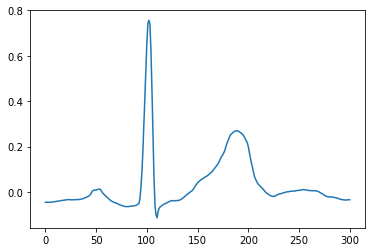

A00035
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


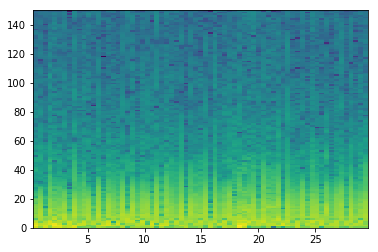

good List
[31, 36, 61]
[5, 25]
the temp 3
[[], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


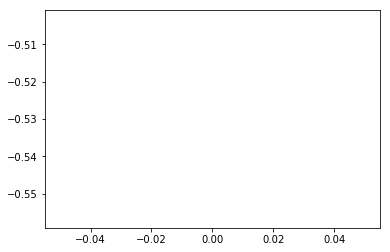

A00036
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


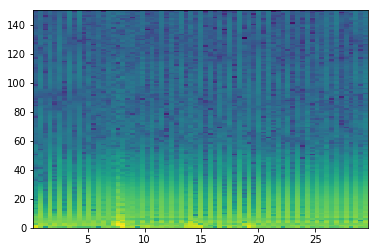

good List
[2, 4, 6, 8, 10, 12, 14, 23, 27, 29, 35, 37, 39, 41, 45, 47, 48, 49, 51, 53, 55, 57, 59, 61, 63, 65, 67]
[2, 2, 2, 2, 2, 2, 9, 4, 2, 6, 2, 2, 2, 4, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [16, 17], [], [], [], [], [], [], [], []]
[47, 48, 49]
longest
[47, 48, 49]
indexList
[47, 48, 49]
theMin
6000
theMax
6300


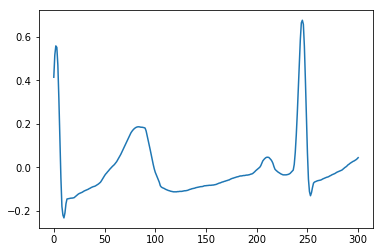

A00037
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

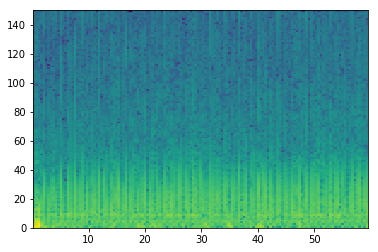

good List
[5, 10, 26, 36, 47, 78, 89, 103, 105, 106, 114]
[5, 16, 10, 11, 31, 11, 14, 2, 1, 8]
the temp 3
[[], [], [], [], [], [], [], [], [9]]
[105, 106]
longest
[105, 106]
indexList
[105, 106]
theMin
13500
theMax
13800


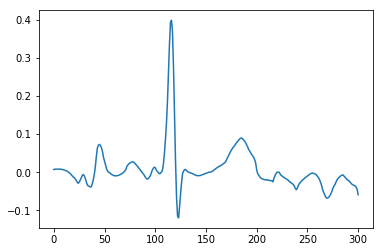

A00039
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


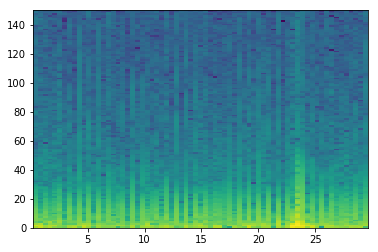

good List
[6, 8, 10, 14, 16, 17, 18, 19, 21, 24, 26, 28, 30, 32, 36, 41, 43, 45, 49, 51, 58, 60, 62, 65, 67]
[2, 2, 4, 2, 1, 1, 1, 2, 3, 2, 2, 2, 2, 4, 5, 2, 2, 4, 2, 7, 2, 2, 3, 2]
the temp 3
[[], [], [], [], [5, 6, 7], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[16, 17, 18, 19]
longest
[16, 17, 18, 19]
indexList
[16, 17, 18, 19]
theMin
2100
theMax
2400


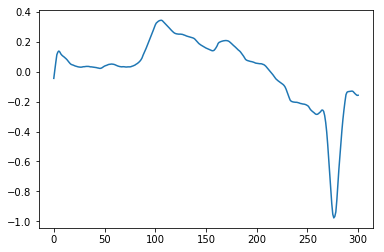

A00040
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


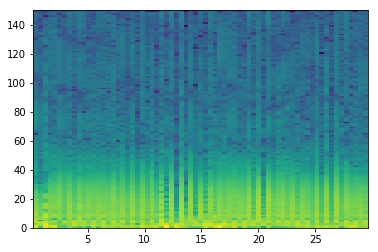

good List
[1, 8, 15, 19, 21, 22, 25, 29, 31, 33, 34, 35, 42, 43, 47, 49, 53, 55, 57, 59, 61, 63, 64, 65, 67, 68]
[7, 7, 4, 2, 1, 3, 4, 2, 2, 1, 1, 7, 1, 4, 2, 4, 2, 2, 2, 2, 2, 1, 1, 2, 1]
the temp 3
[[], [], [], [], [5], [], [], [], [10, 11], [13], [], [], [], [], [], [], [], [22, 23]]
[33, 34, 35]
longest
[33, 34, 35]
indexList
[33, 34, 35]
theMin
4200
theMax
4500


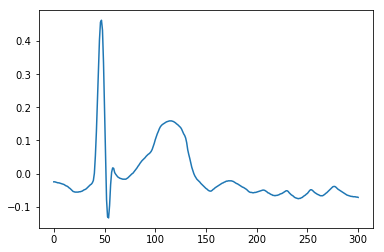

A00042
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


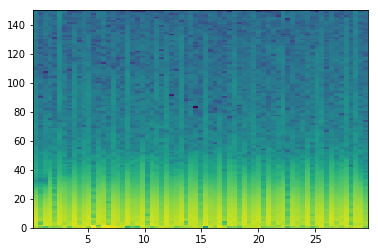

good List
[7, 12, 31, 36, 44, 52, 55]
[5, 19, 5, 8, 8, 3]
the temp 3
[[], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


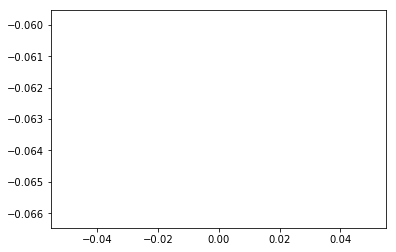

A00044
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


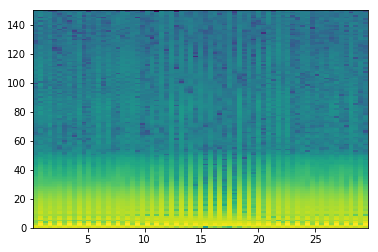

good List
[0, 4, 6, 10, 23, 27, 29, 33, 35, 37, 39, 41, 43, 45, 47, 53, 57, 59, 67, 68]
[4, 2, 4, 13, 4, 2, 4, 2, 2, 2, 2, 2, 2, 2, 6, 4, 2, 8, 1]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


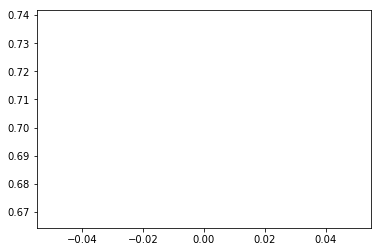

A00045
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


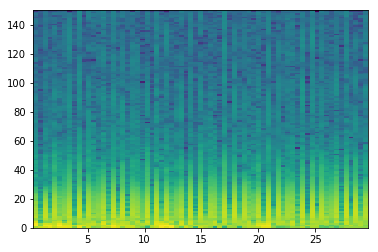

good List
[1, 3, 6, 8, 10, 13, 15, 22, 24, 26, 28, 29, 31, 33, 35, 38, 40, 42, 45, 47, 49, 51, 54, 56, 61, 63, 65, 67]
[2, 3, 2, 2, 3, 2, 7, 2, 2, 2, 1, 2, 2, 2, 3, 2, 2, 3, 2, 2, 2, 3, 2, 5, 2, 2, 2]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [11], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[28, 29]
longest
[28, 29]
indexList
[28, 29]
theMin
3600
theMax
3900


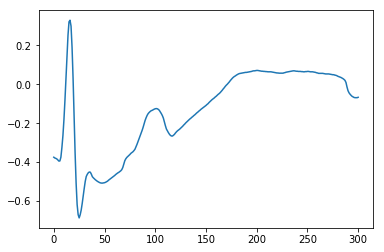

A00046
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


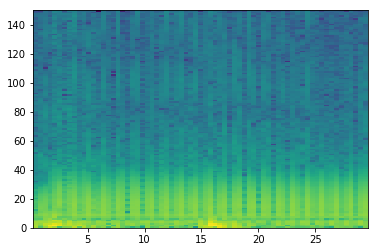

good List
[19, 22, 61, 62, 63]
[3, 39, 1, 1]
the temp 3
[[], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


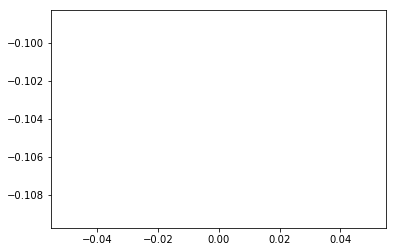

A00048
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


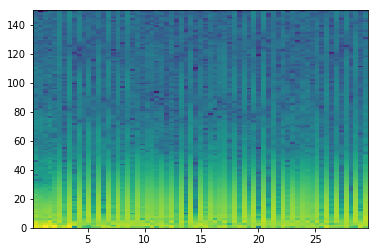

good List
[1, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 25, 27, 29, 31, 33, 35, 40, 42, 44, 46, 48, 50, 51, 52, 53, 54, 55, 57, 59, 61, 63, 65, 67]
[1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 5, 2, 2, 2, 2, 2, 5, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2]
the temp 3
[[1], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [23, 24, 25, 26, 27], [], [], [], [], []]
[50, 51, 52, 53, 54, 55]
longest
[50, 51, 52, 53, 54, 55]
indexList
[50, 51, 52, 53, 54, 55]
theMin
6300
theMax
6900


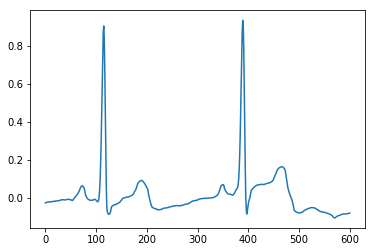

A00049
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


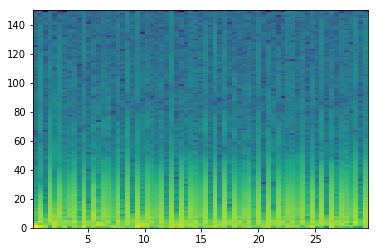

good List
[0, 2, 6, 7, 9, 11, 12, 13, 14, 15, 16, 18, 20, 22, 23, 24, 25, 26, 27, 29, 30, 31, 32, 34, 36, 38, 39, 40, 41, 42, 43, 44, 45, 47, 49, 50, 51, 52, 53, 54, 56, 58, 60, 61, 62, 65, 67]
[2, 4, 1, 2, 2, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 3, 2]
the temp 3
[[], [], [3], [], [6, 7, 8, 9, 10], [], [], [14, 15, 16, 17, 18], [20, 21, 22], [], [], [26, 27, 28, 29, 30, 31, 32], [], [35, 36, 37, 38, 39], [], [], [43, 44], []]
[38, 39, 40, 41, 42, 43, 44, 45]
longest
[38, 39, 40, 41, 42, 43, 44, 45]
indexList
[38, 39, 40, 41, 42, 43, 44, 45]
theMin
4800
theMax
5700


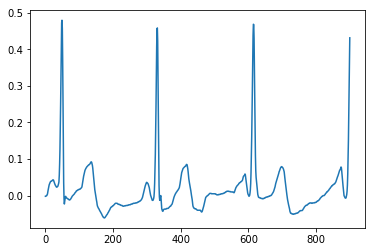

A00050
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


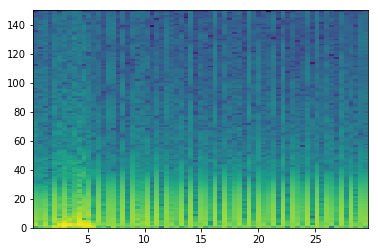

good List
[17, 19, 33, 43, 50, 52, 62, 66]
[2, 14, 10, 7, 2, 10, 4]
the temp 3
[[], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


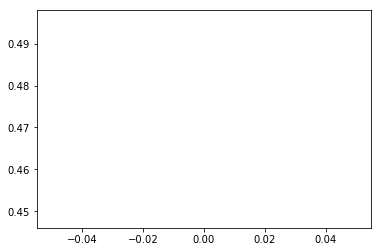

A00051
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

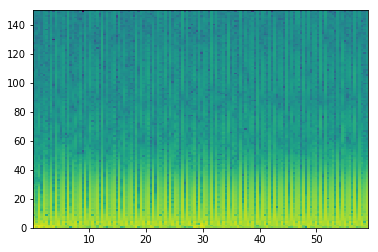

good List
[0, 1, 3, 6, 8, 13, 16, 18, 20, 25, 27, 29, 31, 32, 34, 36, 41, 43, 48, 50, 53, 55, 60, 67, 72, 74, 76, 77, 79, 81, 84, 86, 91, 93, 96, 103, 105, 108, 110, 112, 117, 119, 121, 124, 126, 133, 136]
[1, 2, 3, 2, 5, 3, 2, 2, 5, 2, 2, 2, 1, 2, 2, 5, 2, 5, 2, 3, 2, 5, 7, 5, 2, 2, 1, 2, 2, 3, 2, 5, 2, 3, 7, 2, 3, 2, 2, 5, 2, 2, 3, 2, 7, 3]
the temp 3
[[1], [], [], [], [], [], [], [], [], [], [], [13], [], [], [], [], [], [], [], [], [], [], [], [], [27], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[0, 1]
longest
[0, 1]
indexList
[0, 1]
theMin
0
theMax
300


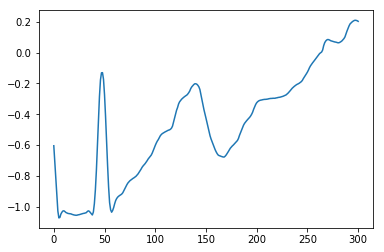

A00052
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333]


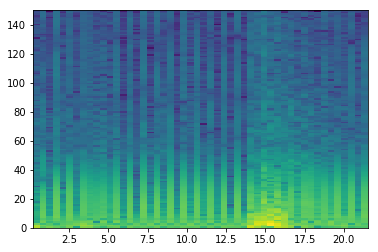

good List
[11, 15, 21, 23, 25, 27, 29, 31]
[4, 6, 2, 2, 2, 2, 2]
the temp 3
[[], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


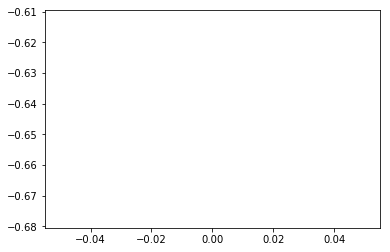

A00053
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


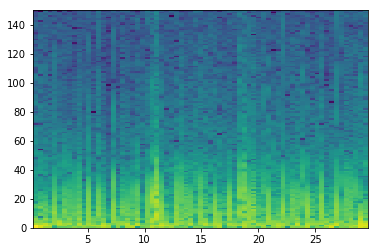

good List
[3, 8, 10, 12, 15, 17, 46]
[5, 2, 2, 3, 2, 29]
the temp 3
[[], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


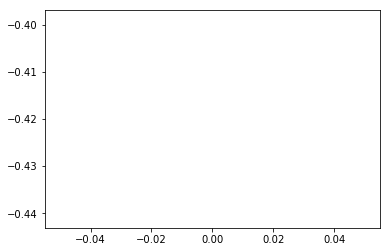

A00057
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333]


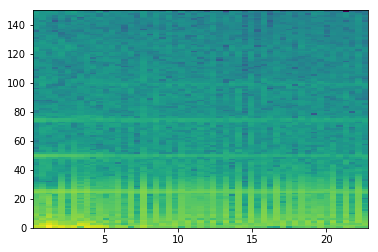

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


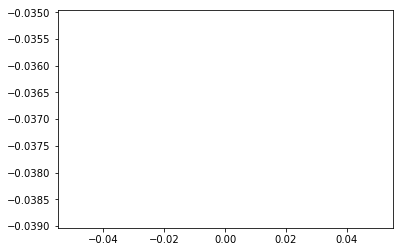

A00059
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

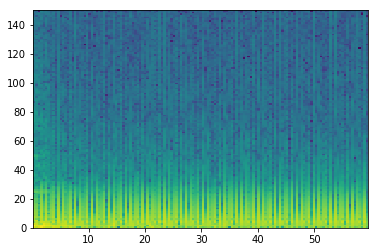

good List
[7, 9, 11, 14, 16, 17, 18, 20, 21, 23, 25, 26, 27, 28, 30, 32, 34, 35, 36, 37, 38, 39, 41, 42, 44, 46, 47, 49, 51, 53, 55, 56, 58, 60, 62, 63, 64, 65, 66, 67, 68, 69, 71, 73, 74, 75, 76, 78, 80, 81, 83, 84, 85, 87, 88, 90, 92, 93, 94, 95, 96, 97, 99, 101, 102, 103, 104, 106, 108, 109, 110, 111, 112, 113, 115, 116, 117, 118, 119, 120, 122, 124, 125, 126, 127, 128, 129, 130, 131, 133, 134, 135, 136, 138]
[2, 2, 3, 2, 1, 1, 2, 1, 2, 2, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 2, 1, 2, 2, 1, 2, 2, 2, 2, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 2, 2, 1, 2, 1, 1, 2, 1, 2, 2, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2]
the temp 3
[[], [], [], [], [5, 6], [8], [], [11, 12, 13], [], [], [17, 18, 19, 20, 21], [23], [], [26], [], [], [], [31], [], [], [35, 36, 37, 38, 39, 40, 41], [], [44, 45, 46], [], [49], [51, 52], [54], [], [57, 58, 59, 60, 61], [], [64, 65, 66], [], [69, 70, 71, 72, 73], [75, 76, 77, 78, 79], [], [82

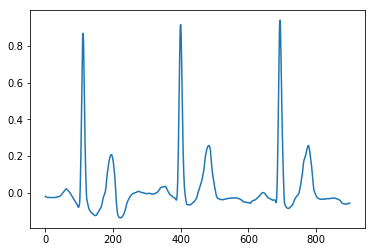

A00060
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

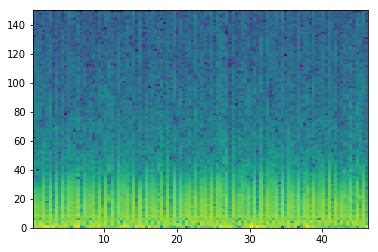

good List
[6, 8, 20, 22, 26, 33, 46, 48, 49, 51, 55, 56, 63, 65, 67, 72, 74, 94, 98, 99, 107]
[2, 12, 2, 4, 7, 13, 2, 1, 2, 4, 1, 7, 2, 2, 5, 2, 20, 4, 1, 8]
the temp 3
[[], [], [], [], [], [], [], [8], [], [11], [], [], [], [], [], [], [19]]
[48, 49]
longest
[48, 49]
indexList
[48, 49]
theMin
6000
theMax
6300


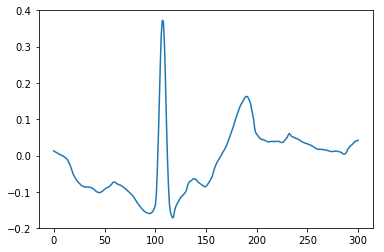

A00062
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


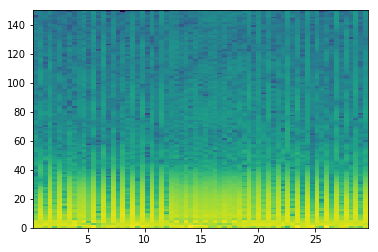

good List
[2, 4, 5, 6, 9, 11, 13, 15, 17, 21, 23, 25, 30, 32, 38, 49, 57, 61, 63, 65]
[2, 1, 1, 3, 2, 2, 2, 2, 4, 2, 2, 5, 2, 6, 11, 8, 4, 2, 2]
the temp 3
[[], [2, 3], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[4, 5, 6]
longest
[4, 5, 6]
indexList
[4, 5, 6]
theMin
600
theMax
900


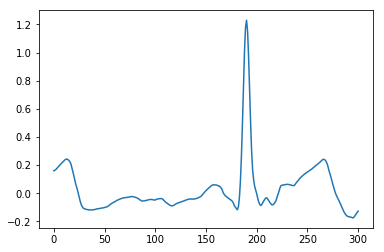

A00063
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

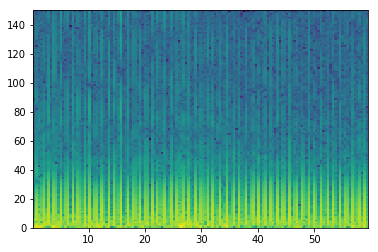

good List
[0, 2, 3, 5, 7, 8, 9, 10, 12, 13, 14, 15, 17, 19, 20, 22, 24, 25, 26, 27, 28, 29, 30, 32, 34, 35, 37, 38, 40, 41, 42, 43, 45, 48, 50, 52, 53, 54, 55, 56, 58, 59, 63, 65, 66, 67, 68, 69, 70, 71, 73, 75, 76, 77, 78, 79, 81, 82, 84, 86, 87, 88, 89, 90, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 107, 108, 109, 110, 112, 113, 114, 115, 116, 117, 118, 120, 121, 123, 124, 125, 126, 127, 128, 129, 130, 131, 133, 134, 135, 136, 138]
[2, 1, 2, 2, 1, 1, 1, 2, 1, 1, 1, 2, 2, 1, 2, 2, 1, 1, 1, 1, 1, 1, 2, 2, 1, 2, 1, 2, 1, 1, 1, 2, 3, 2, 2, 1, 1, 1, 1, 2, 1, 4, 2, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 2, 1, 2, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2]
the temp 3
[[], [2], [], [5, 6, 7], [9, 10, 11], [], [14], [], [17, 18, 19, 20, 21, 22], [], [25], [27], [29, 30, 31], [], [], [], [36, 37, 38, 39], [41], [], [44, 45, 46, 47, 48, 49], [], [52, 53, 54, 55], [57], [], [60, 61, 62, 

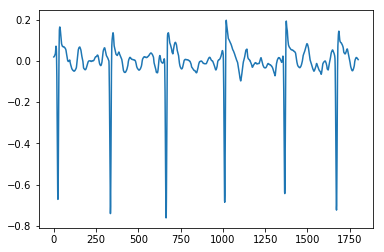

A00064
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


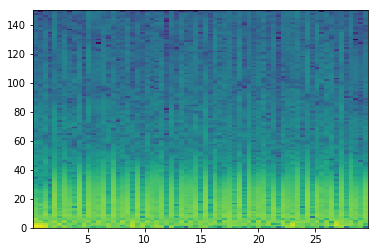

good List
[10, 27, 45, 50, 64, 67]
[17, 18, 5, 14, 3]
the temp 3
[[], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


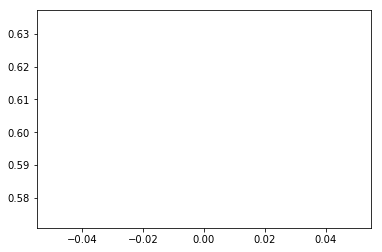

A00068
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

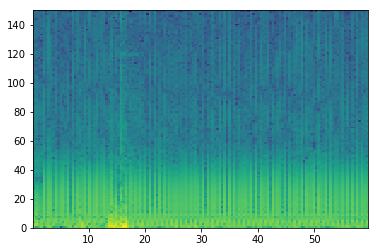

good List
[5, 10, 13, 15, 17, 22, 24, 30, 45, 47, 49, 51, 55, 57, 58, 59, 60, 64, 68, 69, 71, 73, 76, 78, 80, 82, 84, 91, 93, 95, 98, 99, 100, 103, 105, 107, 112, 122, 124, 127, 129, 131, 133, 135]
[5, 3, 2, 2, 5, 2, 6, 15, 2, 2, 2, 4, 2, 1, 1, 1, 4, 4, 1, 2, 2, 3, 2, 2, 2, 2, 7, 2, 2, 3, 1, 1, 3, 2, 2, 5, 10, 2, 3, 2, 2, 2, 2]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], [14, 15, 16], [], [19], [], [], [], [], [], [], [], [], [], [], [31, 32], [], [], [], [], [], [], [], [], [], []]
[57, 58, 59, 60]
longest
[57, 58, 59, 60]
indexList
[57, 58, 59, 60]
theMin
7200
theMax
7800


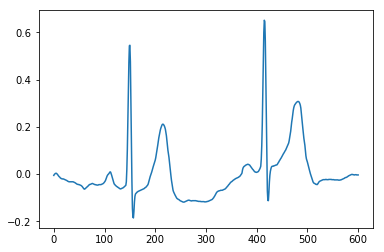

A00072
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


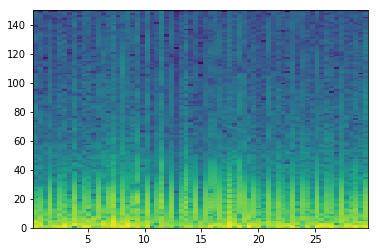

good List
[24, 29, 34]
[5, 5]
the temp 3
[[], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


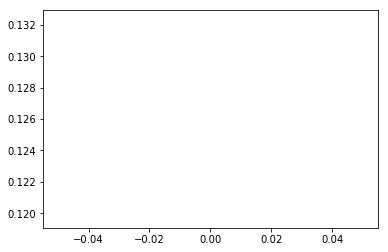

A00073
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


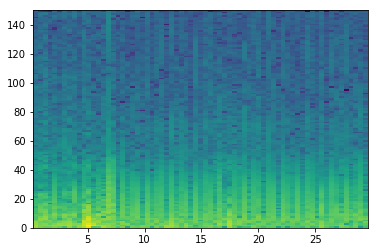

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


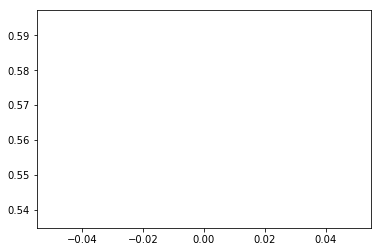

A00076
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


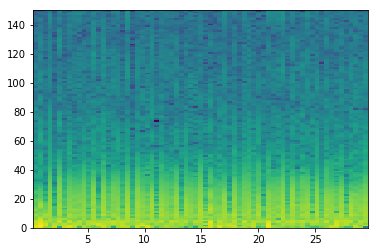

good List
[4, 20, 25, 27, 33, 40, 47, 59, 61]
[16, 5, 2, 6, 7, 7, 12, 2]
the temp 3
[[], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


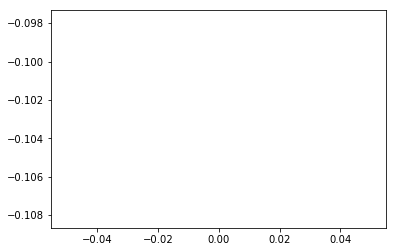

A00079
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


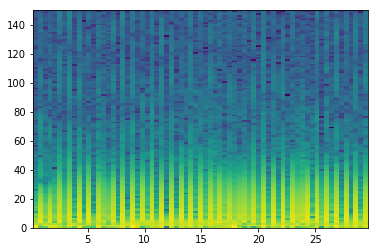

good List
[0, 2, 4, 6, 8, 10, 12, 15, 17, 19, 21, 25, 27, 29, 31, 39, 40, 41, 42, 44, 46, 48, 49, 52, 59, 61, 63, 65, 67]
[2, 2, 2, 2, 2, 2, 3, 2, 2, 2, 4, 2, 2, 2, 8, 1, 1, 1, 2, 2, 2, 1, 3, 7, 2, 2, 2, 2]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [16, 17, 18], [], [], [22], [], [], [], [], []]
[39, 40, 41, 42]
longest
[39, 40, 41, 42]
indexList
[39, 40, 41, 42]
theMin
5100
theMax
5400


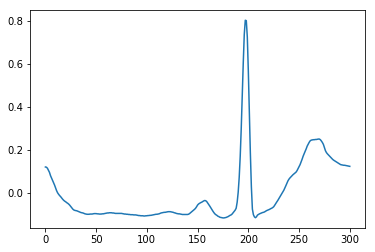

A00080
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


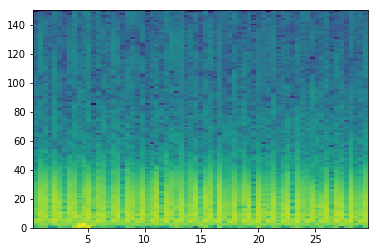

good List
[21]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


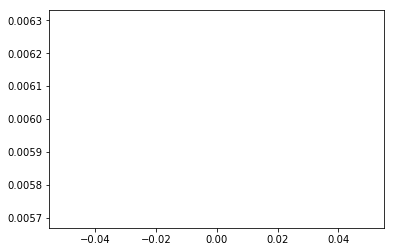

A00081
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

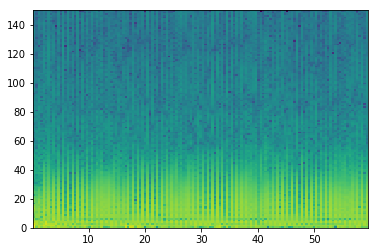

good List
[11, 17, 19, 25, 40, 44, 52, 81, 83, 85]
[6, 2, 6, 15, 4, 8, 29, 2, 2]
the temp 3
[[], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


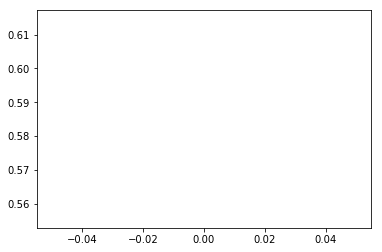

A00084
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


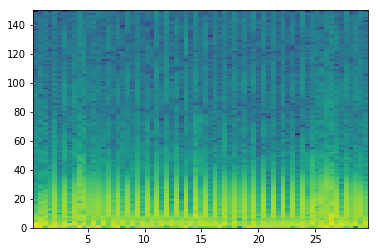

good List
[3, 5, 7, 11, 14, 16, 19, 20, 22, 24, 26, 28, 30, 31, 32, 36, 38, 40, 42, 44, 46, 48, 49, 50, 52, 54, 63, 65]
[2, 2, 4, 3, 2, 3, 1, 2, 2, 2, 2, 2, 1, 1, 4, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 9, 2]
the temp 3
[[], [], [], [], [], [], [7], [], [], [], [], [13, 14], [], [], [], [], [], [], [22, 23], [], [], []]
[30, 31, 32]
longest
[30, 31, 32]
indexList
[30, 31, 32]
theMin
3900
theMax
4200


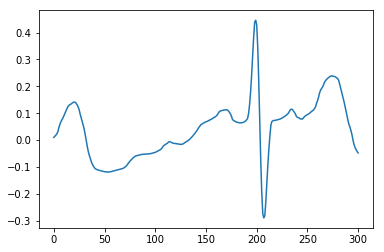

A00085
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


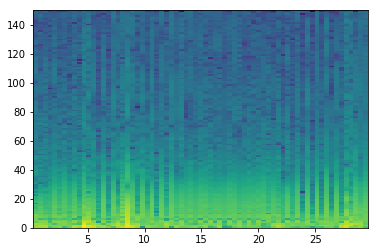

good List
[13, 31, 51, 53, 55, 57]
[18, 20, 2, 2, 2]
the temp 3
[[], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


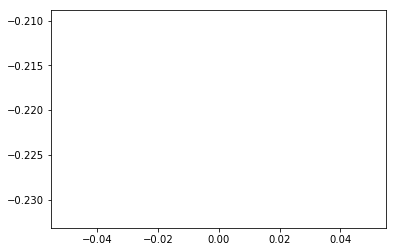

A00086
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


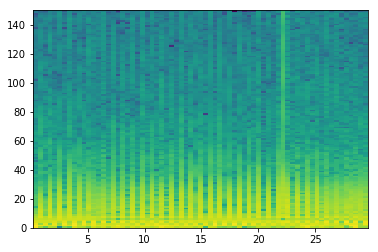

good List
[4, 6, 17, 31, 43, 47, 49]
[2, 11, 14, 12, 4, 2]
the temp 3
[[], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


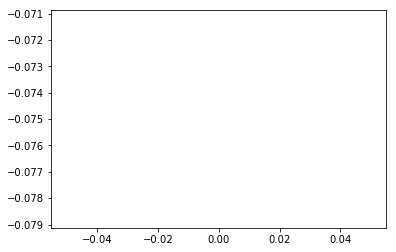

A00089
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


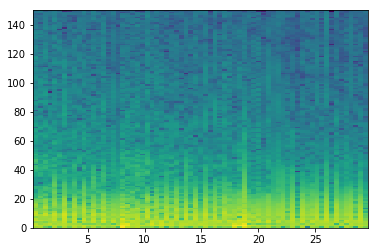

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


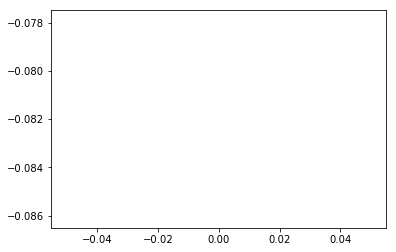

A00091
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


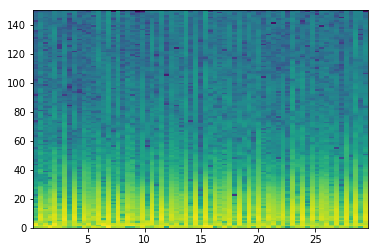

good List
[0, 5, 7, 9, 12, 18, 21, 23, 27, 32, 34, 36, 41, 45, 48, 49, 50, 52, 56, 62, 63, 65, 67]
[5, 2, 2, 3, 6, 3, 2, 4, 5, 2, 2, 5, 4, 3, 1, 1, 2, 4, 6, 1, 2, 2]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], [], [15, 16], [], [], [20], []]
[48, 49, 50]
longest
[48, 49, 50]
indexList
[48, 49, 50]
theMin
6000
theMax
6300


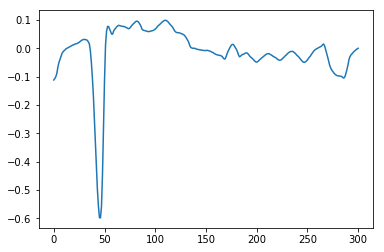

A00093
[ 0.42666667  0.85333333  1.28        1.70666667  2.13333333
  2.56        2.98666667  3.41333333  3.84        4.26666667
  4.69333333  5.12        5.54666667  5.97333333  6.4         6.82666667
  7.25333333  7.68        8.10666667  8.53333333  8.96
  9.38666667]


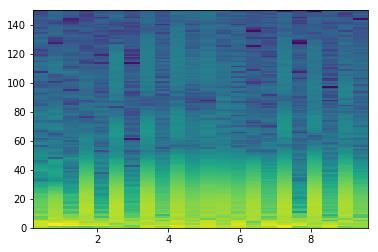

good List
[2, 6, 8, 14, 15, 17]
[4, 2, 6, 1, 2]
the temp 3
[[], [], [], [4]]
[14, 15]
longest
[14, 15]
indexList
[14, 15]
theMin
1800
theMax
2100


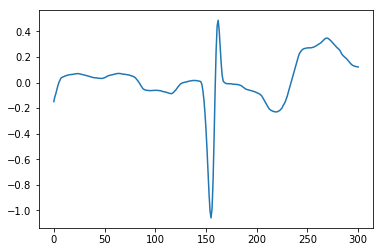

A00094
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


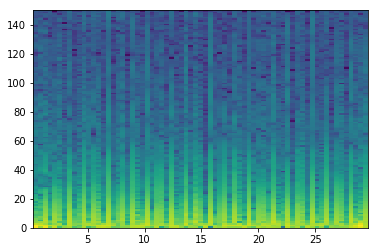

good List
[6, 8, 14, 16, 19, 22, 35, 40, 43, 48, 50, 51, 53, 56, 61, 64]
[2, 6, 2, 3, 3, 13, 5, 3, 5, 2, 1, 2, 3, 5, 3]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [11], [], [], []]
[50, 51]
longest
[50, 51]
indexList
[50, 51]
theMin
6300
theMax
6600


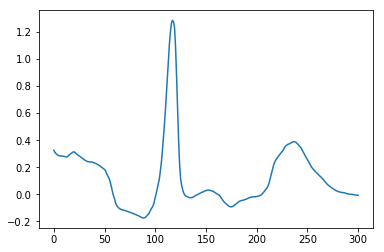

A00095
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


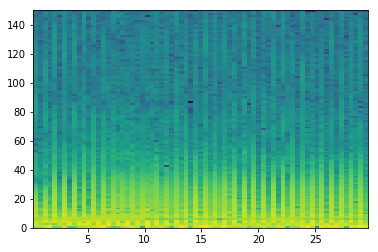

good List
[1, 3, 5, 7, 9, 13, 28, 30, 32, 36, 38, 40, 42, 44, 46, 48, 50, 54, 56, 58, 60, 62, 64, 66, 68]
[2, 2, 2, 2, 4, 15, 2, 2, 4, 2, 2, 2, 2, 2, 2, 2, 4, 2, 2, 2, 2, 2, 2, 2]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


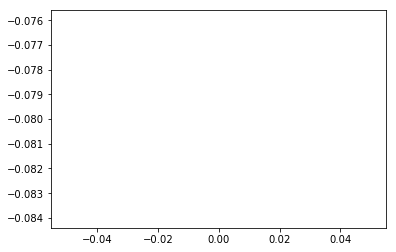

A00097
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


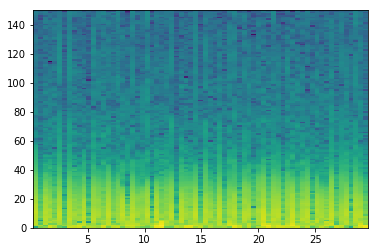

good List
[1, 6, 9, 11, 16, 29, 33, 34, 39, 45, 68]
[5, 3, 2, 5, 13, 4, 1, 5, 6, 23]
the temp 3
[[], [], [], [], [], [], [7], [], []]
[33, 34]
longest
[33, 34]
indexList
[33, 34]
theMin
4200
theMax
4500


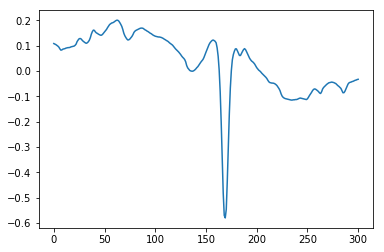

A00098
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


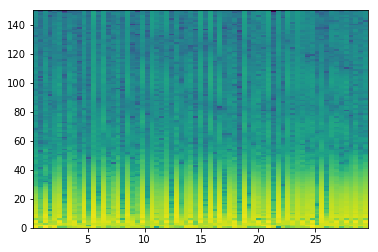

good List
[1, 3, 4, 6, 9, 11, 15, 18, 23, 28, 31, 33, 35, 37, 42, 44, 49, 51, 67]
[2, 1, 2, 3, 2, 4, 3, 5, 5, 3, 2, 2, 2, 5, 2, 5, 2, 16]
the temp 3
[[], [2], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[3, 4]
longest
[3, 4]
indexList
[3, 4]
theMin
300
theMax
600


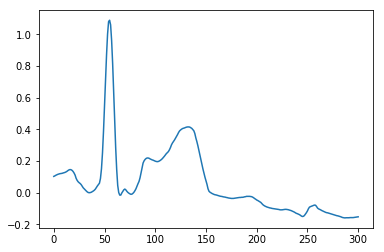

A00099
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


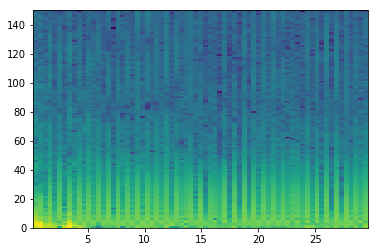

good List
[4, 14, 16, 20, 24, 33, 35, 38, 40, 42, 44, 46, 48, 55, 57, 59, 61, 63, 64, 65]
[10, 2, 4, 4, 9, 2, 3, 2, 2, 2, 2, 2, 7, 2, 2, 2, 2, 1, 1]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


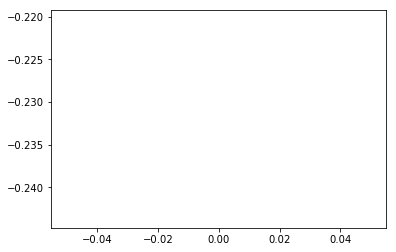

A00104
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


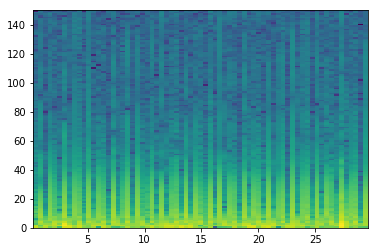

good List
[0, 2, 4, 5, 7, 10, 12, 15, 17, 18, 20, 22, 23, 25, 27, 28, 30, 32, 35, 37, 39, 40, 41, 42, 44, 47, 49, 52, 54, 55, 57, 59, 60, 61, 62, 64, 65, 67]
[2, 2, 1, 2, 3, 2, 3, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 3, 2, 2, 1, 1, 1, 2, 3, 2, 3, 2, 1, 2, 2, 1, 1, 1, 2, 1, 2]
the temp 3
[[], [], [3], [], [], [], [], [9], [], [12], [], [15], [], [], [], [], [21, 22, 23], [], [], [], [], [29], [], [32, 33, 34], [36]]
[39, 40, 41, 42]
longest
[39, 40, 41, 42]
indexList
[39, 40, 41, 42]
theMin
5100
theMax
5400


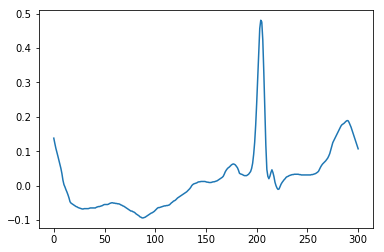

A00105
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

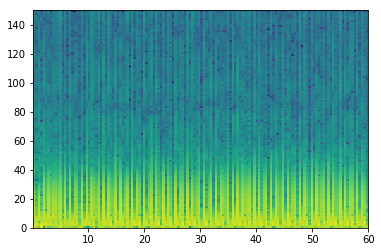

good List
[1, 10, 12, 14, 16, 19, 21, 23, 28, 30, 33, 38, 40, 43, 45, 47, 50, 53, 55, 58, 63, 70, 73, 75, 78, 79, 80, 82, 89, 91, 93, 96, 98, 110, 115, 117, 120, 122, 124, 127, 129, 134, 136, 139]
[9, 2, 2, 2, 3, 2, 2, 5, 2, 3, 5, 2, 3, 2, 2, 3, 3, 2, 3, 5, 7, 3, 2, 3, 1, 1, 2, 7, 2, 2, 3, 2, 12, 5, 2, 3, 2, 2, 3, 2, 5, 2, 3]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [25, 26], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[78, 79, 80]
longest
[78, 79, 80]
indexList
[78, 79, 80]
theMin
9900
theMax
10200


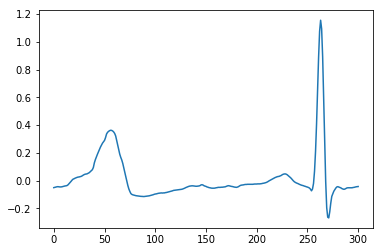

A00109
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


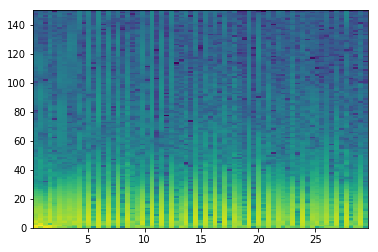

good List
[2, 4, 12, 14, 16, 21, 25, 27, 32, 40, 43, 45, 49, 50, 51, 61, 65, 66, 68]
[2, 8, 2, 2, 5, 4, 2, 5, 8, 3, 2, 4, 1, 1, 10, 4, 1, 2]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [13, 14], [], [17]]
[49, 50, 51]
longest
[49, 50, 51]
indexList
[49, 50, 51]
theMin
6300
theMax
6600


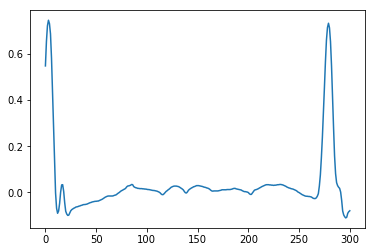

A00111
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


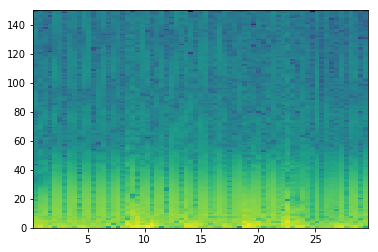

good List
[3, 15, 59, 64]
[12, 44, 5]
the temp 3
[[], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


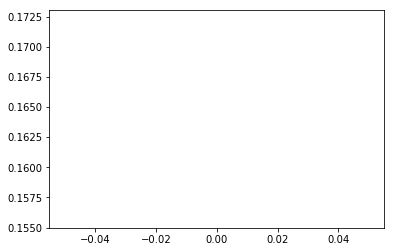

A00112
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


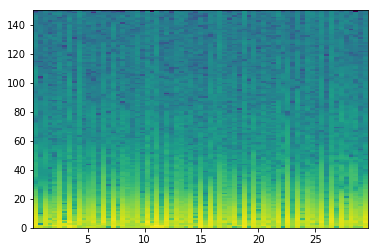

good List
[1, 4, 6, 8, 10, 13, 15, 17, 20, 22, 26, 28, 31, 33, 35, 39, 40, 42, 44, 46, 48, 49, 53, 55, 58, 60, 62, 65, 67]
[3, 2, 2, 2, 3, 2, 2, 3, 2, 4, 2, 3, 2, 2, 4, 1, 2, 2, 2, 2, 1, 4, 2, 3, 2, 2, 3, 2]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [16], [], [], [], [21], [], [], [], [], [], []]
[39, 40]
longest
[39, 40]
indexList
[39, 40]
theMin
5100
theMax
5400


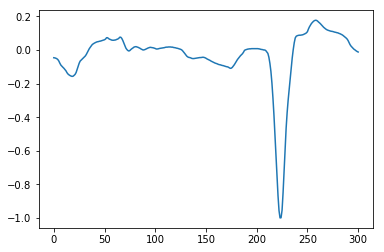

A00113
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


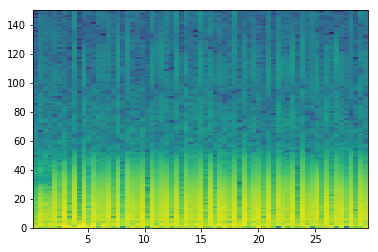

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


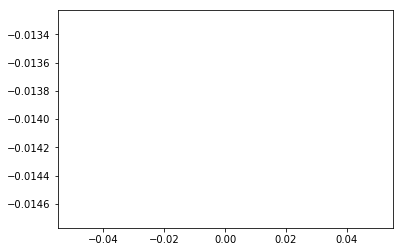

A00116
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


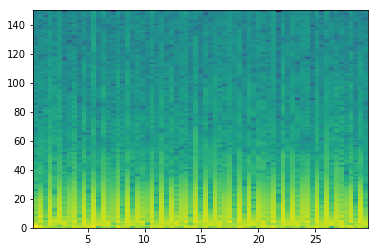

good List
[6, 9, 11, 13, 15, 18, 23, 25, 27, 29, 32, 34, 41, 43, 48, 50, 54, 55, 57, 59, 64, 66, 68]
[3, 2, 2, 2, 3, 5, 2, 2, 2, 3, 2, 7, 2, 5, 2, 4, 1, 2, 2, 5, 2, 2]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [17], [], [], [], []]
[54, 55]
longest
[54, 55]
indexList
[54, 55]
theMin
6900
theMax
7200


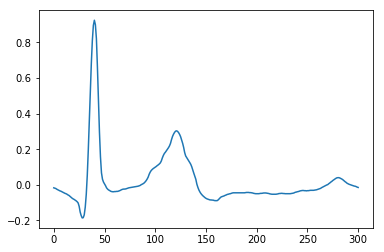

A00117
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


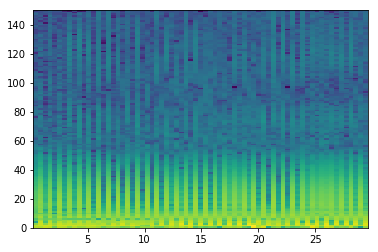

good List
[0, 2, 4, 6, 8, 10, 12, 14, 16, 17, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 42, 44, 46, 48, 50, 52, 54, 56, 58, 62, 64, 66, 68]
[2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 4, 2, 2, 2, 2, 2, 2, 2, 2, 4, 2, 2, 2]
the temp 3
[[], [], [], [], [], [], [], [], [9, 10], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[16, 17, 18]
longest
[16, 17, 18]
indexList
[16, 17, 18]
theMin
2100
theMax
2400


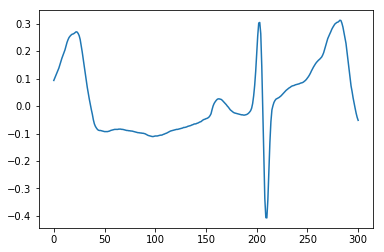

A00118
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


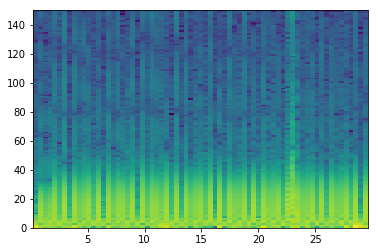

good List
[0, 2, 3, 5, 7, 12, 13, 14, 16, 21, 23, 28, 30, 32, 33, 37, 39, 41, 44, 45, 46, 51, 55, 58, 60, 62, 67]
[2, 1, 2, 2, 5, 1, 1, 2, 5, 2, 5, 2, 2, 1, 4, 2, 2, 3, 1, 1, 5, 4, 3, 2, 2, 5]
the temp 3
[[], [2], [], [], [6, 7], [], [], [], [], [], [14], [], [], [], [19, 20], [], [], [], [], []]
[12, 13, 14]
longest
[12, 13, 14]
indexList
[12, 13, 14]
theMin
1500
theMax
1800


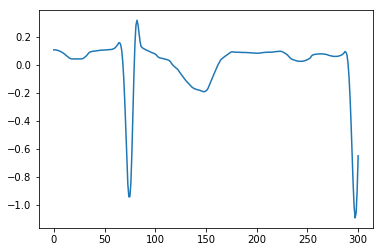

A00122
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


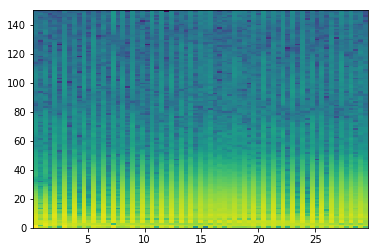

good List
[3, 5, 7, 9, 11, 13, 15, 17, 19, 23, 25, 27, 29, 31, 52, 54, 58, 60, 62, 64]
[2, 2, 2, 2, 2, 2, 2, 2, 4, 2, 2, 2, 2, 21, 2, 4, 2, 2, 2]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


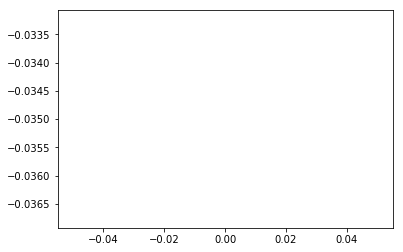

A00124
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


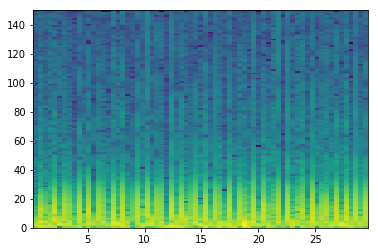

good List
[0, 2, 5, 7, 8, 10, 12, 13, 14, 15, 16, 17, 19, 20, 22, 24, 25, 26, 27, 29, 31, 32, 36, 39, 41, 44, 46, 48, 51, 53, 54, 56, 61, 63, 65, 67, 68]
[2, 3, 2, 1, 2, 2, 1, 1, 1, 1, 1, 2, 1, 2, 2, 1, 1, 1, 2, 2, 1, 4, 3, 2, 3, 2, 2, 3, 2, 1, 2, 5, 2, 2, 2, 1]
the temp 3
[[], [], [], [4], [], [7, 8, 9, 10, 11], [13], [], [16, 17, 18], [], [21], [], [], [], [], [], [], [], [30], [], [], [], []]
[12, 13, 14, 15, 16, 17]
longest
[12, 13, 14, 15, 16, 17]
indexList
[12, 13, 14, 15, 16, 17]
theMin
1500
theMax
2100


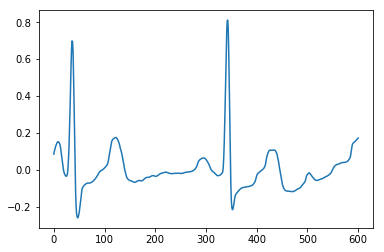

A00127
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


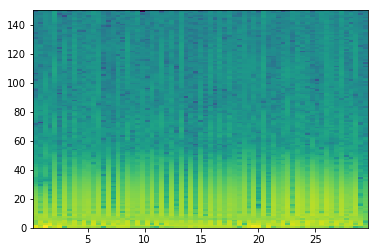

good List
[0, 1, 5, 7, 9, 12, 14, 16, 20, 25, 27, 29, 31, 32, 33, 35, 37, 39, 46, 48, 64, 67, 68]
[1, 4, 2, 2, 3, 2, 2, 4, 5, 2, 2, 2, 1, 1, 2, 2, 2, 7, 2, 16, 3, 1]
the temp 3
[[1], [], [], [], [], [], [], [], [], [], [], [13, 14], [], [], [], [], [], []]
[31, 32, 33]
longest
[31, 32, 33]
indexList
[31, 32, 33]
theMin
3900
theMax
4200


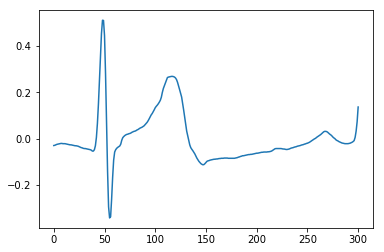

A00129
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


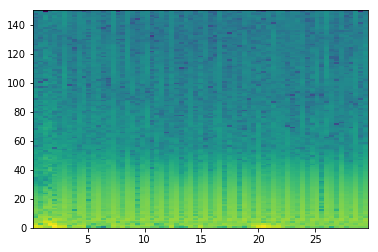

good List
[24, 26, 30, 33, 36, 62, 64]
[2, 4, 3, 3, 26, 2]
the temp 3
[[], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


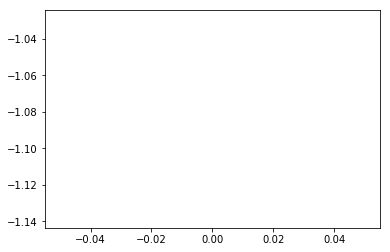

A00130
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


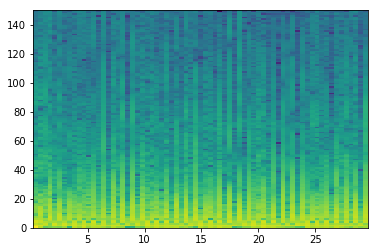

good List
[15, 19, 28, 50, 54, 61, 67]
[4, 9, 22, 4, 7, 6]
the temp 3
[[], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


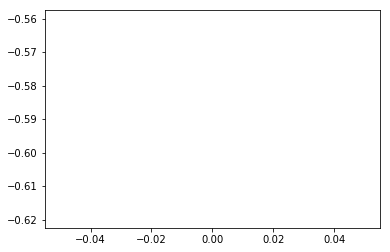

A00134
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


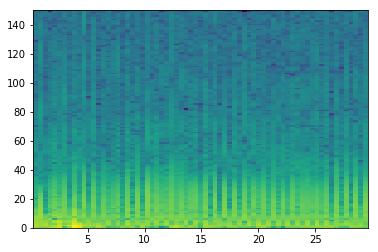

good List
[1, 2, 5, 7, 10, 11, 13, 14, 15, 16, 18, 20, 22, 24, 26, 27, 29, 32, 34, 36, 38, 40, 42, 43, 44, 46, 47, 48, 50, 53, 55, 57, 59, 60, 61, 63, 65, 66, 67, 68]
[1, 3, 2, 3, 1, 2, 1, 1, 1, 2, 2, 2, 2, 2, 1, 2, 3, 2, 2, 2, 2, 2, 1, 1, 2, 1, 1, 2, 3, 2, 2, 2, 1, 1, 2, 2, 1, 1, 1]
the temp 3
[[1], [], [], [5], [7, 8, 9], [], [], [], [], [15], [], [], [], [], [], [], [23, 24], [26, 27], [], [], [], [], [33, 34], []]
[13, 14, 15, 16]
longest
[13, 14, 15, 16]
indexList
[13, 14, 15, 16]
theMin
1500
theMax
2100


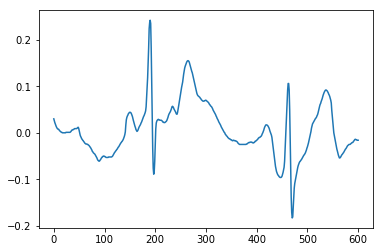

A00135
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

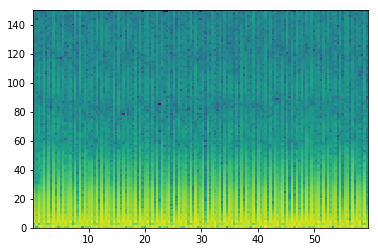

good List
[0, 3, 5, 7, 9, 11, 13, 14, 16, 18, 20, 23, 24, 25, 27, 29, 30, 32, 34, 36, 38, 41, 43, 45, 48, 50, 52, 54, 55, 57, 59, 61, 62, 64, 66, 68, 69, 71, 73, 76, 78, 80, 81, 83, 85, 87, 89, 90, 92, 94, 95, 97, 99, 102, 104, 106, 108, 110, 112, 114, 116, 117, 119, 121, 123, 124, 126, 128, 131, 133, 136, 138]
[3, 2, 2, 2, 2, 2, 1, 2, 2, 2, 3, 1, 1, 2, 2, 1, 2, 2, 2, 2, 3, 2, 2, 3, 2, 2, 2, 1, 2, 2, 2, 1, 2, 2, 2, 1, 2, 2, 3, 2, 2, 1, 2, 2, 2, 2, 1, 2, 2, 1, 2, 2, 3, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 1, 2, 2, 3, 2, 3, 2]
the temp 3
[[], [], [], [], [], [], [7], [], [], [], [12, 13], [], [16], [], [], [], [], [], [], [], [], [], [], [28], [], [], [32], [], [], [36], [], [], [], [], [42], [], [], [], [47], [], [50], [], [], [], [], [], [], [], [], [], [61], [], [], [65], [], [], [], [], []]
[23, 24, 25]
longest
[23, 24, 25]
indexList
[23, 24, 25]
theMin
3000
theMax
3300


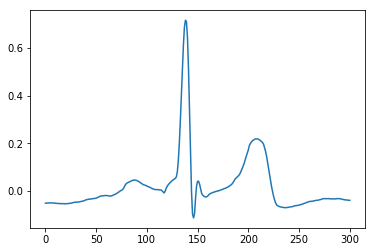

A00140
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


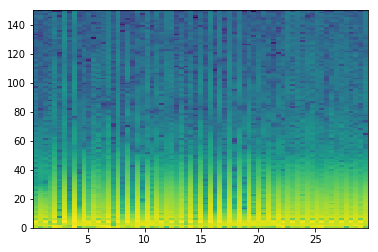

good List
[5, 7, 9, 11, 16, 18, 20, 29, 31, 33, 35, 37, 39, 41, 52, 53, 58, 62]
[2, 2, 2, 5, 2, 2, 9, 2, 2, 2, 2, 2, 2, 11, 1, 5, 4]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], [], [15], []]
[52, 53]
longest
[52, 53]
indexList
[52, 53]
theMin
6600
theMax
6900


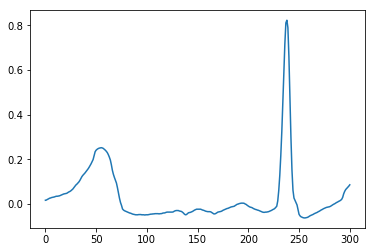

A00142
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


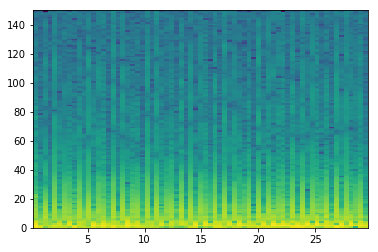

good List
[1, 3, 8, 10, 12, 15, 17, 20, 21, 22, 24, 26, 27, 29, 31, 33, 34, 36, 38, 43, 45, 47, 49, 52, 54, 59, 61, 63, 65, 66, 68]
[2, 5, 2, 2, 3, 2, 3, 1, 1, 2, 2, 1, 2, 2, 2, 1, 2, 2, 5, 2, 2, 2, 3, 2, 5, 2, 2, 2, 1, 2]
the temp 3
[[], [], [], [], [], [], [], [8, 9], [], [12], [], [], [16], [], [], [], [], [], [], [], [], [], [], [], [29]]
[20, 21, 22]
longest
[20, 21, 22]
indexList
[20, 21, 22]
theMin
2400
theMax
2700


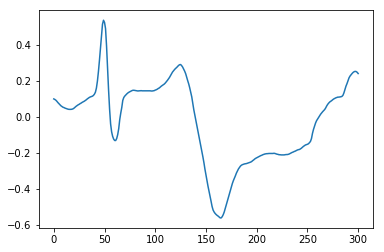

A00143
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

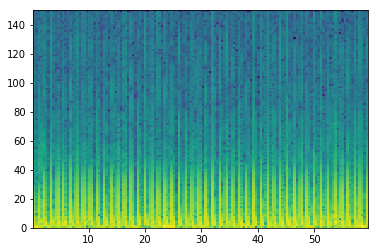

good List
[1, 6, 11, 13, 14, 16, 17, 19, 22, 23, 24, 25, 28, 30, 31, 32, 36, 39, 42, 45, 47, 50, 53, 56, 58, 59, 61, 62, 64, 67, 70, 72, 73, 75, 76, 78, 79, 81, 84, 87, 88, 90, 93, 95, 96, 98, 101, 103, 106, 107, 109, 112, 115, 117, 118, 120, 121, 123, 124, 126, 129, 131, 132, 134, 137]
[5, 5, 2, 1, 2, 1, 2, 3, 1, 1, 1, 3, 2, 1, 1, 4, 3, 3, 3, 2, 3, 3, 3, 2, 1, 2, 1, 2, 3, 3, 2, 1, 2, 1, 2, 1, 2, 3, 3, 1, 2, 3, 2, 1, 2, 3, 2, 3, 1, 2, 3, 3, 2, 1, 2, 1, 2, 1, 2, 3, 2, 1, 2, 3]
the temp 3
[[], [], [], [4], [6], [], [9, 10, 11], [], [14, 15], [], [], [], [], [], [], [], [], [25], [27], [], [], [], [32], [34], [36], [], [], [40], [], [], [44], [], [], [], [49], [], [], [], [54], [56], [58], [], [], [62], []]
[22, 23, 24, 25]
longest
[22, 23, 24, 25]
indexList
[22, 23, 24, 25]
theMin
2700
theMax
3300


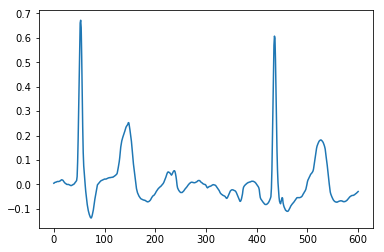

A00144
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


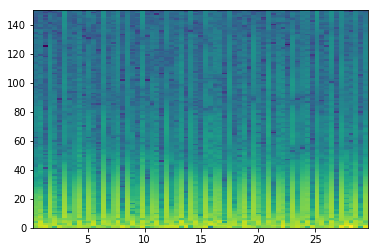

good List
[0, 2, 4, 5, 7, 10, 13, 15, 16, 18, 20, 21, 23, 26, 28, 29, 31, 33, 34, 39, 41, 42, 44, 47, 49, 52, 54, 55, 57, 59, 60, 62, 65, 67]
[2, 2, 1, 2, 3, 3, 2, 1, 2, 2, 1, 2, 3, 2, 1, 2, 2, 1, 5, 2, 1, 2, 3, 2, 3, 2, 1, 2, 2, 1, 2, 3, 2]
the temp 3
[[], [], [3], [], [], [], [8], [], [11], [], [], [15], [], [18], [], [21], [], [], [], [], [27], [], [30], [], []]
[4, 5]
longest
[4, 5]
indexList
[4, 5]
theMin
600
theMax
900


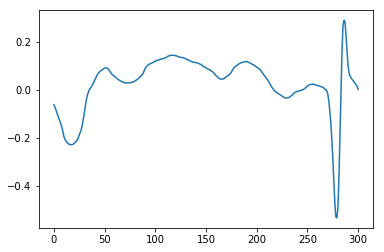

A00146
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


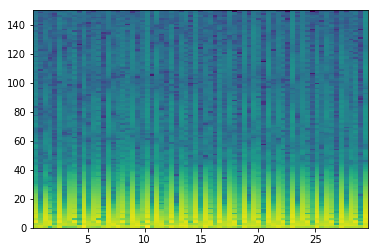

good List
[1, 4, 6, 7, 9, 11, 12, 14, 16, 21, 22, 24, 26, 27, 29, 31, 32, 34, 35, 36, 37, 39, 41, 42, 44, 47, 49, 52, 54, 56, 57, 59, 62, 64, 67]
[3, 2, 1, 2, 2, 1, 2, 2, 5, 1, 2, 2, 1, 2, 2, 1, 2, 1, 1, 1, 2, 2, 1, 2, 3, 2, 3, 2, 2, 1, 2, 3, 2, 3]
the temp 3
[[], [], [3], [], [6], [], [], [10], [], [13], [], [16], [18, 19, 20], [], [23], [], [], [], [], [], [30], [], [], []]
[34, 35, 36, 37]
longest
[34, 35, 36, 37]
indexList
[34, 35, 36, 37]
theMin
4200
theMax
4800


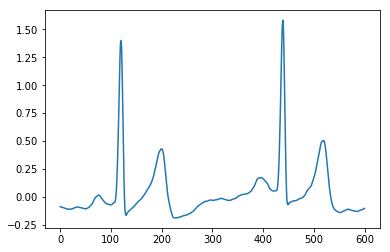

A00147
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

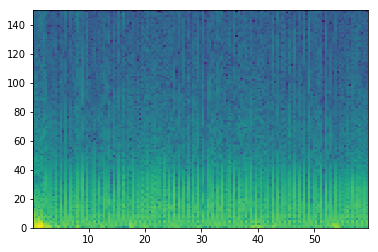

good List
[10, 12, 14, 16, 63, 65, 69, 71, 105, 107, 109, 113, 120, 124, 126]
[2, 2, 2, 47, 2, 4, 2, 34, 2, 2, 4, 7, 4, 2]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


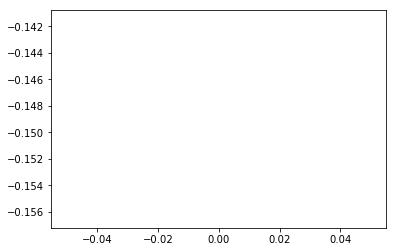

A00148
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


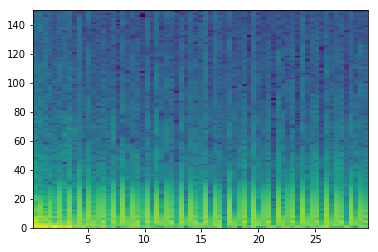

good List
[10, 12, 13, 15, 17, 22, 24, 28, 29, 31, 36, 39, 41, 44, 46, 47, 49, 52, 54, 56, 59, 61, 64]
[2, 1, 2, 2, 5, 2, 4, 1, 2, 5, 3, 2, 3, 2, 1, 2, 3, 2, 2, 3, 2, 3]
the temp 3
[[], [2], [], [], [], [], [8], [], [], [], [], [], [15], [], [], [], [], [], []]
[12, 13]
longest
[12, 13]
indexList
[12, 13]
theMin
1500
theMax
1800


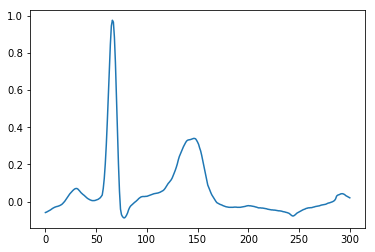

A00149
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


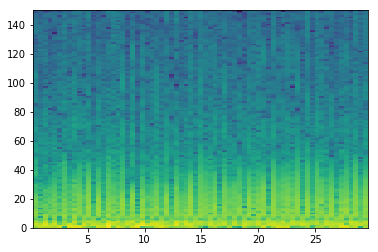

good List
[21]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


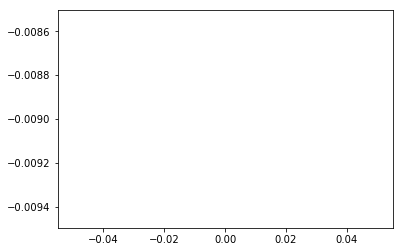

A00150
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


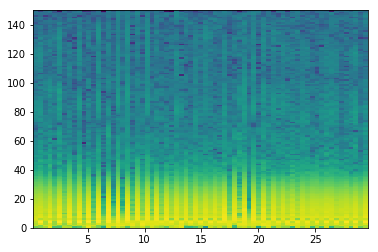

good List
[0, 2, 4, 6, 7, 8, 10, 11, 12, 14, 16, 18, 20, 21, 22, 24, 25, 26, 27, 28, 30, 32, 33, 34, 35, 36, 37, 38, 40, 44, 46, 48, 49, 50, 54, 56, 57, 58, 59, 63, 65, 67, 68]
[2, 2, 2, 1, 1, 2, 1, 1, 2, 2, 2, 2, 1, 1, 2, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 2, 4, 2, 2, 1, 1, 4, 2, 1, 1, 1, 4, 2, 2, 1]
the temp 3
[[], [], [], [4, 5], [7, 8], [], [], [], [13, 14], [16, 17, 18, 19], [], [22, 23, 24, 25, 26, 27], [], [], [], [32, 33], [], [36, 37, 38], [], []]
[32, 33, 34, 35, 36, 37, 38]
longest
[32, 33, 34, 35, 36, 37, 38]
indexList
[32, 33, 34, 35, 36, 37, 38]
theMin
4200
theMax
4800


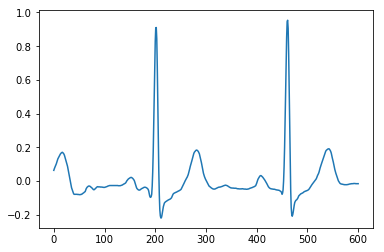

A00151
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


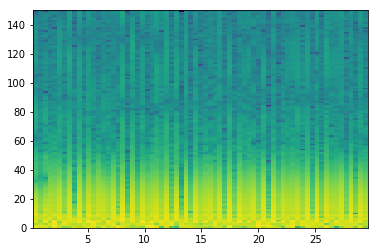

good List
[8, 10, 19, 21, 30, 32, 39, 48, 64, 66]
[2, 9, 2, 9, 2, 7, 9, 16, 2]
the temp 3
[[], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


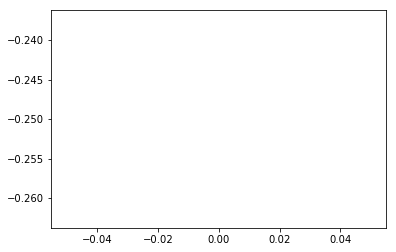

A00152
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


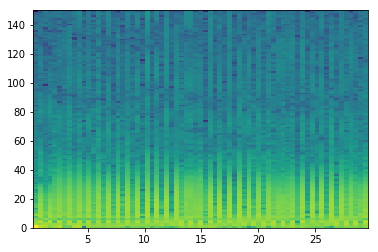

good List
[0, 2, 3, 6, 8, 10, 14, 16, 18, 20, 22, 24, 26, 28, 29, 30, 31, 33, 35, 37, 39, 41, 43, 45, 47, 50, 52, 54, 56, 58, 60, 62, 64]
[2, 1, 3, 2, 2, 4, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 3, 2, 2, 2, 2, 2, 2, 2]
the temp 3
[[], [2], [], [], [], [], [], [], [], [], [], [], [14, 15, 16], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[28, 29, 30, 31]
longest
[28, 29, 30, 31]
indexList
[28, 29, 30, 31]
theMin
3600
theMax
3900


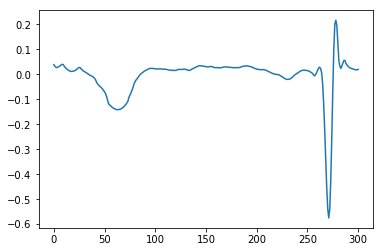

A00153
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


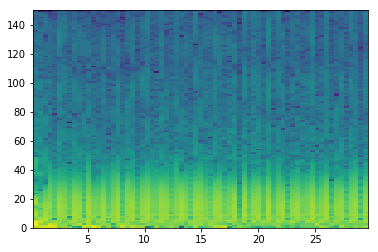

good List
[21, 52]
[31]
the temp 3
[[]]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


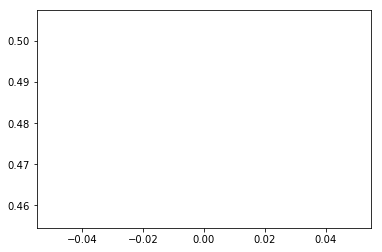

A00154
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


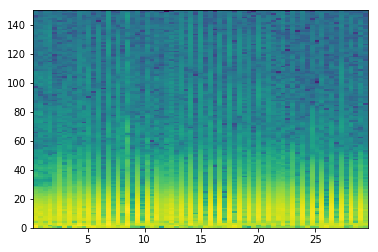

good List
[12, 14, 16, 20, 22, 29, 33, 37, 39, 41, 54, 56, 60, 62, 64, 66]
[2, 2, 4, 2, 7, 4, 4, 2, 2, 13, 2, 4, 2, 2, 2]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


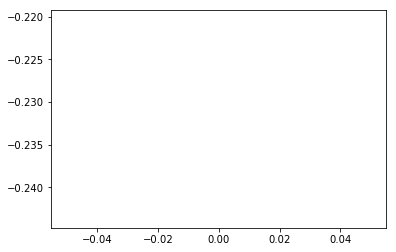

A00157
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

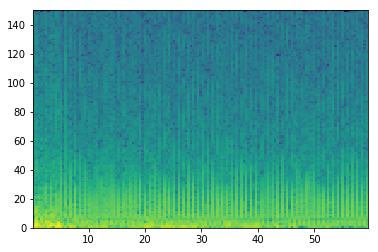

good List
[12, 16, 18, 20, 21, 22, 25, 27, 28, 33, 34, 36, 40, 42, 43, 45, 50, 51, 53, 57, 59, 61, 65, 67, 69, 71, 73, 75, 83, 85, 87, 89, 91, 93, 96, 98, 100, 102, 104, 106, 113, 114, 117, 119, 121, 125, 127, 129, 131, 133, 135, 137]
[4, 2, 2, 1, 1, 3, 2, 1, 5, 1, 2, 4, 2, 1, 2, 5, 1, 2, 4, 2, 2, 4, 2, 2, 2, 2, 2, 8, 2, 2, 2, 2, 2, 3, 2, 2, 2, 2, 2, 7, 1, 3, 2, 2, 4, 2, 2, 2, 2, 2, 2]
the temp 3
[[], [], [], [4, 5], [], [8], [10], [], [], [14], [], [17], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [41], [], [], [], [], [], [], [], [], []]
[20, 21, 22]
longest
[20, 21, 22]
indexList
[20, 21, 22]
theMin
2400
theMax
2700


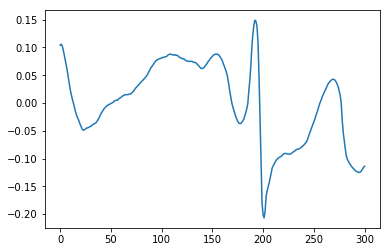

A00160
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


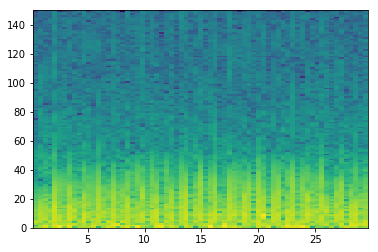

good List
[12, 20, 26, 35, 48, 61]
[8, 6, 9, 13, 13]
the temp 3
[[], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


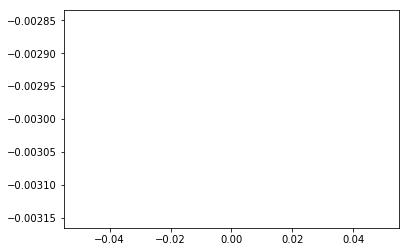

A00163
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


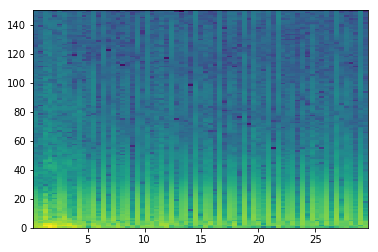

good List
[11, 13, 20, 22, 24, 27, 32, 34, 37, 39, 40, 42, 44, 46, 47, 49, 51, 54, 56, 59, 61, 66, 68]
[2, 7, 2, 2, 3, 5, 2, 3, 2, 1, 2, 2, 2, 1, 2, 2, 3, 2, 3, 2, 5, 2]
the temp 3
[[], [], [], [], [], [], [], [], [], [10], [], [], [14], [], [], [], [], [], [], []]
[39, 40]
longest
[39, 40]
indexList
[39, 40]
theMin
5100
theMax
5400


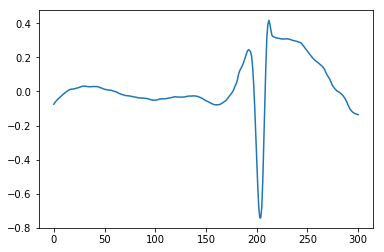

A00165
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


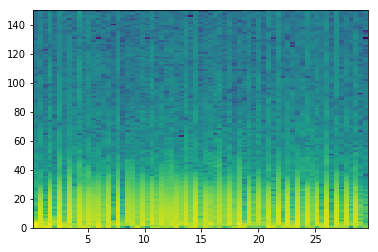

good List
[0, 2, 4, 6, 10, 12, 14, 16, 18, 19, 20, 21, 23, 25, 26, 29, 30, 32, 34, 39, 41, 43, 45, 47, 49, 51, 52, 53, 58, 59, 61, 63, 64, 67, 68]
[2, 2, 2, 4, 2, 2, 2, 2, 1, 1, 1, 2, 2, 1, 3, 1, 2, 2, 5, 2, 2, 2, 2, 2, 2, 1, 1, 5, 1, 2, 2, 1, 3, 1]
the temp 3
[[], [], [], [], [], [], [], [], [9, 10, 11], [], [14], [16], [], [], [], [], [], [], [], [], [26, 27], [29], [], [32]]
[18, 19, 20, 21]
longest
[18, 19, 20, 21]
indexList
[18, 19, 20, 21]
theMin
2400
theMax
2700


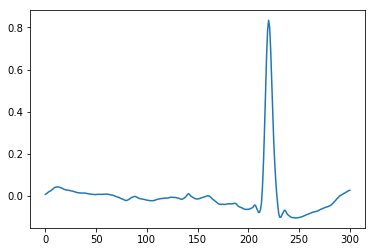

A00166
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


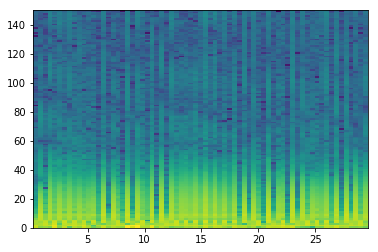

good List
[0, 2, 4, 5, 6, 7, 9, 10, 11, 12, 13, 15, 16, 17, 18, 20, 22, 23, 25, 27, 28, 29, 32, 34, 36, 37, 38, 39, 40, 42, 44, 46, 47, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 61, 63, 65, 67, 68]
[2, 2, 1, 1, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, 2, 2, 1, 2, 2, 1, 1, 3, 2, 2, 1, 1, 1, 1, 2, 2, 2, 1, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1]
the temp 3
[[], [], [3, 4, 5], [7, 8, 9, 10], [12, 13, 14], [], [17], [], [20, 21], [], [], [25, 26, 27, 28], [], [], [32], [34, 35, 36], [38, 39, 40, 41, 42], [], [], []]
[54, 55, 56, 57, 58, 59]
longest
[54, 55, 56, 57, 58, 59]
indexList
[54, 55, 56, 57, 58, 59]
theMin
6900
theMax
7500


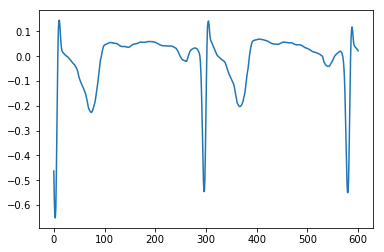

A00167
[ 0.42666667  0.85333333  1.28        1.70666667  2.13333333
  2.56        2.98666667  3.41333333  3.84        4.26666667
  4.69333333  5.12        5.54666667  5.97333333  6.4         6.82666667
  7.25333333  7.68        8.10666667  8.53333333  8.96
  9.38666667]


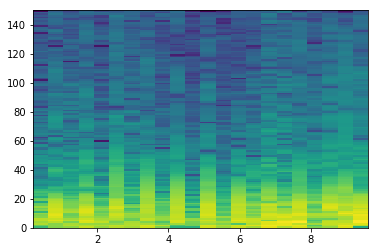

good List
[12]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


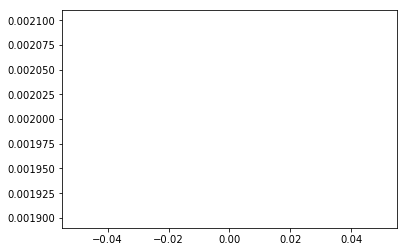

A00168
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


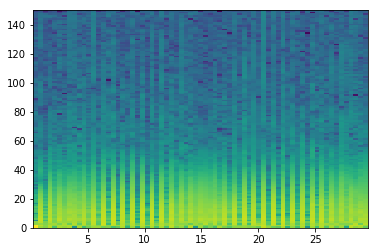

good List
[0, 1, 2, 11, 13, 17, 19, 21, 23, 25, 29, 33, 40, 46, 50, 52, 54, 56]
[1, 1, 9, 2, 4, 2, 2, 2, 2, 4, 4, 7, 6, 4, 2, 2, 2]
the temp 3
[[1, 2], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[0, 1, 2]
longest
[0, 1, 2]
indexList
[0, 1, 2]
theMin
0
theMax
300


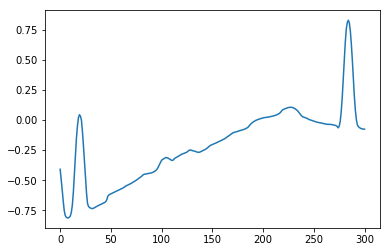

A00169
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


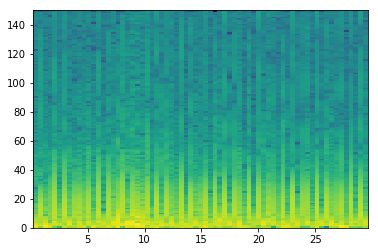

good List
[5, 8, 14, 24, 29, 31, 34, 36, 43, 45, 50, 52, 54, 57, 59, 64, 66, 68]
[3, 6, 10, 5, 2, 3, 2, 7, 2, 5, 2, 2, 3, 2, 5, 2, 2]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


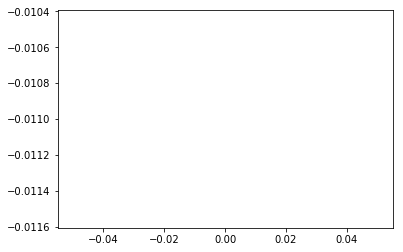

A00171
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


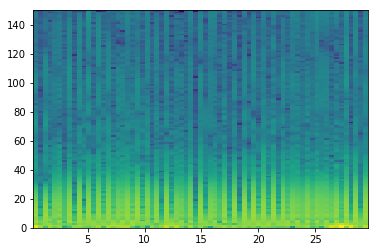

good List
[1, 3, 6, 12, 24, 26, 31, 33, 35, 36, 38, 40, 42, 44, 46, 48, 50, 55, 59, 61, 65, 67]
[2, 3, 6, 12, 2, 5, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 5, 4, 2, 4, 2]
the temp 3
[[], [], [], [], [], [], [], [], [9], [], [], [], [], [], [], [], [], [], [], []]
[35, 36]
longest
[35, 36]
indexList
[35, 36]
theMin
4500
theMax
4800


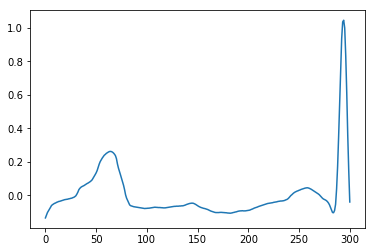

A00172
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


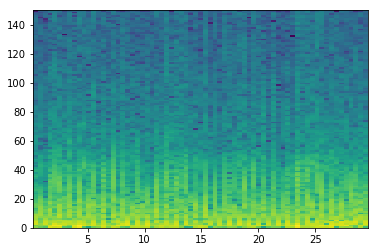

good List
[15, 22, 38, 48, 50]
[7, 16, 10, 2]
the temp 3
[[], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


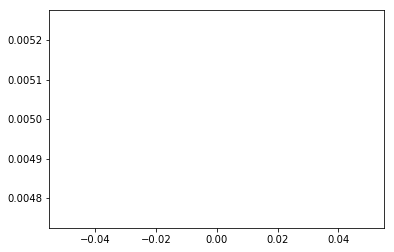

A00173
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333]


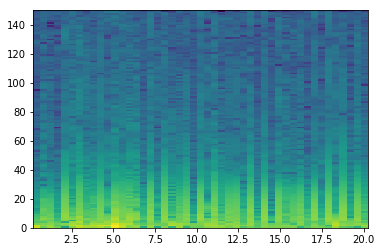

good List
[0, 1, 2, 3, 7, 8, 12, 15, 17, 20, 22, 27, 28, 29, 31, 33, 35, 36, 37, 38, 39, 40, 44, 45, 46]
[1, 1, 1, 4, 1, 4, 3, 2, 3, 2, 5, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 4, 1, 1]
the temp 3
[[1, 2, 3], [5], [], [], [], [], [], [12, 13], [], [], [17, 18, 19, 20, 21]]
[35, 36, 37, 38, 39, 40]
longest
[35, 36, 37, 38, 39, 40]
indexList
[35, 36, 37, 38, 39, 40]
theMin
4500
theMax
5100


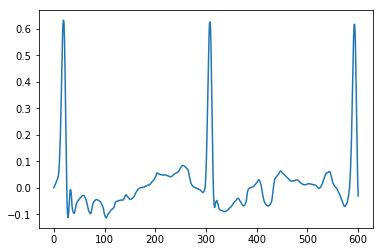

A00174
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


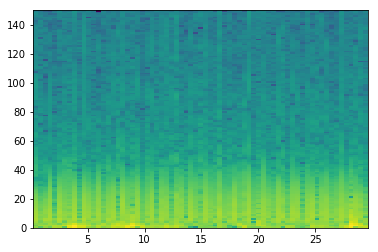

good List
[2, 4, 16, 22, 64]
[2, 12, 6, 42]
the temp 3
[[], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


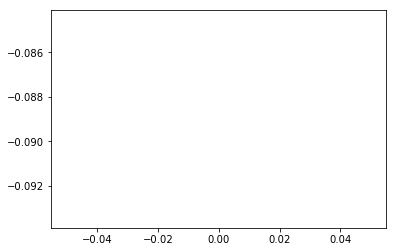

A00175
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


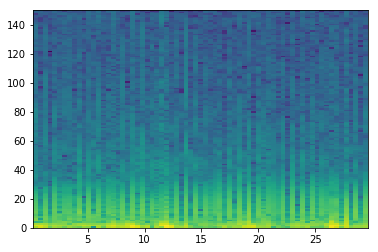

good List
[1, 3, 5, 6, 7, 8, 10, 14, 17, 19, 24, 28, 29, 33, 34, 35, 36, 37, 39, 41, 43, 45, 49, 50, 52, 54, 56, 58, 59, 60, 61, 62, 63, 65, 66, 67, 68]
[2, 2, 1, 1, 1, 2, 4, 3, 2, 5, 4, 1, 4, 1, 1, 1, 1, 2, 2, 2, 2, 4, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 2, 1, 1, 1]
the temp 3
[[], [], [3, 4, 5], [], [], [], [], [], [12], [14, 15, 16, 17], [], [], [], [], [23], [], [], [], [28, 29, 30, 31, 32]]
[58, 59, 60, 61, 62, 63]
longest
[58, 59, 60, 61, 62, 63]
indexList
[58, 59, 60, 61, 62, 63]
theMin
7500
theMax
8100


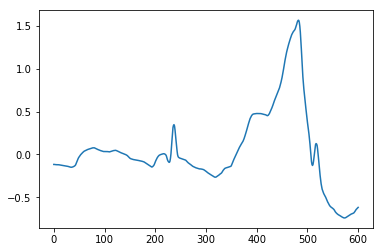

A00177
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


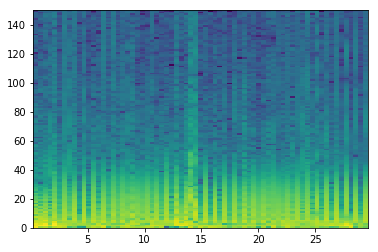

good List
[5, 11, 15, 17, 36, 38, 40, 46, 50, 54, 61, 65, 67]
[6, 4, 2, 19, 2, 2, 6, 4, 4, 7, 4, 2]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


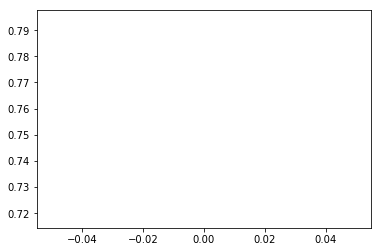

A00178
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24      ]


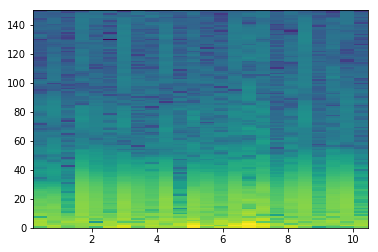

good List
[0, 7, 8, 17, 20]
[7, 1, 9, 3]
the temp 3
[[], [2], []]
[7, 8]
longest
[7, 8]
indexList
[7, 8]
theMin
900
theMax
1200


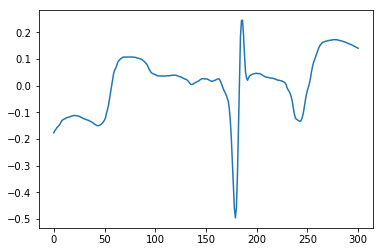

A00179
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


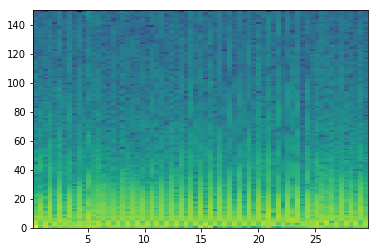

good List
[17, 20, 37, 41, 51, 55]
[3, 17, 4, 10, 4]
the temp 3
[[], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


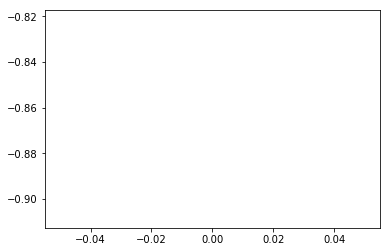

A00180
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


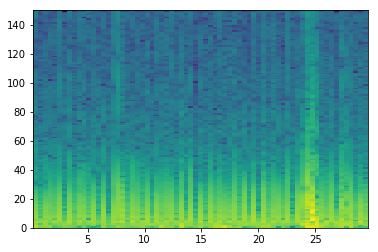

good List
[6, 8, 15, 28, 33, 46, 51, 53]
[2, 7, 13, 5, 13, 5, 2]
the temp 3
[[], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


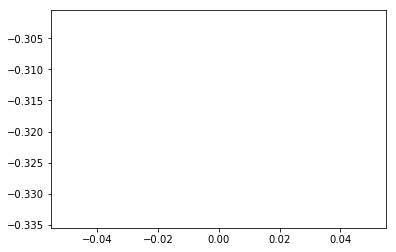

A00182
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

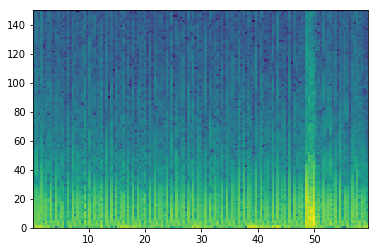

good List
[29, 31, 33, 38, 42, 47, 56, 58, 63, 67, 72, 79, 82, 84, 91, 98, 105, 107, 126, 131, 138]
[2, 2, 5, 4, 5, 9, 2, 5, 4, 5, 7, 3, 2, 7, 7, 7, 2, 19, 5, 7]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


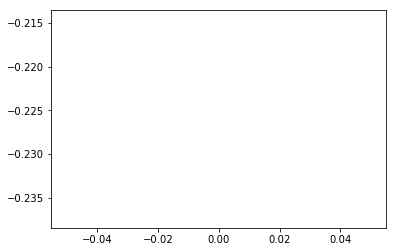

A00183
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


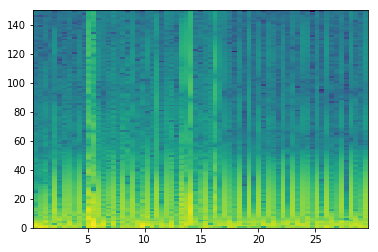

good List
[0, 1, 3, 8, 10, 41, 43, 45, 47, 49, 50, 52, 54, 57, 59, 61, 62, 64, 67]
[1, 2, 5, 2, 31, 2, 2, 2, 2, 1, 2, 2, 3, 2, 2, 1, 2, 3]
the temp 3
[[1], [], [], [], [], [], [], [], [10], [], [], [], [], [16], []]
[0, 1]
longest
[0, 1]
indexList
[0, 1]
theMin
0
theMax
300


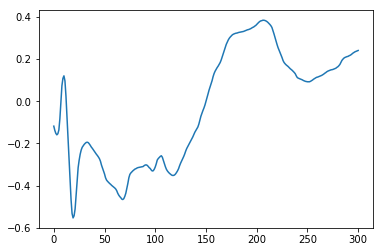

A00184
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


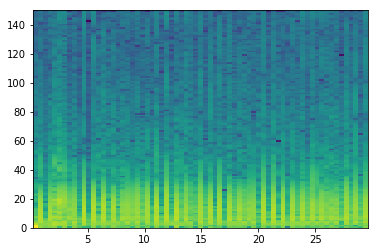

good List
[2, 9, 11, 24, 26, 35, 37, 39, 41, 48, 52, 54, 56, 63, 67]
[7, 2, 13, 2, 9, 2, 2, 2, 7, 4, 2, 2, 7, 4]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


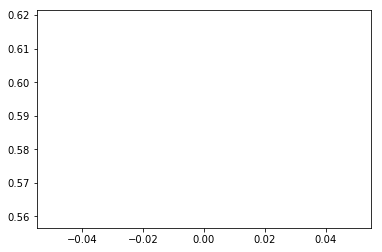

A00185
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


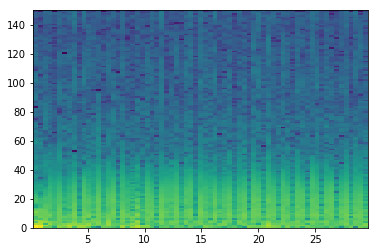

good List
[4, 9, 10, 14, 17, 19, 20, 21, 23, 24, 25, 27, 28, 30, 33, 36, 38, 39, 41, 44, 46, 47, 50, 53, 55, 56, 57, 59, 62, 63]
[5, 1, 4, 3, 2, 1, 1, 2, 1, 1, 2, 1, 2, 3, 3, 2, 1, 2, 3, 2, 1, 3, 3, 2, 1, 1, 2, 3, 1]
the temp 3
[[], [2], [], [], [6, 7], [9, 10], [12], [], [], [], [17], [], [], [21], [], [], [25, 26], []]
[19, 20, 21]
longest
[19, 20, 21]
indexList
[19, 20, 21]
theMin
2400
theMax
2700


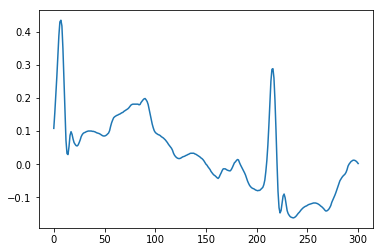

A00188
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


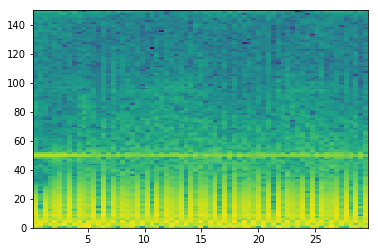

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


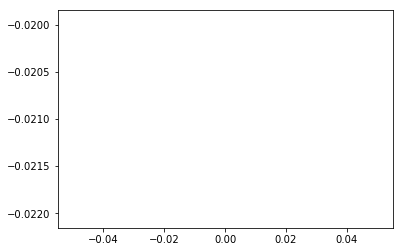

A00190
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


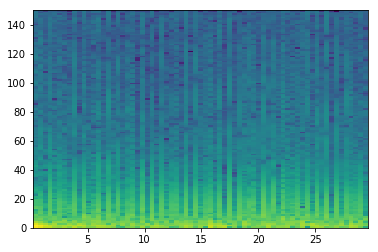

good List
[7, 9, 14, 21, 23, 25, 30, 32, 34, 39, 41, 46, 57, 61, 63, 68]
[2, 5, 7, 2, 2, 5, 2, 2, 5, 2, 5, 11, 4, 2, 5]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


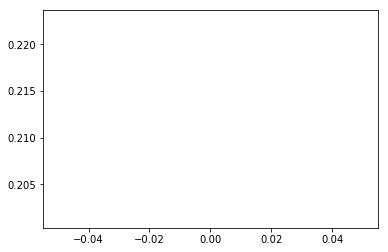

A00191
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


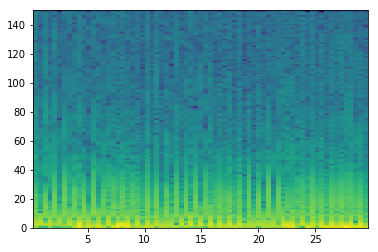

good List
[5, 7, 11, 20, 21, 22, 24, 26, 28, 30, 34, 35, 37, 39, 41, 43, 45, 47, 54, 58, 60, 64, 68]
[2, 4, 9, 1, 1, 2, 2, 2, 2, 4, 1, 2, 2, 2, 2, 2, 2, 7, 4, 2, 4, 4]
the temp 3
[[], [], [], [4, 5], [], [], [], [], [11], [], [], [], [], [], [], [], [], [], []]
[20, 21, 22]
longest
[20, 21, 22]
indexList
[20, 21, 22]
theMin
2400
theMax
2700


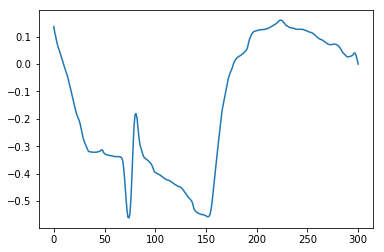

A00192
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


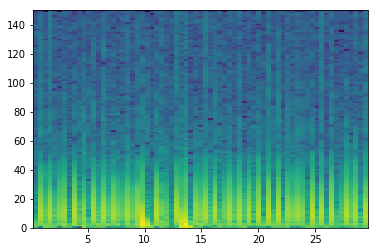

good List
[0, 2, 3, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14, 15, 17, 18, 20, 21, 23, 24, 25, 27, 28, 29, 32, 33, 34, 35, 36, 37, 38, 39, 41, 42, 43, 44, 45, 47, 49, 51, 52, 53, 54, 55, 56, 58, 60, 62, 63, 65, 67]
[2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 1, 2, 1, 2, 1, 1, 2, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 2, 2, 2, 1, 2, 2]
the temp 3
[[], [2, 3, 4, 5, 6, 7, 8], [10, 11, 12, 13], [15], [17], [19, 20], [22, 23], [25, 26, 27, 28, 29, 30, 31], [33, 34, 35, 36], [], [], [40, 41, 42, 43, 44], [], [], [48], []]
[2, 3, 4, 5, 6, 7, 8, 9]
longest
[2, 3, 4, 5, 6, 7, 8, 9]
indexList
[2, 3, 4, 5, 6, 7, 8, 9]
theMin
300
theMax
1200


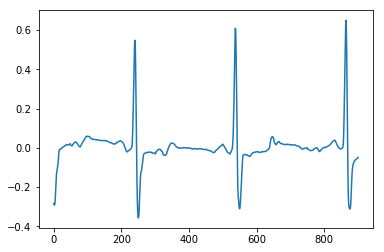

A00193
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


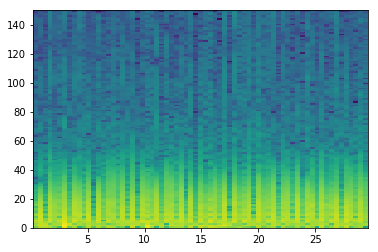

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


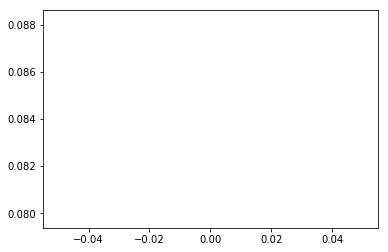

A00194
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


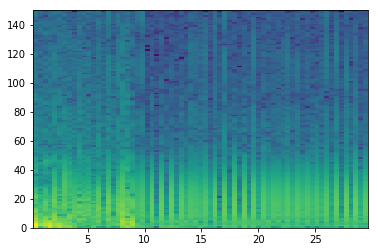

good List
[21, 23, 25, 27, 29, 31, 36, 38, 44, 46, 49, 50, 53, 55, 61, 63, 65, 67]
[2, 2, 2, 2, 2, 5, 2, 6, 2, 3, 1, 3, 2, 6, 2, 2, 2]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [11], [], [], [], [], []]
[49, 50]
longest
[49, 50]
indexList
[49, 50]
theMin
6300
theMax
6600


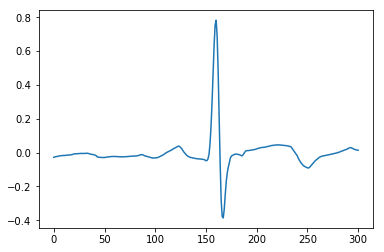

A00197
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


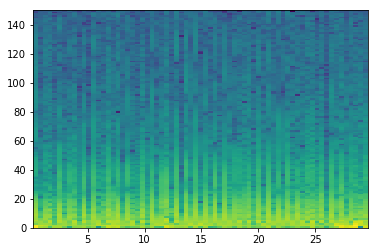

good List
[1, 4, 9, 11, 16, 18, 20, 30, 32, 38, 47, 60]
[3, 5, 2, 5, 2, 2, 10, 2, 6, 9, 13]
the temp 3
[[], [], [], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


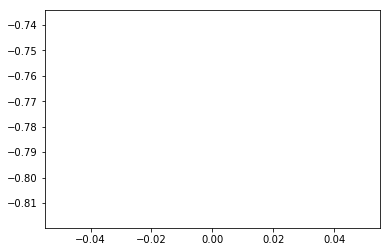

A00199
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


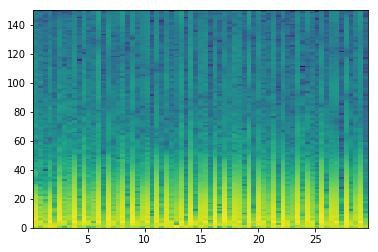

good List
[14, 24, 31, 36, 45, 48, 50, 53, 63, 65, 68]
[10, 7, 5, 9, 3, 2, 3, 10, 2, 3]
the temp 3
[[], [], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


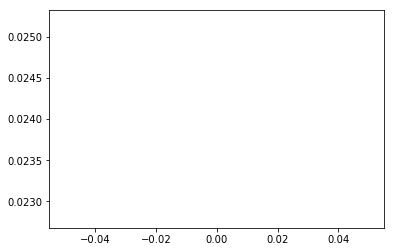

A00200
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


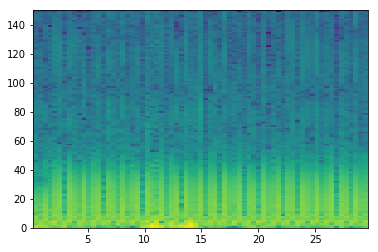

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


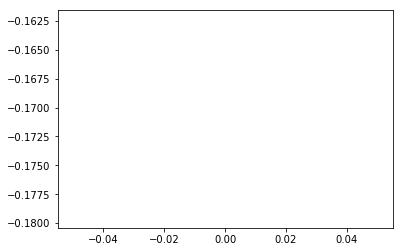

A00202
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

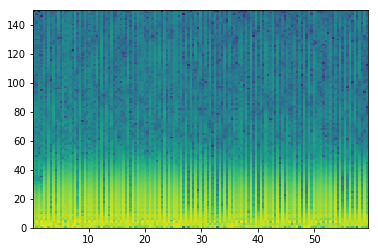

good List
[1, 2, 3, 5, 7, 9, 11, 16, 18, 20, 22, 27, 29, 31, 33, 38, 40, 42, 44, 46, 47, 51, 53, 55, 57, 60, 62, 64, 66, 68, 70, 72, 74, 76, 78, 80, 81, 82, 84, 85, 87, 89, 91, 93, 95, 98, 100, 102, 104, 107, 109, 111, 113, 115, 120, 122, 124, 126, 128, 130, 132, 134, 136]
[1, 1, 2, 2, 2, 2, 5, 2, 2, 2, 5, 2, 2, 2, 5, 2, 2, 2, 2, 1, 4, 2, 2, 2, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 1, 2, 2, 2, 2, 2, 3, 2, 2, 2, 3, 2, 2, 2, 2, 5, 2, 2, 2, 2, 2, 2, 2, 2]
the temp 3
[[1, 2], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [20], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [36, 37], [39], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[1, 2, 3]
longest
[1, 2, 3]
indexList
[1, 2, 3]
theMin
0
theMax
300


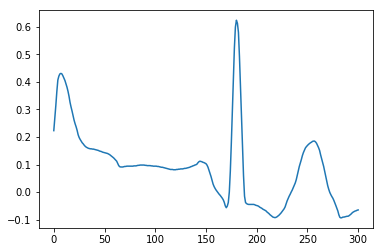

A00206
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


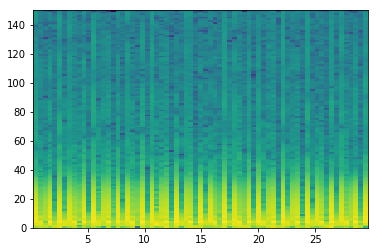

good List
[0, 1, 2, 4, 6, 8, 9, 11, 13, 14, 16, 18, 19, 20, 21, 23, 24, 25, 26, 28, 30, 31, 33, 34, 35, 36, 37, 38, 40, 41, 43, 45, 47, 48, 49, 50, 52, 53, 54, 55, 57, 58, 60, 61, 62, 64, 65, 66, 67, 68]
[1, 1, 2, 2, 2, 1, 2, 2, 1, 2, 2, 1, 1, 1, 2, 1, 1, 1, 2, 2, 1, 2, 1, 1, 1, 1, 1, 2, 1, 2, 2, 2, 1, 1, 1, 2, 1, 1, 1, 2, 1, 2, 1, 1, 2, 1, 1, 1, 1]
the temp 3
[[1, 2], [], [], [6], [], [9], [], [12, 13, 14], [16, 17, 18], [], [21], [23, 24, 25, 26, 27], [29], [], [], [33, 34, 35], [37, 38, 39], [41], [43, 44]]
[33, 34, 35, 36, 37, 38]
longest
[33, 34, 35, 36, 37, 38]
indexList
[33, 34, 35, 36, 37, 38]
theMin
4200
theMax
4800


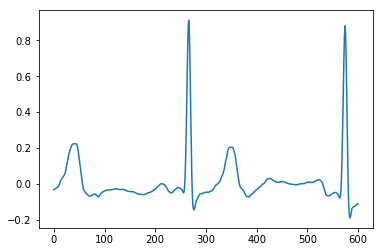

A00207
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


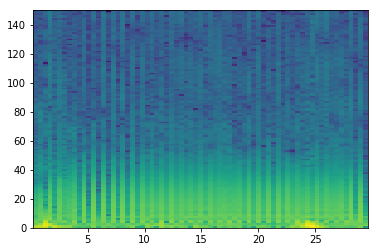

good List
[9, 11, 13, 15, 17, 19, 21, 23, 29, 31, 33, 35, 41, 42, 43, 45, 47, 49, 51, 53, 55, 59, 64, 66, 68]
[2, 2, 2, 2, 2, 2, 2, 6, 2, 2, 2, 6, 1, 1, 2, 2, 2, 2, 2, 2, 4, 5, 2, 2]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [13, 14], [], [], [], [], [], [], [], [], []]
[41, 42, 43]
longest
[41, 42, 43]
indexList
[41, 42, 43]
theMin
5100
theMax
5400


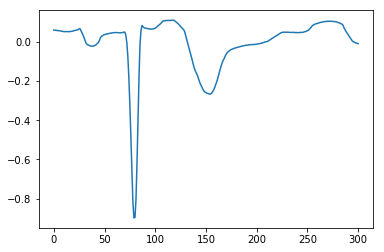

A00210
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


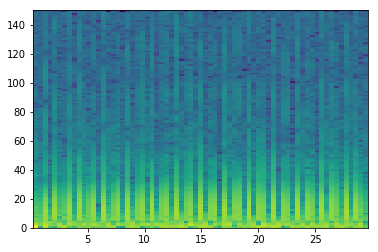

good List
[0, 1, 3, 5, 6, 8, 10, 11, 13, 15, 16, 17, 18, 20, 21, 23, 24, 25, 26, 28, 29, 30, 31, 33, 35, 36, 37, 38, 40, 41, 42, 43, 45, 48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 60, 62, 63, 65, 67, 68]
[1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 1, 1, 2, 1, 2, 1, 1, 1, 2, 1, 1, 1, 2, 2, 1, 1, 1, 2, 1, 1, 1, 2, 3, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 2, 2, 1]
the temp 3
[[1], [], [4], [], [7], [], [10, 11, 12], [14], [16, 17, 18], [20, 21, 22], [], [25, 26, 27], [29, 30, 31], [], [], [35, 36, 37, 38, 39, 40, 41, 42], [], [45], []]
[50, 51, 52, 53, 54, 55, 56, 57, 58]
longest
[50, 51, 52, 53, 54, 55, 56, 57, 58]
indexList
[50, 51, 52, 53, 54, 55, 56, 57, 58]
theMin
6300
theMax
7500


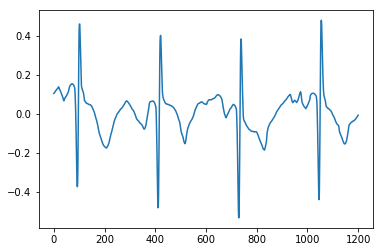

A00214
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333]


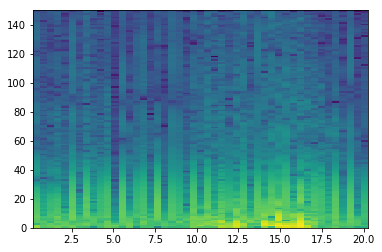

good List
[1, 2, 11, 13, 16, 18, 21, 45, 46]
[1, 9, 2, 3, 2, 3, 24, 1]
the temp 3
[[1], [], [], [], [], []]
[1, 2]
longest
[1, 2]
indexList
[1, 2]
theMin
0
theMax
300


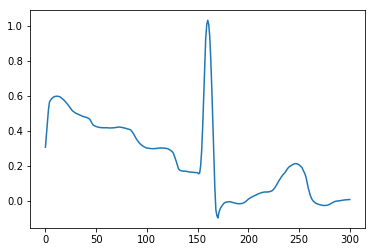

A00219
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


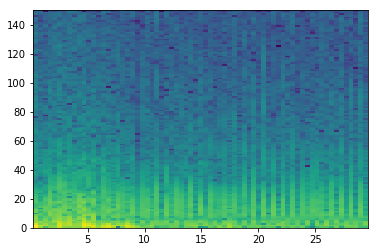

good List
[21, 22, 26, 28, 35, 44, 46, 50, 64, 66]
[1, 4, 2, 7, 9, 2, 4, 14, 2]
the temp 3
[[1], [], [], [], [], [], [], []]
[21, 22]
longest
[21, 22]
indexList
[21, 22]
theMin
2700
theMax
3000


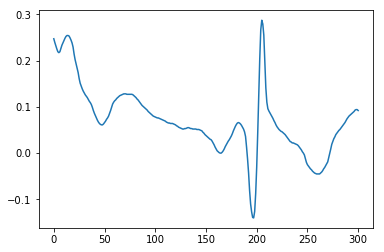

A00221
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24      ]


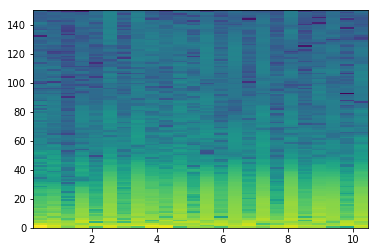

good List
[2, 4, 17, 22]
[2, 13, 5]
the temp 3
[[], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


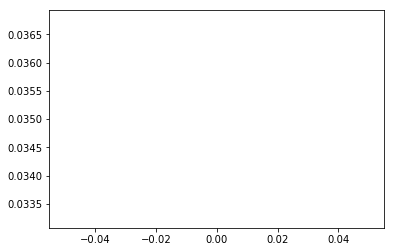

A00222
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


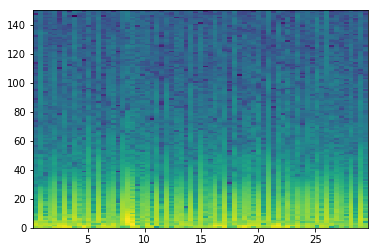

good List
[0, 2, 3, 5, 7, 10, 12, 14, 17, 24, 26, 28, 31, 33, 35, 36, 40, 42, 47, 49, 53, 55, 57, 61, 64, 66]
[2, 1, 2, 2, 3, 2, 2, 3, 7, 2, 2, 3, 2, 2, 1, 4, 2, 5, 2, 4, 2, 2, 4, 3, 2]
the temp 3
[[], [2], [], [], [], [], [], [], [], [], [], [], [], [15], [], [], [], [], [], [], [], [], []]
[2, 3]
longest
[2, 3]
indexList
[2, 3]
theMin
300
theMax
600


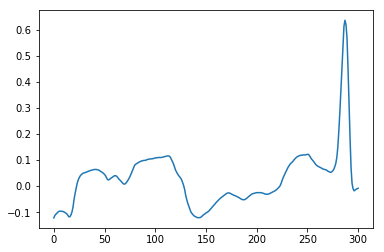

A00223
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


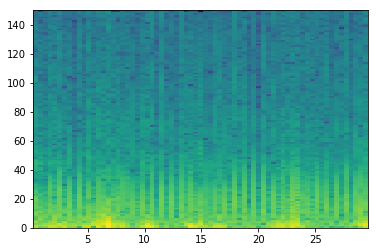

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


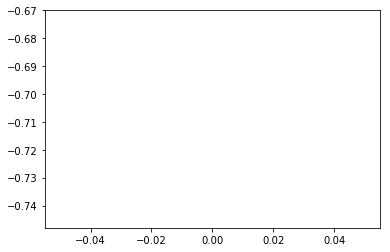

A00224
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667]


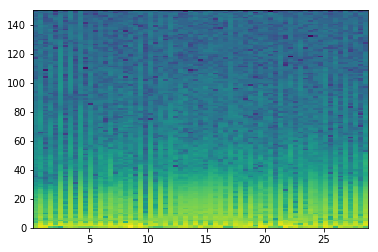

good List
[0, 2, 3, 4, 6, 8, 10, 12, 14, 16, 18, 19, 20, 22, 24, 26, 29, 30, 31, 33, 35, 36, 37, 38, 42, 44, 45, 46, 48, 49, 50, 52, 54, 57, 58, 59, 61, 63, 65]
[2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 3, 1, 1, 2, 2, 1, 1, 1, 4, 2, 1, 1, 2, 1, 1, 2, 2, 3, 1, 1, 2, 2, 2]
the temp 3
[[], [2, 3], [], [], [], [], [], [], [11, 12], [], [], [], [17, 18], [], [21, 22, 23], [], [26, 27], [29, 30], [], [], [34, 35], [], []]
[35, 36, 37, 38]
longest
[35, 36, 37, 38]
indexList
[35, 36, 37, 38]
theMin
4500
theMax
4800


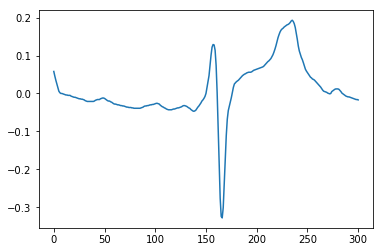

A00226
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


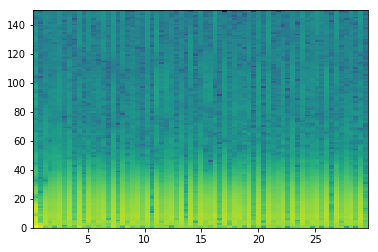

good List
[6, 8, 9, 10, 13, 15, 17, 19, 21, 22, 24, 26, 31, 33, 35, 36, 38, 40, 41, 42, 45, 47, 49, 50, 52, 54, 56, 59, 61, 63, 66, 68]
[2, 1, 1, 3, 2, 2, 2, 2, 1, 2, 2, 5, 2, 2, 1, 2, 2, 1, 1, 3, 2, 2, 1, 2, 2, 2, 3, 2, 2, 3, 2]
the temp 3
[[], [2, 3], [], [], [], [], [9], [], [], [], [], [15], [], [18, 19], [], [], [23], [], [], [], [], [], [], []]
[8, 9, 10]
longest
[8, 9, 10]
indexList
[8, 9, 10]
theMin
900
theMax
1200


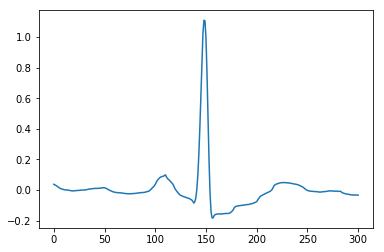

A00227
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


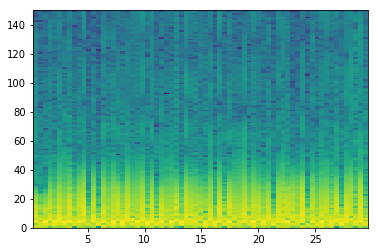

good List
[1, 2, 8, 11, 12, 13, 23, 30, 32, 37, 44, 49, 53, 54, 58]
[1, 6, 3, 1, 1, 10, 7, 2, 5, 7, 5, 4, 1, 4]
the temp 3
[[1], [], [4, 5], [], [], [], [], [], [], [13]]
[11, 12, 13]
longest
[11, 12, 13]
indexList
[11, 12, 13]
theMin
1500
theMax
1800


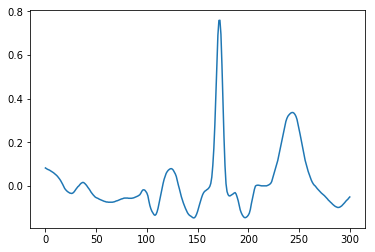

A00228
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


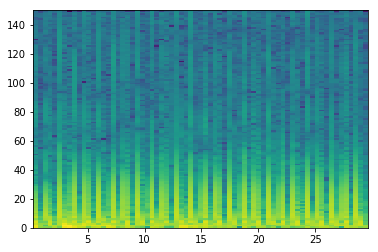

good List
[1, 3, 4, 6, 7, 9, 12, 14, 15, 17, 20, 22, 23, 25, 28, 30, 31, 33, 34, 36, 37, 38, 39, 41, 42, 44, 47, 49, 50, 52, 54, 55, 57, 60, 62, 63, 65, 67, 68]
[2, 1, 2, 1, 2, 3, 2, 1, 2, 3, 2, 1, 2, 3, 2, 1, 2, 1, 2, 1, 1, 1, 2, 1, 2, 3, 2, 1, 2, 2, 1, 2, 3, 2, 1, 2, 2, 1]
the temp 3
[[], [2], [4], [], [], [8], [], [], [12], [], [], [16], [18], [20, 21, 22], [24], [], [], [28], [], [31], [], [], [35], []]
[36, 37, 38, 39]
longest
[36, 37, 38, 39]
indexList
[36, 37, 38, 39]
theMin
4500
theMax
5100


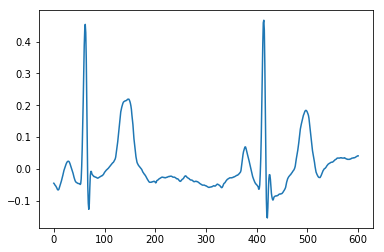

A00229
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


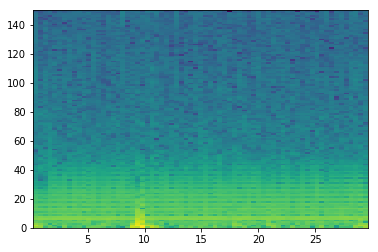

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


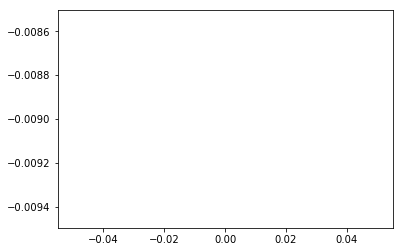

A00230
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


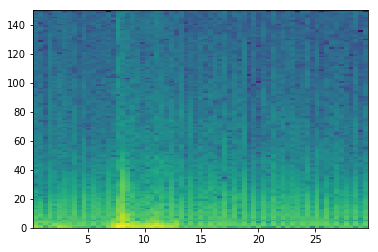

good List
[2, 9, 11, 31, 44, 45, 46, 57, 64, 65, 67]
[7, 2, 20, 13, 1, 1, 11, 7, 1, 2]
the temp 3
[[], [], [], [], [5, 6], [], [9]]
[44, 45, 46]
longest
[44, 45, 46]
indexList
[44, 45, 46]
theMin
5700
theMax
6000


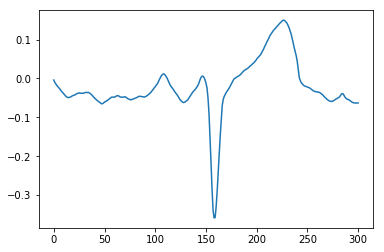

A00232
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


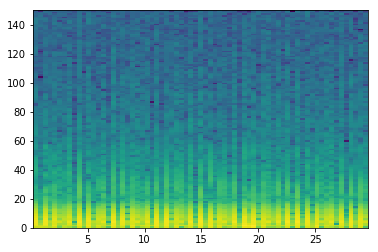

good List
[1, 6, 8, 10, 12, 13, 15, 19, 24, 26, 31, 33, 35, 37, 40, 42, 51, 55, 57, 62, 64]
[5, 2, 2, 2, 1, 2, 4, 5, 2, 5, 2, 2, 2, 3, 2, 9, 4, 2, 5, 2]
the temp 3
[[], [], [], [], [5], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[12, 13]
longest
[12, 13]
indexList
[12, 13]
theMin
1500
theMax
1800


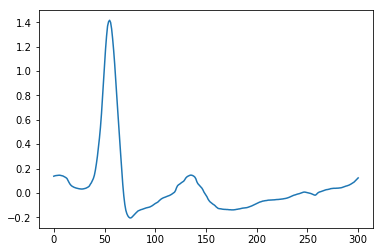

A00233
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


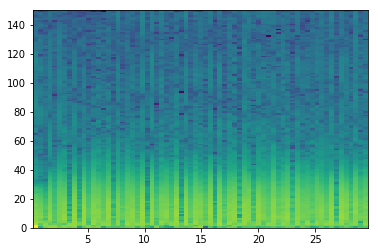

good List
[0, 1, 2, 4, 7, 9, 16, 18, 21, 23, 25, 27, 30, 31, 32, 35, 37, 39, 42, 45, 53, 55, 64]
[1, 1, 2, 3, 2, 7, 2, 3, 2, 2, 2, 3, 1, 1, 3, 2, 2, 3, 3, 8, 2, 9]
the temp 3
[[1, 2], [], [], [], [], [], [], [], [], [], [13, 14], [], [], [], [], [], [], []]
[0, 1, 2]
longest
[0, 1, 2]
indexList
[0, 1, 2]
theMin
0
theMax
300


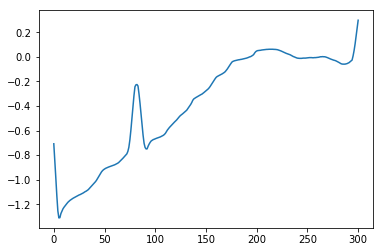

A00234
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


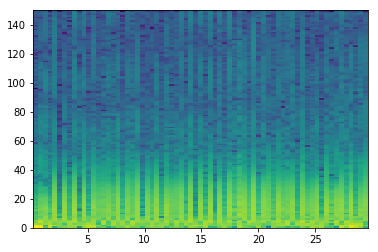

good List
[5, 7, 9, 11, 13, 18, 22, 23, 26, 31, 37, 39, 44, 54, 56, 59, 66]
[2, 2, 2, 2, 5, 4, 1, 3, 5, 6, 2, 5, 10, 2, 3, 7]
the temp 3
[[], [], [], [], [], [], [7], [], [], [], [], [], [], [], []]
[22, 23]
longest
[22, 23]
indexList
[22, 23]
theMin
2700
theMax
3000


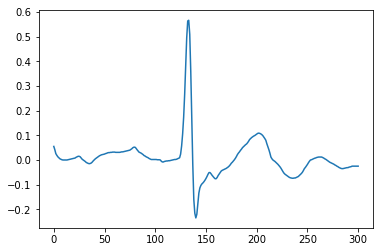

A00235
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64      ]


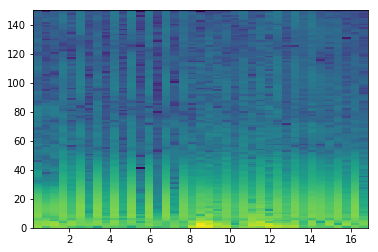

good List
[6, 8, 10, 12, 14, 16, 31, 33]
[2, 2, 2, 2, 2, 15, 2]
the temp 3
[[], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


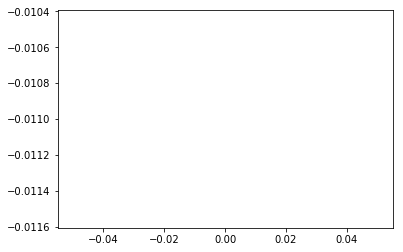

A00236
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8       ]


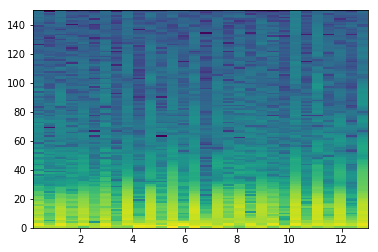

good List
[5, 9, 15, 21, 22, 24, 28]
[4, 6, 6, 1, 2, 4]
the temp 3
[[], [], [], [4], []]
[21, 22]
longest
[21, 22]
indexList
[21, 22]
theMin
2700
theMax
3000


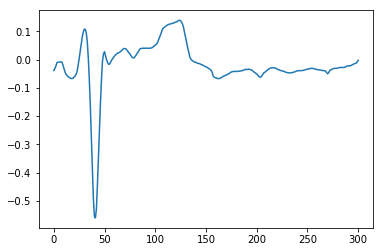

A00237
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


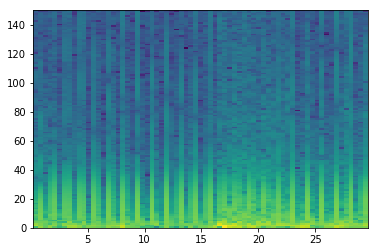

good List
[2, 3, 5, 6, 7, 8, 11, 13, 14, 17, 19, 20, 22, 23, 26, 28, 29, 31, 34, 35, 37, 54, 55, 57, 58, 60, 61, 63, 66, 67]
[1, 2, 1, 1, 1, 3, 2, 1, 3, 2, 1, 2, 1, 3, 2, 1, 2, 3, 1, 2, 17, 1, 2, 1, 2, 1, 2, 3, 1]
the temp 3
[[1], [3, 4, 5], [], [8], [], [11], [13], [], [16], [], [19], [], [22], [24], [26], []]
[5, 6, 7, 8]
longest
[5, 6, 7, 8]
indexList
[5, 6, 7, 8]
theMin
600
theMax
900


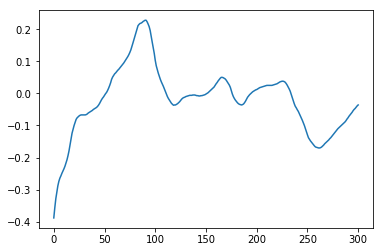

A00238
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


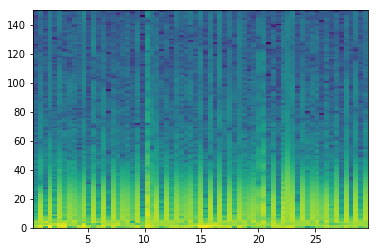

good List
[0, 4, 9, 11, 13, 15, 18, 20, 22, 28, 33, 35, 37, 39, 41, 48, 50, 54, 59, 63, 65, 67]
[4, 5, 2, 2, 2, 3, 2, 2, 6, 5, 2, 2, 2, 2, 7, 2, 4, 5, 4, 2, 2]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


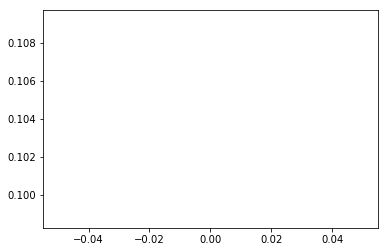

A00239
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667]


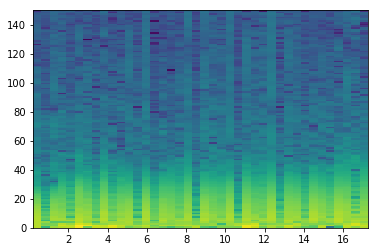

good List
[1, 7, 10, 12, 14, 16, 17, 19, 24, 29, 31, 32]
[6, 3, 2, 2, 2, 1, 2, 5, 5, 2, 1]
the temp 3
[[], [], [], [], [], [6], [], [], []]
[16, 17]
longest
[16, 17]
indexList
[16, 17]
theMin
2100
theMax
2400


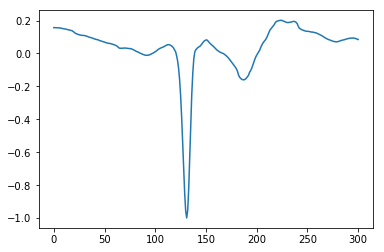

A00240
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


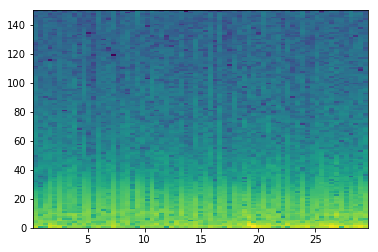

good List
[11, 12, 40]
[1, 28]
the temp 3
[[1]]
[11, 12]
longest
[11, 12]
indexList
[11, 12]
theMin
1500
theMax
1800


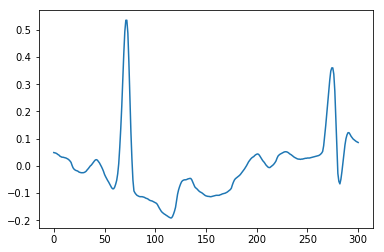

A00241
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

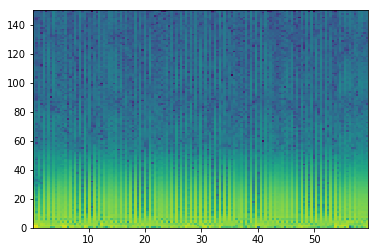

good List
[1, 3, 5, 7, 14, 16, 18, 20, 22, 24, 35, 37, 39, 40, 41, 43, 45, 47, 52, 54, 56, 58, 60, 62, 64, 66, 67, 68, 70, 72, 74, 76, 78, 80, 82, 87, 89, 91, 93, 95, 101, 104, 106, 108, 110, 112, 114, 116, 118, 120, 122, 124, 126, 128, 132]
[2, 2, 2, 7, 2, 2, 2, 2, 2, 11, 2, 2, 1, 1, 2, 2, 2, 5, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 5, 2, 2, 2, 2, 6, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 4]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [13, 14], [], [], [], [], [], [], [], [], [], [], [26, 27], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[39, 40, 41]
longest
[39, 40, 41]
indexList
[39, 40, 41]
theMin
5100
theMax
5400


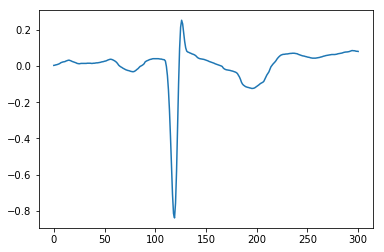

A00242
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


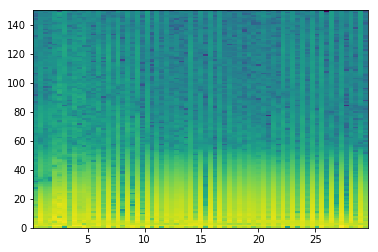

good List
[0, 14, 18, 22, 24, 26, 33, 35, 37, 39, 48, 50, 54, 56, 58, 60, 62, 64, 66, 68]
[14, 4, 4, 2, 2, 7, 2, 2, 2, 9, 2, 4, 2, 2, 2, 2, 2, 2, 2]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


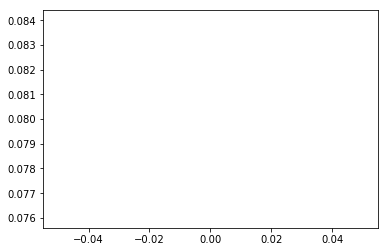

A00244
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


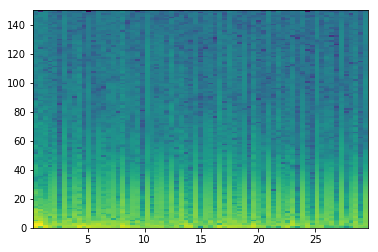

good List
[5, 7, 10, 12, 17, 19, 22, 24, 27, 31, 32, 34, 37, 42, 44, 47, 49, 51, 54, 56, 57, 59, 60, 61, 62, 64, 65, 67]
[2, 3, 2, 5, 2, 3, 2, 3, 4, 1, 2, 3, 5, 2, 3, 2, 2, 3, 2, 1, 2, 1, 1, 1, 2, 1, 2]
the temp 3
[[], [], [], [], [], [], [], [], [], [10], [], [], [], [], [], [], [], [], [20], [22, 23, 24], [26]]
[59, 60, 61, 62]
longest
[59, 60, 61, 62]
indexList
[59, 60, 61, 62]
theMin
7500
theMax
7800


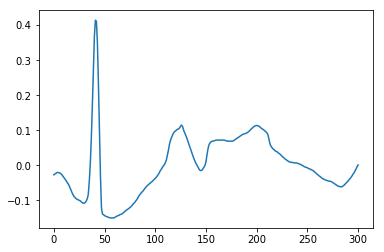

A00245
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

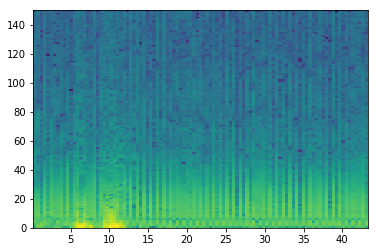

good List
[2, 4, 7, 9, 17, 19, 32, 34, 36, 40, 42, 43, 44, 52, 53, 55, 57, 61, 63, 72, 76, 78, 80, 82, 87, 89, 91, 93]
[2, 3, 2, 8, 2, 13, 2, 2, 4, 2, 1, 1, 8, 1, 2, 2, 4, 2, 9, 4, 2, 2, 2, 5, 2, 2, 2]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [11, 12], [14], [], [], [], [], [], [], [], [], [], [], [], []]
[42, 43, 44]
longest
[42, 43, 44]
indexList
[42, 43, 44]
theMin
5400
theMax
5700


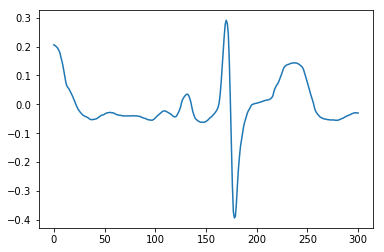

A00248
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


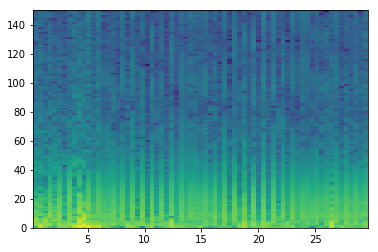

good List
[23, 27, 38, 46, 48]
[4, 11, 8, 2]
the temp 3
[[], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


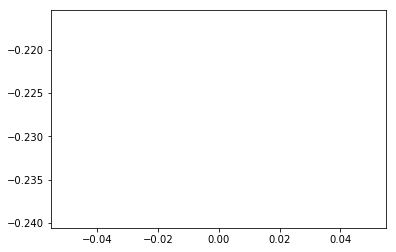

A00249
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


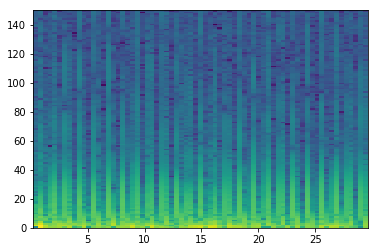

good List
[0, 2, 3, 5, 8, 10, 11, 14, 16, 17, 19, 20, 22, 25, 28, 30, 33, 35, 36, 38, 40, 41, 43, 44, 46, 47, 49, 52, 54, 55, 57, 58, 60, 61, 62, 63, 66, 68]
[2, 1, 2, 3, 2, 1, 3, 2, 1, 2, 1, 2, 3, 3, 2, 3, 2, 1, 2, 2, 1, 2, 1, 2, 1, 2, 3, 2, 1, 2, 1, 2, 1, 1, 1, 3, 2]
the temp 3
[[], [2], [], [], [6], [], [9], [11], [], [], [], [], [], [18], [], [21], [23], [25], [], [], [29], [31], [33, 34, 35], []]
[60, 61, 62, 63]
longest
[60, 61, 62, 63]
indexList
[60, 61, 62, 63]
theMin
7800
theMax
8100


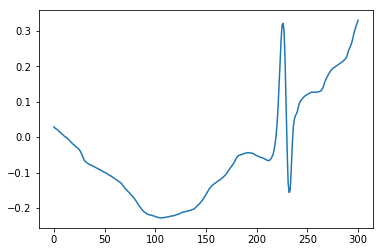

A00250
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

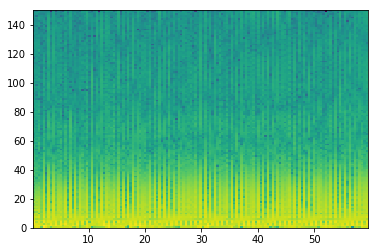

good List
[1, 3, 5, 9, 12, 14, 16, 18, 21, 23, 25, 29, 34, 38, 47, 49, 51, 55, 59, 66, 68, 70, 72, 79, 81, 83, 92, 105, 107, 109, 111, 115, 120, 124, 126]
[2, 2, 4, 3, 2, 2, 2, 3, 2, 2, 4, 5, 4, 9, 2, 2, 4, 4, 7, 2, 2, 2, 7, 2, 2, 9, 13, 2, 2, 2, 4, 5, 4, 2]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


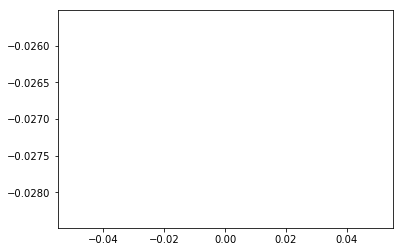

A00254
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


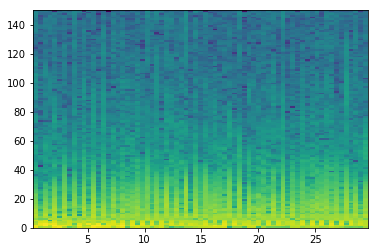

good List
[1, 3, 7, 9, 11, 13, 15, 22, 32, 34, 43, 45, 52, 54, 56, 65]
[2, 4, 2, 2, 2, 2, 7, 10, 2, 9, 2, 7, 2, 2, 9]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


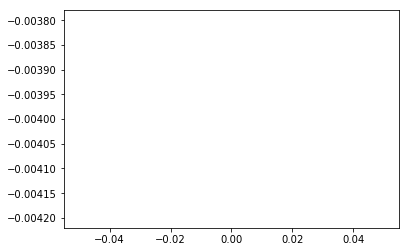

A00256
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


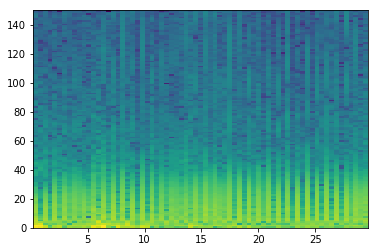

good List
[21, 23, 36, 47, 51, 53, 57]
[2, 13, 11, 4, 2, 4]
the temp 3
[[], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


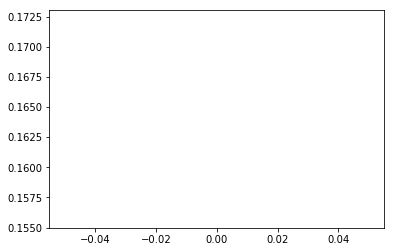

A00257
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333]


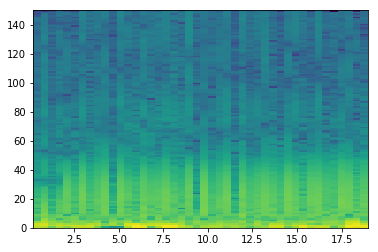

good List
[2, 28]
[26]
the temp 3
[[]]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


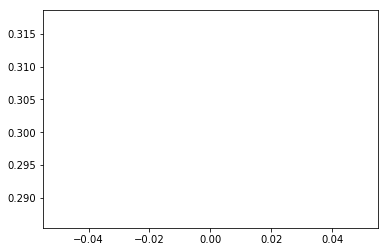

A00258
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667]


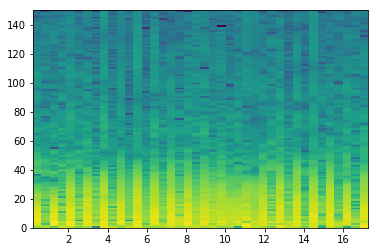

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


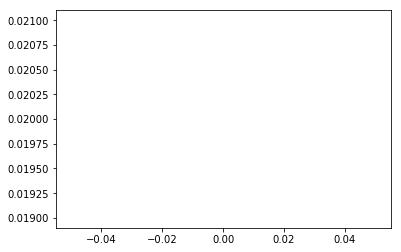

A00261
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

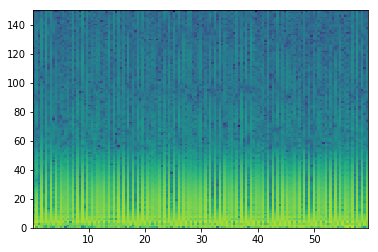

good List
[0, 4, 6, 15, 17, 19, 21, 24, 27, 28, 30, 32, 34, 36, 38, 40, 42, 44, 46, 51, 53, 55, 57, 59, 61, 68, 70, 72, 74, 76, 78, 81, 83, 85, 87, 89, 92, 94, 96, 98, 100, 102, 104, 105, 106, 107, 109, 110, 111, 113, 115, 116, 117, 118, 120, 122, 124, 126, 128, 129, 131, 133, 135, 137]
[4, 2, 9, 2, 2, 2, 3, 3, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 5, 2, 2, 2, 2, 2, 7, 2, 2, 2, 2, 2, 3, 2, 2, 2, 2, 3, 2, 2, 2, 2, 2, 2, 1, 1, 1, 2, 1, 1, 2, 2, 1, 1, 1, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2]
the temp 3
[[], [], [], [], [], [], [], [], [9], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [43, 44, 45], [47, 48], [], [51, 52, 53], [], [], [], [], [59], [], [], []]
[104, 105, 106, 107]
longest
[104, 105, 106, 107]
indexList
[104, 105, 106, 107]
theMin
13200
theMax
13800


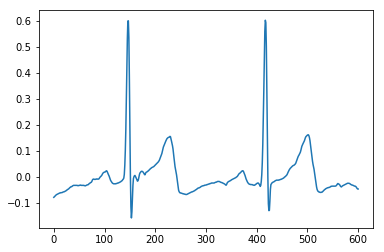

A00262
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


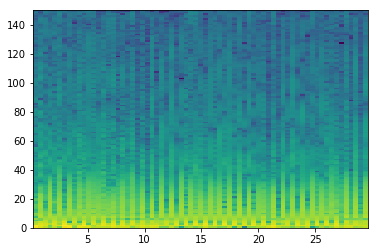

good List
[21, 23, 25, 27, 48, 50, 52, 65, 67]
[2, 2, 2, 21, 2, 2, 13, 2]
the temp 3
[[], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


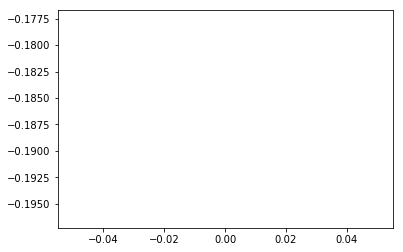

A00263
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


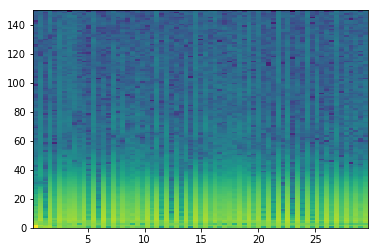

good List
[0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14, 15, 17, 18, 19, 20, 21, 22, 23, 24, 26, 28, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 51, 52, 53, 54, 55, 57, 59, 61, 62, 63, 64, 65, 66, 67, 68]
[1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[1, 2], [4, 5, 6, 7, 8, 9, 10], [12, 13], [15, 16, 17, 18, 19, 20, 21], [], [], [25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43], [45, 46, 47, 48], [], []]
[30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
longest
[30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
indexList
[30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]
theMin
3900
theMax
6300


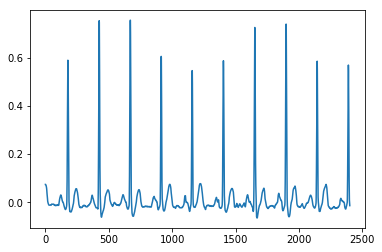

A00265
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


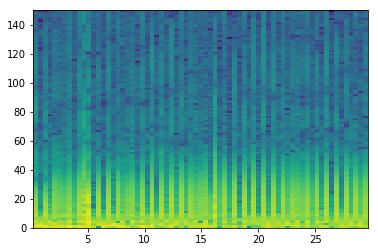

good List
[1, 3, 6, 8, 12, 13, 14, 16, 17, 18, 19, 21, 23, 25, 27, 29, 31, 33, 36, 38, 40, 42, 44, 46, 48, 50, 52, 57, 59, 61, 63, 65, 67]
[2, 3, 2, 4, 1, 1, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 3, 2, 2, 2, 2, 2, 2, 2, 2, 5, 2, 2, 2, 2, 2]
the temp 3
[[], [], [], [], [5, 6], [8, 9, 10], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[16, 17, 18, 19]
longest
[16, 17, 18, 19]
indexList
[16, 17, 18, 19]
theMin
2100
theMax
2400


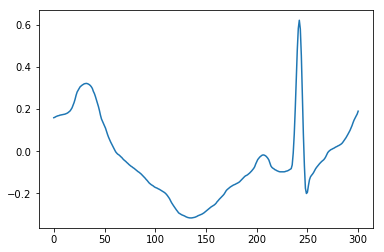

A00266
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


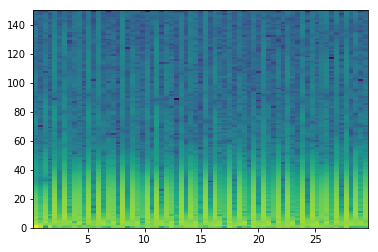

good List
[0, 1, 3, 5, 7, 8, 9, 10, 12, 14, 15, 17, 19, 21, 22, 23, 24, 26, 27, 28, 29, 31, 34, 36, 38, 39, 41, 43, 44, 46, 48, 49, 51, 53, 54, 56, 58, 59, 60, 61, 63, 65]
[1, 2, 2, 2, 1, 1, 1, 2, 2, 1, 2, 2, 2, 1, 1, 1, 2, 1, 1, 1, 2, 3, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 1, 1, 2, 2]
the temp 3
[[1], [], [], [5, 6, 7], [], [10], [], [], [14, 15, 16], [18, 19, 20], [], [], [], [25], [], [28], [], [31], [], [34], [], [37, 38, 39], []]
[7, 8, 9, 10]
longest
[7, 8, 9, 10]
indexList
[7, 8, 9, 10]
theMin
900
theMax
1200


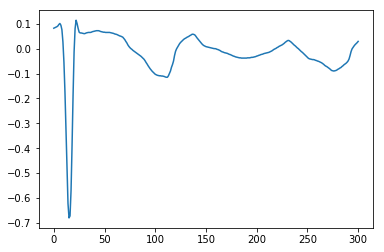

A00269
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


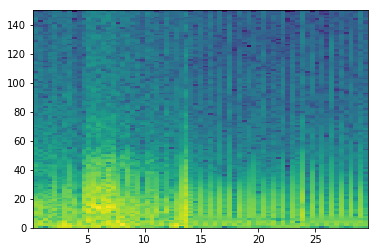

good List
[39, 41, 46, 48, 50, 52, 62]
[2, 5, 2, 2, 2, 10]
the temp 3
[[], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


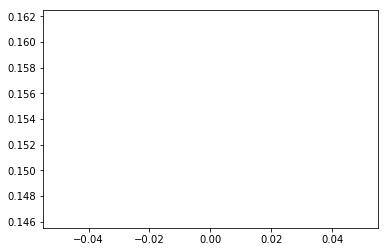

A00272
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


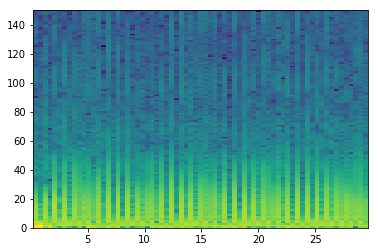

good List
[3, 18, 20, 25, 29, 38, 40, 53, 55]
[15, 2, 5, 4, 9, 2, 13, 2]
the temp 3
[[], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


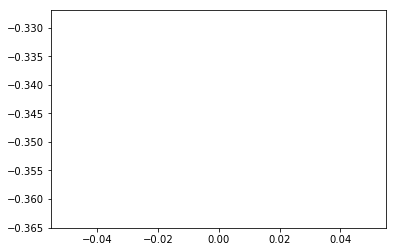

A00273
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


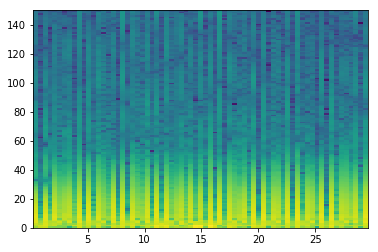

good List
[1, 8, 10, 12, 16, 17, 19, 26, 33, 37, 39, 44, 46, 48, 51, 53, 57, 58, 60, 62, 67]
[7, 2, 2, 4, 1, 2, 7, 7, 4, 2, 5, 2, 2, 3, 2, 4, 1, 2, 2, 5]
the temp 3
[[], [], [], [], [5], [], [], [], [], [], [], [], [], [], [], [17], [], []]
[16, 17]
longest
[16, 17]
indexList
[16, 17]
theMin
2100
theMax
2400


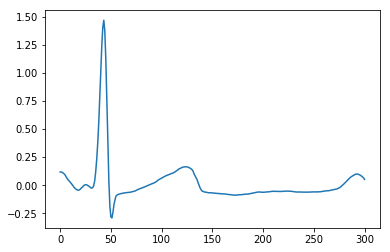

A00274
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


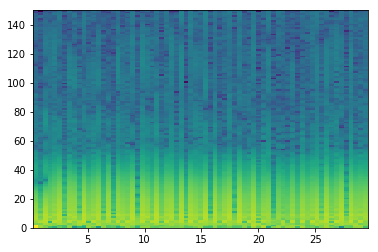

good List
[1, 6, 9, 11, 16, 21, 31, 36, 38, 41, 43, 46, 49, 51, 52, 54, 56, 64]
[5, 3, 2, 5, 5, 10, 5, 2, 3, 2, 3, 3, 2, 1, 2, 2, 8]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], [14], [], []]
[51, 52]
longest
[51, 52]
indexList
[51, 52]
theMin
6600
theMax
6900


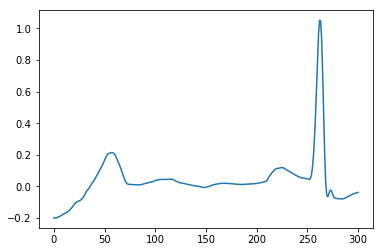

A00275
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

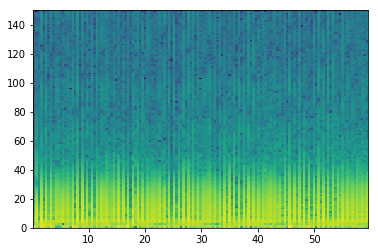

good List
[0, 2, 4, 6, 8, 11, 17, 19, 21, 25, 27, 28, 32, 34, 36, 38, 40, 44, 46, 50, 51, 55, 57, 59, 65, 67, 74, 76, 78, 82, 84, 88, 90, 92, 94, 95, 105, 107, 109, 111, 114, 115, 117, 121]
[2, 2, 2, 2, 3, 6, 2, 2, 4, 2, 1, 4, 2, 2, 2, 2, 4, 2, 4, 1, 4, 2, 2, 6, 2, 7, 2, 2, 4, 2, 4, 2, 2, 2, 1, 10, 2, 2, 2, 3, 1, 2, 4]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [11], [], [], [], [], [], [], [], [20], [], [], [], [], [], [], [], [], [], [], [], [], [], [35], [], [], [], [], [41], []]
[27, 28]
longest
[27, 28]
indexList
[27, 28]
theMin
3300
theMax
3600


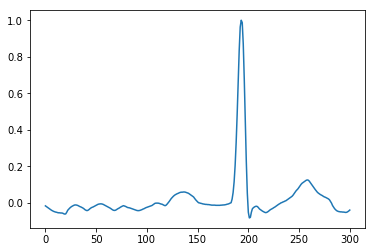

A00276
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


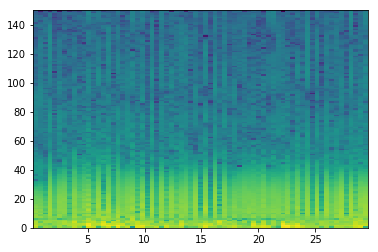

good List
[1, 2, 4, 16, 23, 25, 32, 33, 36, 40, 42, 46, 48, 57, 59]
[1, 2, 12, 7, 2, 7, 1, 3, 4, 2, 4, 2, 9, 2]
the temp 3
[[1], [], [], [], [], [7], [], [], [], [], [], []]
[1, 2]
longest
[1, 2]
indexList
[1, 2]
theMin
0
theMax
300


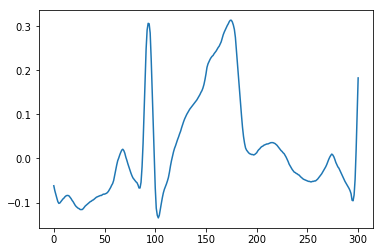

A00277
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


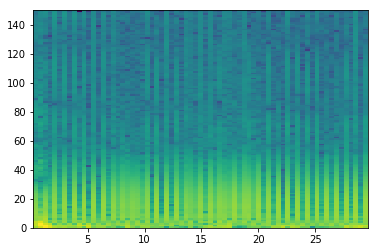

good List
[3, 5, 7, 9, 11, 13, 15, 17, 20, 21, 22, 24, 26, 28, 30, 33, 35, 39, 40, 45, 47, 49, 51, 53, 55, 57, 59, 61, 63, 65, 67]
[2, 2, 2, 2, 2, 2, 2, 3, 1, 1, 2, 2, 2, 2, 3, 2, 4, 1, 5, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]
the temp 3
[[], [], [], [], [], [], [], [], [9, 10], [], [], [], [], [], [], [18], [], [], [], [], [], [], [], [], [], [], []]
[20, 21, 22]
longest
[20, 21, 22]
indexList
[20, 21, 22]
theMin
2400
theMax
2700


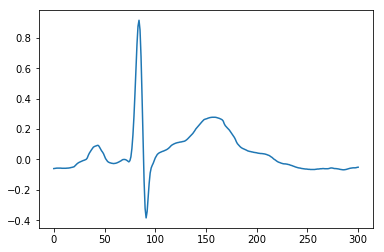

A00279
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


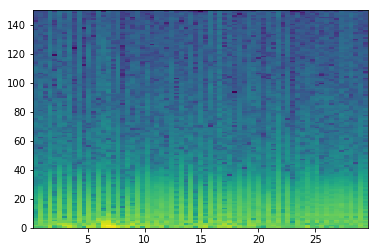

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


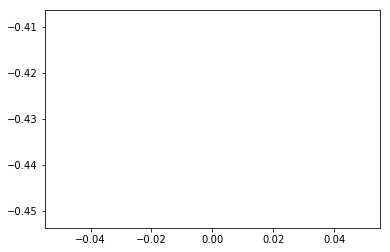

A00280
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


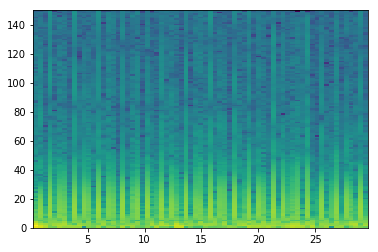

good List
[2, 4, 7, 9, 12, 16, 17, 19, 22, 24, 25, 27, 30, 32, 35, 37, 40, 43, 45, 48, 52, 55, 57, 58, 60, 63, 66, 68]
[2, 3, 2, 3, 4, 1, 2, 3, 2, 1, 2, 3, 2, 3, 2, 3, 3, 2, 3, 4, 3, 2, 1, 2, 3, 3, 2]
the temp 3
[[], [], [], [], [], [6], [], [], [10], [], [], [], [], [], [], [], [], [], [], [], [23], [], [], []]
[16, 17]
longest
[16, 17]
indexList
[16, 17]
theMin
2100
theMax
2400


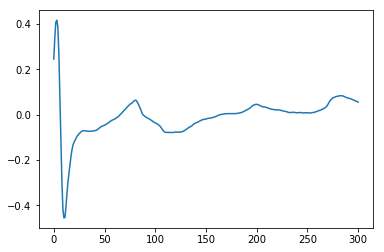

A00281
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


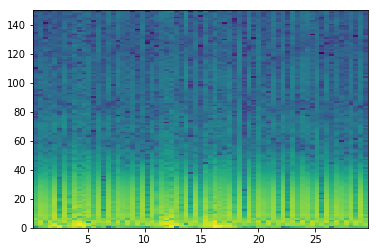

good List
[0, 2, 5, 7, 12, 14, 16, 18, 19, 20, 21, 22, 23, 25, 30, 32, 34, 35, 36, 38, 39, 41, 43, 44, 45, 47, 48, 50, 52, 54, 55, 56, 57, 59, 61, 63, 64, 65, 66, 67, 68]
[2, 3, 2, 5, 2, 2, 2, 1, 1, 1, 1, 1, 2, 5, 2, 2, 1, 1, 2, 1, 2, 2, 1, 1, 2, 1, 2, 2, 2, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1]
the temp 3
[[], [], [], [], [], [], [], [8, 9, 10, 11, 12], [], [], [], [17, 18], [20], [], [23, 24], [26], [], [], [30, 31, 32], [], []]
[18, 19, 20, 21, 22, 23]
longest
[18, 19, 20, 21, 22, 23]
indexList
[18, 19, 20, 21, 22, 23]
theMin
2400
theMax
3000


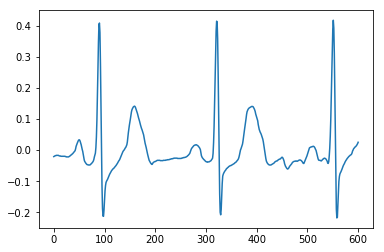

A00283
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


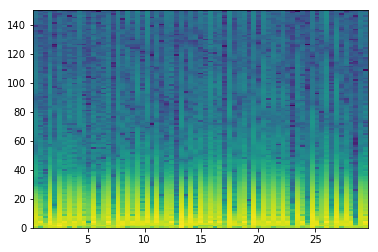

good List
[0, 2, 4, 9, 11, 13, 14, 15, 16, 17, 20, 22, 24, 26, 27, 29, 31, 35, 39, 41, 44, 53, 54, 55, 56, 58, 59, 61, 65, 66]
[2, 2, 5, 2, 2, 1, 1, 1, 1, 3, 2, 2, 2, 1, 2, 2, 4, 4, 2, 3, 9, 1, 1, 1, 2, 1, 2, 4, 1]
the temp 3
[[], [], [], [], [], [6, 7, 8, 9], [], [], [], [14], [], [], [], [], [], [], [22, 23, 24], [26], []]
[13, 14, 15, 16, 17]
longest
[13, 14, 15, 16, 17]
indexList
[13, 14, 15, 16, 17]
theMin
1500
theMax
2100


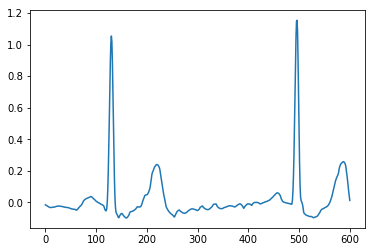

A00284
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

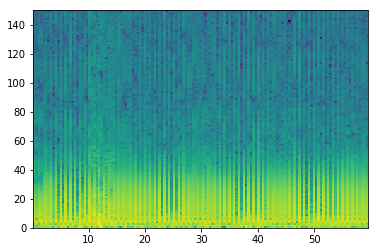

good List
[1, 2, 3, 6, 8, 10, 12, 14, 16, 18, 20, 22, 41, 43, 45, 49, 51, 53, 55, 57, 76, 78, 80, 82, 84, 86, 88, 90, 92, 96, 98, 101, 105, 109, 111, 113, 115, 119, 120, 121, 123, 125, 127, 133]
[1, 1, 3, 2, 2, 2, 2, 2, 2, 2, 2, 19, 2, 2, 4, 2, 2, 2, 2, 19, 2, 2, 2, 2, 2, 2, 2, 2, 4, 2, 3, 4, 4, 2, 2, 2, 4, 1, 1, 2, 2, 2, 6]
the temp 3
[[1, 2], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [38, 39], [], [], []]
[1, 2, 3]
longest
[1, 2, 3]
indexList
[1, 2, 3]
theMin
0
theMax
300


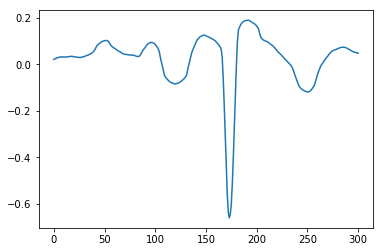

A00287
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


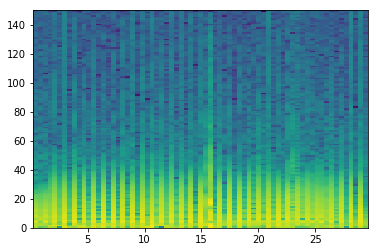

good List
[0, 5, 7, 9, 11, 13, 15, 17, 21, 23, 25, 27, 29, 31, 33, 37, 39, 40, 41, 43, 45, 49, 51, 56, 58, 59, 62, 64, 66, 68]
[5, 2, 2, 2, 2, 2, 2, 4, 2, 2, 2, 2, 2, 2, 4, 2, 1, 1, 2, 2, 4, 2, 5, 2, 1, 3, 2, 2, 2]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [17, 18], [], [], [], [], [], [25], [], [], []]
[39, 40, 41]
longest
[39, 40, 41]
indexList
[39, 40, 41]
theMin
5100
theMax
5400


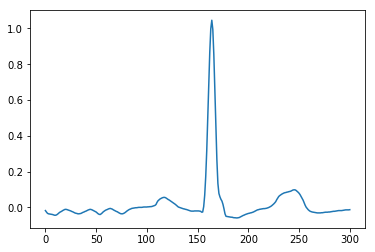

A00289
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


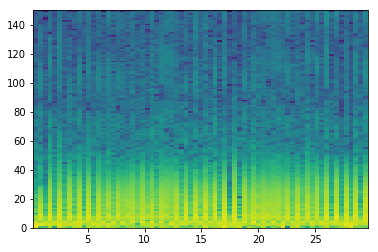

good List
[2, 4, 8, 14, 18, 19, 23, 34, 38, 40, 53, 55, 59, 61, 63, 64, 65]
[2, 4, 6, 4, 1, 4, 11, 4, 2, 13, 2, 4, 2, 2, 1, 1]
the temp 3
[[], [], [], [], [5], [], [], [], [], [], [], [], []]
[18, 19]
longest
[18, 19]
indexList
[18, 19]
theMin
2400
theMax
2700


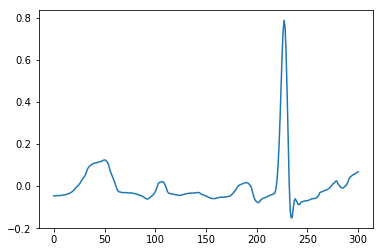

A00290
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


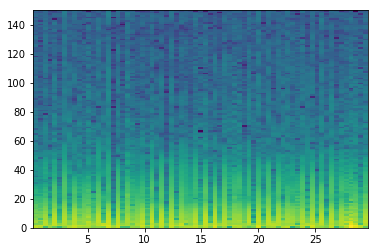

good List
[1, 5, 10, 16, 18, 21, 25, 27, 29, 32, 36, 38, 43, 45, 47, 49, 55, 58, 62, 67]
[4, 5, 6, 2, 3, 4, 2, 2, 3, 4, 2, 5, 2, 2, 2, 6, 3, 4, 5]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


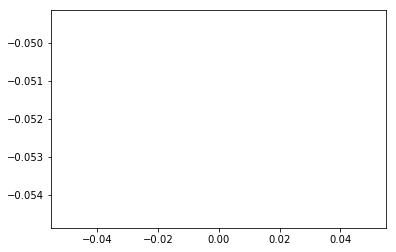

A00292
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667]


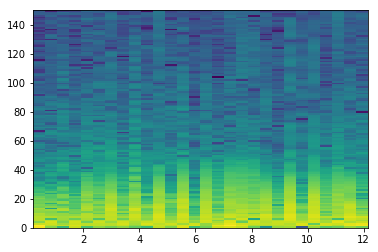

good List
[20]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


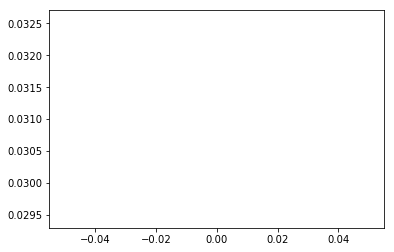

A00294
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


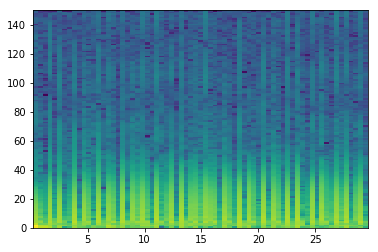

good List
[0, 1, 2, 4, 6, 7, 9, 11, 12, 14, 16, 17, 19, 21, 23, 24, 26, 27, 29, 31, 32, 34, 37, 38, 40, 41, 43, 44, 45, 46, 48, 51, 53, 55, 56, 57, 58, 60, 61, 63, 65, 66, 68]
[1, 1, 2, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2, 2, 1, 2, 1, 2, 2, 1, 2, 3, 1, 2, 1, 2, 1, 1, 1, 2, 3, 2, 2, 1, 1, 1, 2, 1, 2, 2, 1, 2]
the temp 3
[[1, 2], [], [5], [], [8], [], [11], [], [], [15], [17], [], [20], [], [23], [25], [27, 28, 29], [], [], [], [34, 35, 36], [38], [], [41]]
[43, 44, 45, 46]
longest
[43, 44, 45, 46]
indexList
[43, 44, 45, 46]
theMin
5400
theMax
6000


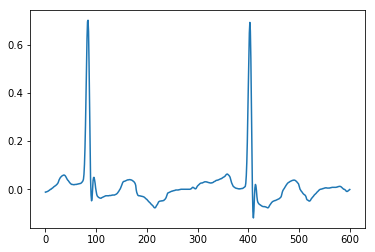

A00295
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


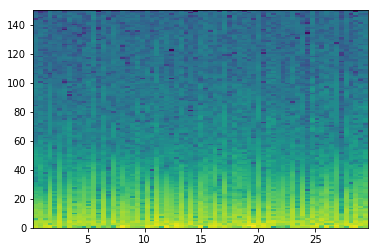

good List
[4, 6, 13, 15, 18, 26, 33, 56, 63]
[2, 7, 2, 3, 8, 7, 23, 7]
the temp 3
[[], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


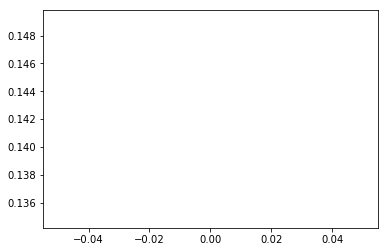

A00297
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


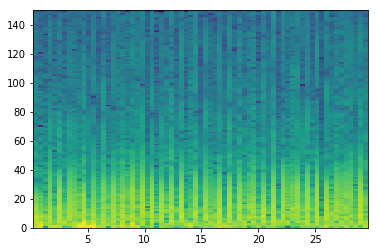

good List
[6, 11, 13, 15, 23, 34, 36, 37, 39, 48, 50, 59]
[5, 2, 2, 8, 11, 2, 1, 2, 9, 2, 9]
the temp 3
[[], [], [], [], [], [], [7], [], [], []]
[36, 37]
longest
[36, 37]
indexList
[36, 37]
theMin
4500
theMax
4800


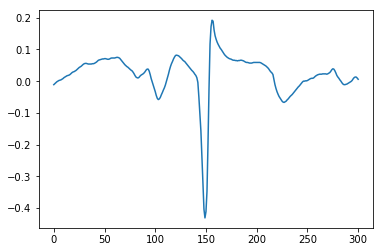

A00299
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


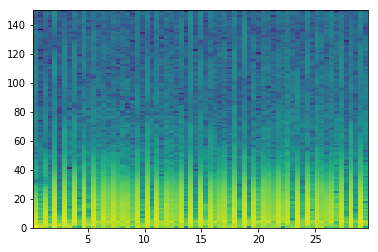

good List
[0, 1, 3, 5, 7, 9, 11, 20, 22, 24, 26, 29, 31, 33, 40, 42, 44, 46, 48, 49, 50, 55, 57, 60, 64, 66]
[1, 2, 2, 2, 2, 2, 9, 2, 2, 2, 3, 2, 2, 7, 2, 2, 2, 2, 1, 1, 5, 2, 3, 4, 2]
the temp 3
[[1], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [19, 20], [], [], [], []]
[48, 49, 50]
longest
[48, 49, 50]
indexList
[48, 49, 50]
theMin
6000
theMax
6300


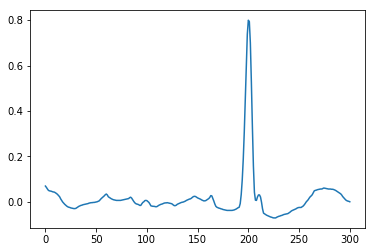

A00302
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


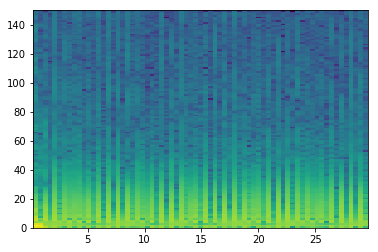

good List
[3, 5, 10, 11, 12, 14, 16, 18, 19, 20, 23, 24, 25, 26, 27, 30, 31, 32, 34, 36, 38, 40, 42, 45, 47, 49, 51, 53, 57, 58, 60, 62, 64, 66, 68]
[2, 5, 1, 1, 2, 2, 2, 1, 1, 3, 1, 1, 1, 1, 3, 1, 1, 2, 2, 2, 2, 2, 3, 2, 2, 2, 2, 4, 1, 2, 2, 2, 2, 2]
the temp 3
[[], [], [3, 4], [], [], [8, 9], [11, 12, 13, 14], [16, 17], [], [], [], [], [], [], [], [], [], [], [29], [], [], [], []]
[23, 24, 25, 26, 27]
longest
[23, 24, 25, 26, 27]
indexList
[23, 24, 25, 26, 27]
theMin
3000
theMax
3300


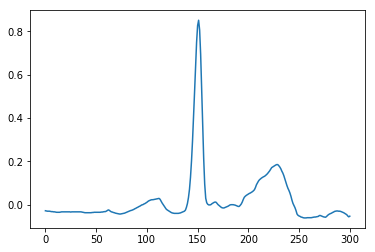

A00303
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16      ]


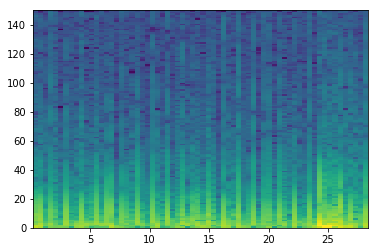

good List
[2, 5, 7, 10, 11, 16, 17, 18, 22, 27, 30, 33, 36, 39, 41, 42, 44, 47, 52, 53, 55]
[3, 2, 3, 1, 5, 1, 1, 4, 5, 3, 3, 3, 3, 2, 1, 2, 3, 5, 1, 2]
the temp 3
[[], [], [], [4], [6, 7], [], [], [], [], [], [], [15], [], [], [19]]
[16, 17, 18]
longest
[16, 17, 18]
indexList
[16, 17, 18]
theMin
2100
theMax
2400


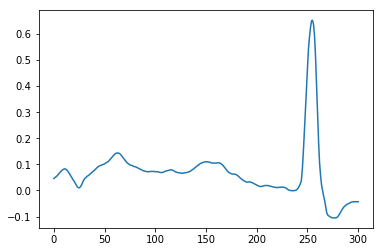

A00304
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

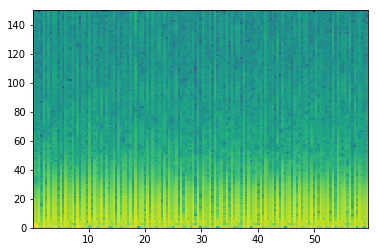

good List
[3, 5, 10, 12, 17, 19, 27, 29, 31, 32, 34, 36, 39, 43, 44, 48, 53, 55, 58, 60, 62, 67, 69, 72, 74, 76, 79, 86, 88, 90, 95, 98, 100, 102, 107, 114, 125, 132, 137]
[2, 5, 2, 5, 2, 8, 2, 2, 1, 2, 2, 3, 4, 1, 4, 5, 2, 3, 2, 2, 5, 2, 3, 2, 2, 3, 7, 2, 2, 5, 3, 2, 2, 5, 7, 11, 7, 5]
the temp 3
[[], [], [], [], [], [], [], [], [9], [], [], [], [14], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[31, 32]
longest
[31, 32]
indexList
[31, 32]
theMin
3900
theMax
4200


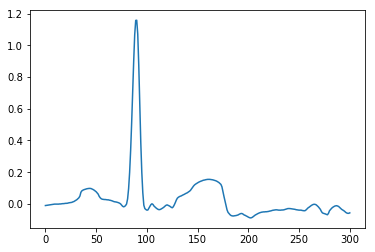

A00305
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


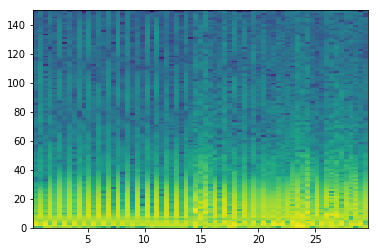

good List
[0, 2, 6, 8, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 42, 44, 46, 59]
[2, 4, 2, 4, 2, 2, 2, 2, 2, 2, 2, 2, 2, 12, 2, 2, 13]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


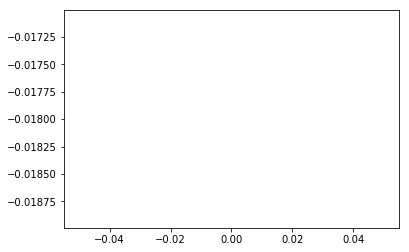

A00306
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


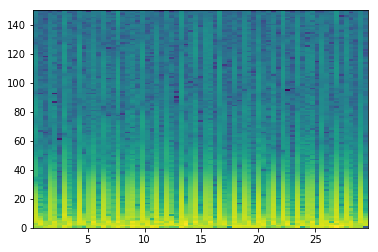

good List
[1, 2, 3, 5, 8, 10, 11, 13, 15, 16, 18, 19, 21, 23, 24, 26, 29, 31, 32, 34, 37, 39, 40, 42, 44, 45, 48, 50, 51, 53, 58, 60, 61, 63, 66, 68]
[1, 1, 2, 3, 2, 1, 2, 2, 1, 2, 1, 2, 2, 1, 2, 3, 2, 1, 2, 3, 2, 1, 2, 2, 1, 3, 2, 1, 2, 5, 2, 1, 2, 3, 2]
the temp 3
[[1, 2], [], [], [6], [], [9], [11], [], [14], [], [], [18], [], [], [22], [], [25], [], [28], [], [], [32], [], []]
[1, 2, 3]
longest
[1, 2, 3]
indexList
[1, 2, 3]
theMin
0
theMax
300


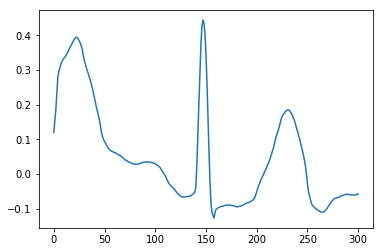

A00309
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


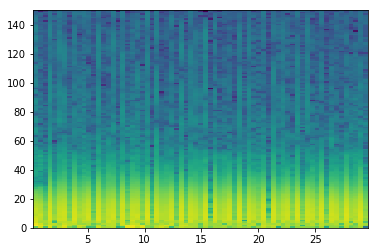

good List
[24, 31, 36, 41, 48, 60]
[7, 5, 5, 7, 12]
the temp 3
[[], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


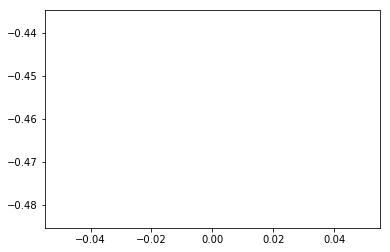

A00311
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

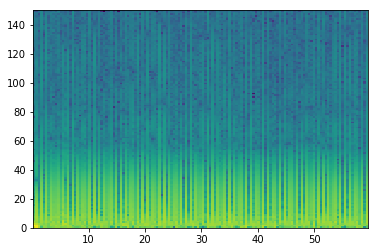

good List
[2, 4, 11, 15, 17, 22, 24, 26, 28, 33, 35, 37, 42, 44, 46, 48, 51, 53, 55, 57, 60, 62, 64, 66, 71, 73, 75, 78, 80, 82, 84, 87, 89, 91, 93, 94, 96, 98, 101, 103, 105, 108, 110, 112, 115, 117, 119, 123, 126, 128, 130, 132, 135, 137]
[2, 7, 4, 2, 5, 2, 2, 2, 5, 2, 2, 5, 2, 2, 2, 3, 2, 2, 2, 3, 2, 2, 2, 5, 2, 2, 3, 2, 2, 2, 3, 2, 2, 2, 1, 2, 2, 3, 2, 2, 3, 2, 2, 3, 2, 2, 4, 3, 2, 2, 2, 3, 2]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [35], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[93, 94]
longest
[93, 94]
indexList
[93, 94]
theMin
12000
theMax
12300


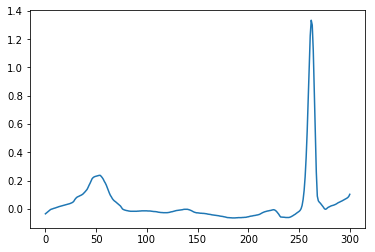

A00312
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


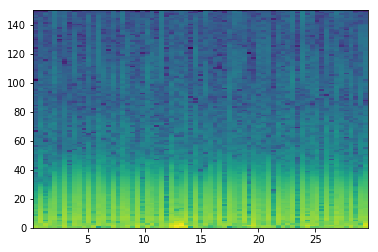

good List
[5, 59, 66]
[54, 7]
the temp 3
[[], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


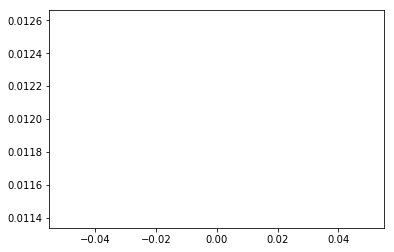

A00313
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

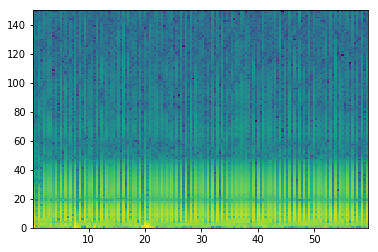

good List
[1, 3, 5, 8, 10, 12, 14, 16, 18, 20, 22, 23, 25, 27, 29, 31, 32, 33, 34, 36, 38, 40, 41, 42, 43, 45, 47, 49, 50, 51, 52, 54, 56, 58, 60, 62, 64, 66, 68, 69, 70, 71, 73, 75, 77, 79, 81, 83, 85, 87, 89, 90, 92, 94, 96, 97, 99, 100, 101, 103, 105, 107, 109, 111, 113, 115, 117, 118, 119, 120, 122, 124, 126, 128, 129, 130, 131, 133, 135, 137]
[2, 2, 3, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 1, 1, 1, 2, 2, 2, 1, 1, 1, 2, 2, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 1, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 2, 2, 2]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [11], [], [], [], [16, 17, 18], [], [], [22, 23, 24], [], [], [28, 29, 30], [], [], [], [], [], [], [], [39, 40, 41], [], [], [], [], [], [], [], [], [51], [], [], [55], [57, 58], [], [], [], [], [], [], [], [67, 68, 69], [], [], [], [74, 75, 76], [], []]
[31, 32, 33, 34]
longest
[31, 32, 33, 34]
indexList
[31, 32, 33, 34]
theMin
3900
theMax
4200


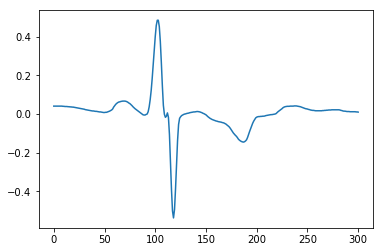

A00314
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667]


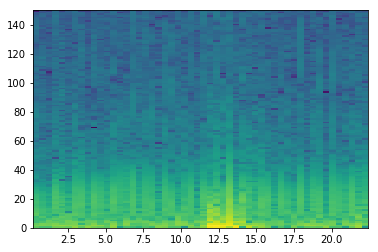

good List
[45]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


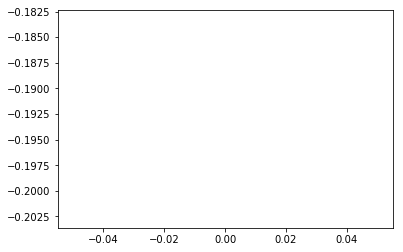

A00315
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


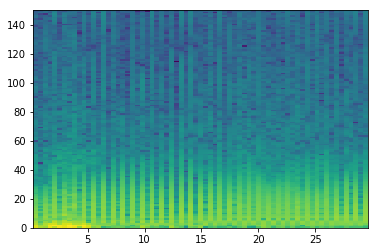

good List
[15, 25, 29, 31, 37, 39, 63]
[10, 4, 2, 6, 2, 24]
the temp 3
[[], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


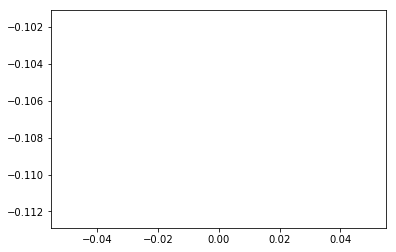

A00316
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333]


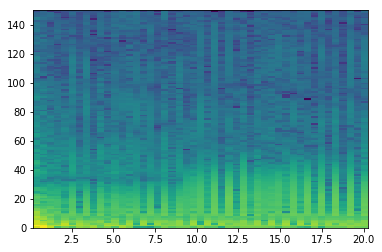

good List
[6, 8, 16, 17, 19, 21, 26, 28, 30, 32, 34, 36, 37, 38, 39, 41, 43, 45]
[2, 8, 1, 2, 2, 5, 2, 2, 2, 2, 2, 1, 1, 1, 2, 2, 2]
the temp 3
[[], [], [3], [], [], [], [], [], [], [], [12, 13, 14], [], []]
[36, 37, 38, 39]
longest
[36, 37, 38, 39]
indexList
[36, 37, 38, 39]
theMin
4500
theMax
5100


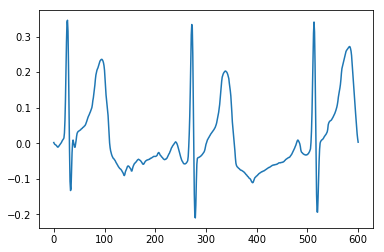

A00318
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


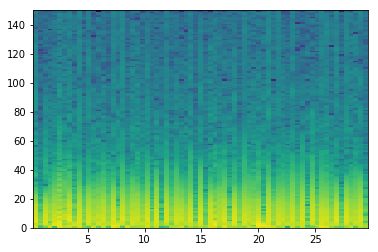

good List
[1, 3, 10, 15, 19, 24, 28, 30, 33, 34, 35, 42, 54, 58, 63, 68]
[2, 7, 5, 4, 5, 4, 2, 3, 1, 1, 7, 12, 4, 5, 5]
the temp 3
[[], [], [], [], [], [], [], [], [9, 10], [], [], [], []]
[33, 34, 35]
longest
[33, 34, 35]
indexList
[33, 34, 35]
theMin
4200
theMax
4500


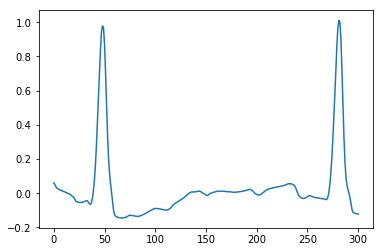

A00319
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


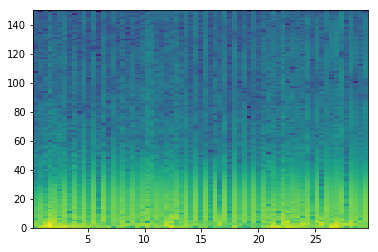

good List
[11, 30, 32, 34, 36, 40, 57, 64]
[19, 2, 2, 2, 4, 17, 7]
the temp 3
[[], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


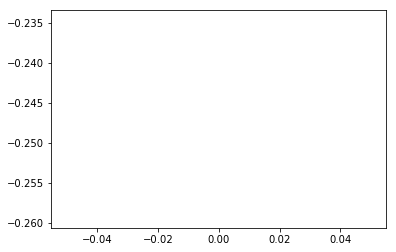

A00320
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


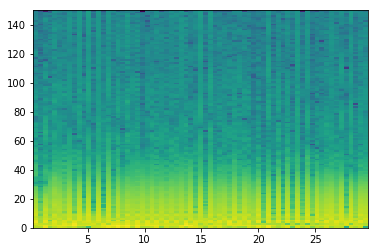

good List
[1, 3, 10, 12, 14, 16, 18, 20, 22, 23, 26, 27, 30, 35, 37, 39, 40, 43, 45, 46, 47, 49, 51, 53, 55, 57, 59, 61, 64, 66, 68]
[2, 7, 2, 2, 2, 2, 2, 2, 1, 3, 1, 3, 5, 2, 2, 1, 3, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 3, 2, 2]
the temp 3
[[], [], [], [], [], [], [], [], [9], [11], [], [], [], [16], [], [19, 20], [], [], [], [], [], [], [], [], []]
[45, 46, 47]
longest
[45, 46, 47]
indexList
[45, 46, 47]
theMin
5700
theMax
6000


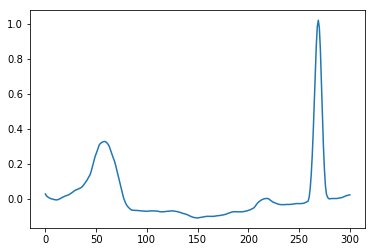

A00322
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


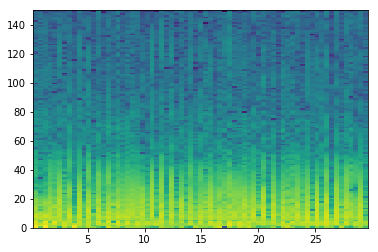

good List
[12, 23, 41, 50, 61]
[11, 18, 9, 11]
the temp 3
[[], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


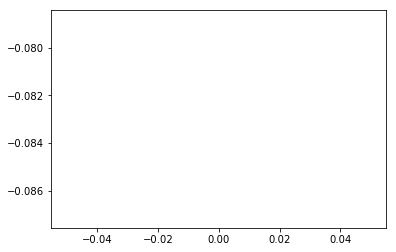

A00323
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333]


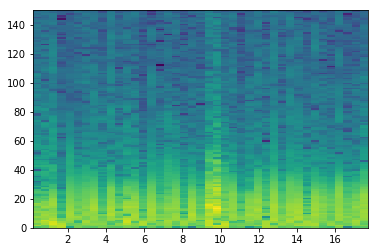

good List
[3, 5, 13]
[2, 8]
the temp 3
[[], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


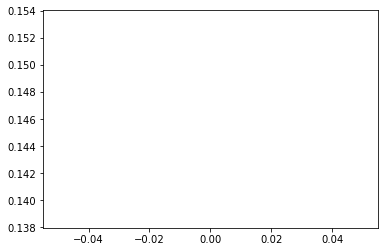

A00328
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


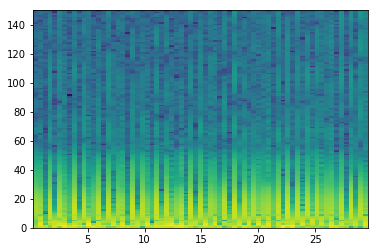

good List
[0, 1, 2, 4, 6, 7, 9, 11, 12, 14, 16, 19, 21, 24, 26, 27, 28, 29, 31, 33, 35, 36, 37, 38, 40, 44, 45, 46, 47, 49, 51, 53, 55, 60, 62, 64, 65, 66, 67, 68]
[1, 1, 2, 2, 1, 2, 2, 1, 2, 2, 3, 2, 3, 2, 1, 1, 1, 2, 2, 2, 1, 1, 1, 2, 4, 1, 1, 1, 2, 2, 2, 2, 5, 2, 2, 1, 1, 1, 1]
the temp 3
[[1, 2], [], [5], [], [8], [], [], [], [], [], [15, 16, 17], [], [], [21, 22, 23], [], [26, 27, 28], [], [], [], [], [], []]
[26, 27, 28, 29]
longest
[26, 27, 28, 29]
indexList
[26, 27, 28, 29]
theMin
3300
theMax
3600


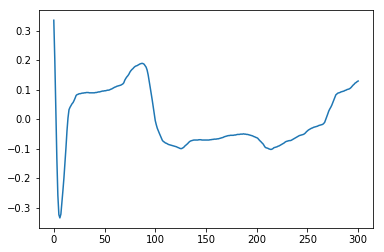

A00330
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


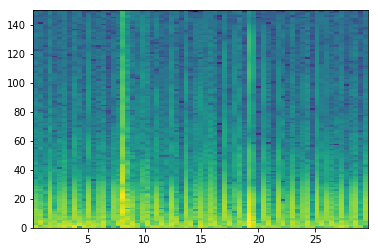

good List
[2, 7, 10, 12, 15, 24, 26, 30, 32, 38, 40, 43, 46, 49, 52, 57, 64, 67]
[5, 3, 2, 3, 9, 2, 4, 2, 6, 2, 3, 3, 3, 3, 5, 7, 3]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


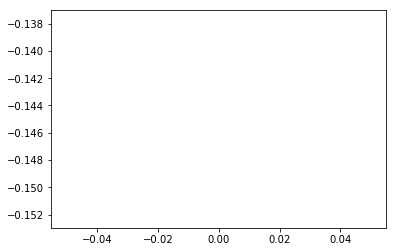

A00331
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667]


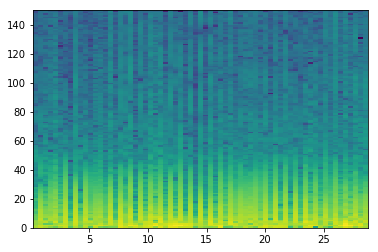

good List
[7, 14, 16, 20, 32, 34, 59]
[7, 2, 4, 12, 2, 25]
the temp 3
[[], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


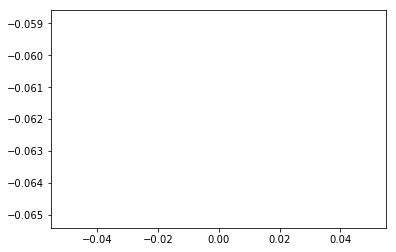

A00332
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


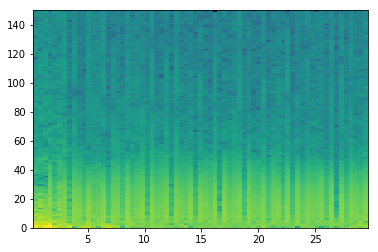

good List
[15, 33, 38, 43, 45, 53, 55, 60, 62, 64]
[18, 5, 5, 2, 8, 2, 5, 2, 2]
the temp 3
[[], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


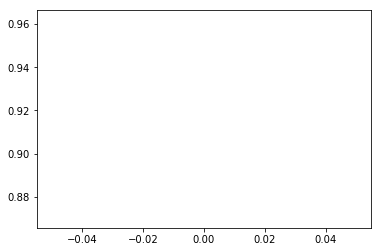

A00333
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


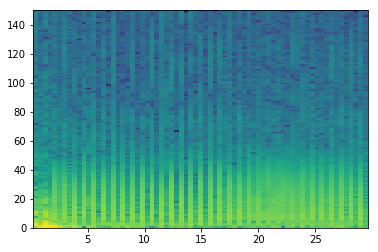

good List
[7, 9, 13, 15, 17, 19, 21, 23, 25, 27, 31, 35, 37, 41, 43, 60, 62, 66]
[2, 4, 2, 2, 2, 2, 2, 2, 2, 4, 4, 2, 4, 2, 17, 2, 4]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


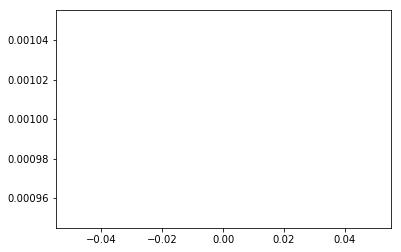

A00334
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


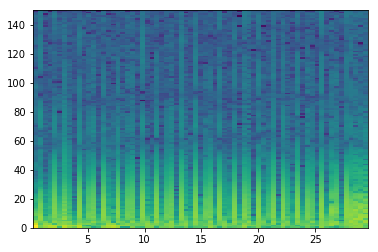

good List
[0, 2, 3, 5, 7, 8, 10, 11, 13, 14, 15, 16, 18, 19, 20, 21, 23, 24, 26, 27, 29, 31, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 44, 45, 46, 47, 48, 50, 51, 52, 53, 55, 56, 57, 58, 60, 62, 63]
[2, 1, 2, 2, 1, 2, 1, 2, 1, 1, 1, 2, 1, 1, 1, 2, 1, 2, 1, 2, 2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 2, 2, 1]
the temp 3
[[], [2], [], [5], [7], [9, 10, 11], [13, 14, 15], [17], [19], [], [22], [24, 25, 26, 27, 28, 29, 30, 31], [33, 34, 35, 36], [38, 39, 40], [42, 43, 44], []]
[34, 35, 36, 37, 38, 39, 40, 41, 42]
longest
[34, 35, 36, 37, 38, 39, 40, 41, 42]
indexList
[34, 35, 36, 37, 38, 39, 40, 41, 42]
theMin
4200
theMax
5400


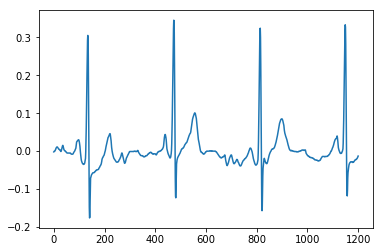

In [14]:
theCSV = open("200_set_of_Norm_AF_Rand.csv")
lineSkip = 0
for line in theCSV:
            #remove whitespace
    line = line.strip()
            #split up based off commas
    a,b,c,d = line.split(",")
            #if not at first line
    if(lineSkip != 0):
                #create plot diagram with ID at that line
        theStart(b)
    lineSkip += 1
#theStart("A00033")